# Comparing the Mean Methylation Across Datasets

This Jupyter Notebook script analyzes DNA methylation data using various statistical techniques.
It loads multiple datasets, calculates mean and variance values, and generates density plots to visualize the distribution of methylation levels.
It also compares the mean CpG beta values between different datasets and performs correlation analysis.

Summary of the analysis:
1. Load libraries and import necessary modules.
2. Load and prepare the data:
    - Load the complete methylation dataset and metadata.
    - Calculate the mean and variance of CpGs in the complete dataset.
    - Load tissue-specific methylation datasets and calculate their mean and variance.
    - Remove tissues with less than 10 samples.
3. Generate density plots:
    - Plot the mean methylation distribution for each clock dataset.
    - Plot the mean methylation distribution for each tissue dataset.
4. Compare the mean CpG beta values:
    - Calculate the correlation between the complete dataset and each tissue dataset.
    - Calculate the correlation between the clock dataset and each tissue dataset.

### 0. Load libraries

In [1]:
#### LOAD: libraries

import os
import warnings
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import matplotlib.patches as mpatches
import matplotlib.colors as mcolors
from scipy.stats import wilcoxon, ttest_ind, mannwhitneyu ,shapiro, kstest, levene, pearsonr, spearmanr, anderson
from statsmodels.stats.multitest import multipletests
import dask.dataframe as dd
from dask.distributed import Client
import itertools
from dask import delayed, compute

### 1. Load & Prepare the data

In [53]:
#### LOAD: Full methylation dataset

complete_methylation_data = pd.read_csv('../GSE223748_datBetaNormalized.csv')

In [54]:
print(f'The shape of the complete methylation dataset is: {complete_methylation_data.shape}')
complete_methylation_data.head()

In [2]:
#### LOAD: Metadata

metadata = pd.read_csv('../GSE223748_complete_metadata.csv')

In [57]:
#### LOAD: Methylation data for the complete CpGs of each clock

clock1 = pd.read_csv('../Clocks Methylation Data/Clock1_Methylation_data_complete.csv')
clock2 = pd.read_csv('../Clocks Methylation Data/Clock2_Methylation_data_complete.csv')
clock3 = pd.read_csv('../Clocks Methylation Data/Clock3_Methylation_data_complete.csv')
clock2_3 = pd.read_csv('../Clocks Methylation Data/Clock2_3_Overlap_Methylation_data_complete.csv')

clock1_human = pd.read_csv('../Clocks Methylation Data/Clock1_methylation_data_human.csv')
clock2_human = pd.read_csv('../Clocks Methylation Data/Clock2_Methylation_data_human.csv')
clock3_human = pd.read_csv('../Clocks Methylation Data/Clock3_Methylation_data_human.csv')
clock2_3_human = pd.read_csv('../Clocks Methylation Data/Clock2_3_Overlap_Methylation_data_human.csv')

In [58]:
#### LOAD: Methylation data for the top 100CpGs of each clock
clock_1_top100CpG = pd.read_csv('../Clocks Methylation Data/Clock1_100_methylation_data_complete.csv')
clock_2_top100CpG = pd.read_csv('../Clocks Methylation Data/Clock2_100_methylation_data_complete.csv')
clock_3_top100CpG = pd.read_csv('../Clocks Methylation Data/Clock3_100_methylation_data_complete.csv')
clock_2_3_top100CpG = pd.read_csv('../Clocks Methylation Data/Clock2_3_Overlap_100_methylation_data_complete.csv')

clock_1_top100CpG_human = pd.read_csv('../Clocks Methylation Data/Clock1_100_methylation_data_human.csv')
clock_2_top100CpG_human = pd.read_csv('../Clocks Methylation Data/Clock2_100_methylation_data_human.csv')
clock_3_top100CpG_human = pd.read_csv('../Clocks Methylation Data/Clock3_100_methylation_data_human.csv')
clock_2_3_top100CpG_human = pd.read_csv('../Clocks Methylation Data/Clock2_3_Overlap_100_methylation_data_human.csv')

In [59]:
#### LOAD: Methylation data for the top 200 CpGs of each clock
clock_1_top200CpG = pd.read_csv('../Clocks Methylation Data/Clock1_200_methylation_data_complete.csv')
clock_2_top200CpG = pd.read_csv('../Clocks Methylation Data/Clock2_200_methylation_data_complete.csv')
clock_3_top200CpG = pd.read_csv('../Clocks Methylation Data/Clock3_200_methylation_data_complete.csv')
clock_2_3_top200CpG = pd.read_csv('../Clocks Methylation Data/Clock2_3_Overlap_200_methylation_data_complete.csv')

clock_1_top200CpG_human = pd.read_csv('../Clocks Methylation Data/Clock1_200_methylation_data_human.csv')
clock_2_top200CpG_human = pd.read_csv('../Clocks Methylation Data/Clock2_200_methylation_data_human.csv')
clock_3_top200CpG_human = pd.read_csv('../Clocks Methylation Data/Clock3_200_methylation_data_human.csv')
clock_2_3_top200CpG_human = pd.read_csv('../Clocks Methylation Data/Clock2_3_Overlap_200_methylation_data_human.csv')

#### 1.1. Rectify the data:  
- remove the X on the sample names, so to match the metadata 
- rename the first col in the complete methylation df from Unnamed: 0 to Sample

In [3]:
# Drop the X on he the sample names in the metadata
metadata['Sample'] = metadata['Sample'].str.replace('X', '')

In [61]:
# Change Unnamed: 0 to CpG
complete_methylation_data.rename(columns={'Unnamed: 0': 'CpG'}, inplace=True)
complete_methylation_data.head()

#### 1.2. Calculate the mean and variance of the CpGs in the datasets and add it to the complete methylation df

In [62]:
#### Calculate the mean methylation for each CpG in the complete methylation dataset without overloading the memory and add it to the complete_methylation_data DataFrame

dask_df = dd.from_pandas(complete_methylation_data, npartitions=10)  # Adjust npartitions as needed
complete_methylation_data['Mean'] = dask_df.iloc[:, 1:].mean(axis=1).compute()
complete_methylation_data['Variance'] = dask_df.iloc[:, 1:].var(axis=1).compute()

In [63]:
#### Save the complete methylation data with the mean methylation

complete_methylation_data.to_csv('GSE223748_datBetaNormalized_with_mean_var.csv', index=False)

In [4]:
#### LOAD: Complete methylation data with the mean methylation with dask (Still takes 18 min )

complete_methylation_data_mean_var = pd.read_csv('GSE223748_datBetaNormalized_with_mean_var.csv')
complete_methylation_data = complete_methylation_data_mean_var # Needed to rename the variable as when its loaded it has a different name. Didn't want to change the rest of the code.

#### 1.3. Calculate the mean and variance of the CpGs in the clocks

In [ ]:
### Calculate the mean and variance methylation for each CpG in each clock and add it to the respective DataFrame without overloading the memory 

clocks = [
    clock1, clock2, clock3, clock2_3, 
    clock1_human, clock2_human, clock3_human, clock2_3_human, 
    clock_1_top100CpG, clock_2_top100CpG, clock_3_top100CpG, clock_2_3_top100CpG,
    clock_1_top100CpG_human, clock_2_top100CpG_human, clock_3_top100CpG_human, clock_2_3_top100CpG_human,
    clock_1_top200CpG, clock_2_top200CpG, clock_3_top200CpG, clock_2_3_top200CpG,
    clock_1_top200CpG_human, clock_2_top200CpG_human, clock_3_top200CpG_human, clock_2_3_top200CpG_human
]

clock_names = [
    'Clock1', 'Clock2', 'Clock3', 'Clock2_3',
    'Clock1_human', 'Clock2_human', 'Clock3_human', 'Clock2_3_human',
    'Clock1_top100CpG', 'Clock2_top100CpG', 'Clock3_top100CpG', 'Clock2_3_top100CpG',
    'Clock1_top100CpG_human', 'Clock2_top100CpG_human', 'Clock3_top100CpG_human', 'Clock2_3_top100CpG_human',
    'Clock1_top200CpG', 'Clock2_top200CpG', 'Clock3_top200CpG', 'Clock2_3_top200CpG',
    'Clock1_top200CpG_human', 'Clock2_top200CpG_human', 'Clock3_top200CpG_human', 'Clock2_3_top200CpG_human'
]

# Create a folder to store tissue-specific methylation datasets if it doesn't exist
folder_name = "Clocks Methylation Data"
os.makedirs(folder_name, exist_ok=True)

# Save data with mean and variance in the folder
for clock_df, clock_name in zip(clocks, clock_names):
    # create a copy of the clock data, rename it and add the mean and variance
    clock_df = clock_df.copy() # so it doesn't modify the original DataFrame        

    # Create a dask DataFrame from the pandas DataFrame
    dask_df = dd.from_pandas(clock_df, npartitions=10)

    # Calculate the mean and variance of the methylation data
    clock_df['Mean'] = dask_df.iloc[:, 1:].mean(axis=1).compute()
    clock_df['Variance'] = dask_df.iloc[:, 1:].var(axis=1).compute()

    # Save the tissue-specific methylation dataset as a CSV file
    file_name = os.path.join(folder_name, f"{clock_name}_methylation_dataset_complete_mean_var.csv")
    clock_df.to_csv(file_name, index=False)

In [5]:
### LOAD: Load the clocks methylation data with the mean and variance (To save time when rerunning the code)

# Define the folder name where the CSV files are stored
folder_name = "../Clocks Methylation Data"

# List of clock names
clock_names = [
    'Clock1', 'Clock2', 'Clock3', 'Clock2_3',
    'Clock1_human', 'Clock2_human', 'Clock3_human', 'Clock2_3_human',
    'Clock1_top100CpG', 'Clock2_top100CpG', 'Clock3_top100CpG', 'Clock2_3_top100CpG',
    'Clock1_top100CpG_human', 'Clock2_top100CpG_human', 'Clock3_top100CpG_human', 'Clock2_3_top100CpG_human',
    'Clock1_top200CpG', 'Clock2_top200CpG', 'Clock3_top200CpG', 'Clock2_3_top200CpG',
    'Clock1_top200CpG_human', 'Clock2_top200CpG_human', 'Clock3_top200CpG_human', 'Clock2_3_top200CpG_human'
]

# Dictionary to store the DataFrames
clocks_data = {}

# Load each CSV file into a pandas DataFrame and store it in the dictionary
for clock_name in clock_names:
    file_name = os.path.join(folder_name, f"{clock_name}_methylation_dataset_complete_mean_var.csv")
    if os.path.exists(file_name):
        clocks_data[clock_name] = pd.read_csv(file_name)
    else:
        print(f"File {file_name} does not exist.")

print("Clocks data loaded successfully.")

Clocks data loaded successfully.


In [6]:
# access the first 5 rows of the Clock1 DataFrame
clocks_data['Clock1'].head()

,CpG,202897220093_R01C01,202897220093_R02C01,202897220093_R03C01,202897220093_R04C01,202897220093_R05C01,202897220093_R06C01,202897220093_R01C02,202897220093_R02C02,202897220093_R03C02,...,206139140103_R04C02,206139140103_R05C02,206139140103_R06C02,206139140104_R01C01,206139140104_R02C01,206139140104_R03C01,206139140104_R04C01,206139140104_R05C01,Mean,Variance
0,cg11728741,0.068117,0.067774,0.066174,0.068007,0.068168,0.066324,0.068542,0.067023,0.073910,...,0.103115,0.082374,0.109176,0.099880,0.101242,0.098242,0.093631,0.099830,0.139494,0.007246
1,cg24352905,0.036081,0.051498,0.053750,0.044476,0.052884,0.034006,0.038629,0.034521,0.041215,...,0.063619,0.055042,0.054033,0.067906,0.054027,0.054988,0.069833,0.068214,0.080312,0.002305
2,cg08938156,0.038598,0.035016,0.033070,0.039462,0.036047,0.038373,0.037440,0.034336,0.042841,...,0.170453,0.166092,0.125154,0.119996,0.150663,0.141750,0.187928,0.186769,0.197426,0.016917
3,cg13058338,0.044092,0.042869,0.055642,0.047772,0.048508,0.045878,0.049126,0.045214,0.050714,...,0.028211,0.029256,0.024757,0.032184,0.028561,0.029797,0.031891,0.028859,0.074434,0.007433
4,cg26067250,0.072081,0.073122,0.074480,0.076515,0.072465,0.072201,0.072929,0.072766,0.080162,...,0.087236,0.085740,0.080525,0.075837,0.090453,0.088125,0.094802,0.094790,0.091257,0.000856


#### 1.4. Calculate the mean and variance of the CpGs in the tissues

##### 1.4.1. Create & Load Tissue specific methylation datasets

In [5]:
### Tissues dataframe 

tissues_df = metadata[['Sample', 'Tissue']]
tissues_df

,Sample,Tissue
0,202794570001_R01C01,Cortex
1,202794570001_R01C02,Cortex
2,202794570001_R02C01,Cortex
3,202794570001_R02C02,Cortex
4,202794570001_R03C01,Cortex
...,...,...
15038,204529320081_R02C02,Liver
15039,204529320081_R03C01,Liver
15040,204529320081_R04C01,Liver
15041,204529320081_R04C02,Ear


In [ ]:
### Split the Tissues df into tissue specific dataframes (do not run or it will overwrite the tissue filtering)
tissues = tissues_df['Tissue'].unique()

for tissue in tissues:
    globals()['{}_df'.format(tissue)] = tissues_df[tissues_df['Tissue'] == tissue].copy()

In [ ]:
### Filter through the complete methylation data to create tissue-specific datasets and save them as CSV files

# Create a folder to store tissue-specific methylation datasets if it doesn't exist
folder_name = "Tissue Methylation Test"
os.makedirs(folder_name, exist_ok=True)

# Split the Tissues df into tissue specific dataframes

# Create tissue-specific dataframes and filter through the complete methylation data
for tissue in tissues:
    # Create tissue-specific dataframe
    tissue_df = tissues_df[tissues_df['Tissue'] == tissue].copy()
    
    # Get the sample names for the current tissue
    sample_names = tissue_df['Sample']
    
    # Filter the complete methylation dataset to include only the samples associated with the current tissue and include the CpGs assoaciated
    globals()['{}_methylation_dataset'.format(tissue)] = complete_methylation_data[['CpG'] + list(sample_names)]
    
    # Save the tissue-specific methylation dataset as a CSV file
    file_name = os.path.join(folder_name, "{}_methylation_dataset.csv".format(tissue))
    globals()['{}_methylation_dataset'.format(tissue)].to_csv(file_name, index=False) 


In [ ]:
#### LOAD: the tissue-specific methylation datasets from the saved CSV files using dask (takes 3 min)

# Start Dask client
client = Client()

# Define the folder name
folder_name = "../Tissue Methylation"
tissue_files = os.listdir(folder_name)  # Get a list of all files in the folder

# Set a larger sample size (e.g., 10 MB)
sample_size = 10 * 1024 * 1024  # 10 MB

# Load each CSV file into its own Dask dataframe
for file in tissue_files:
    if file.endswith("_methylation_dataset.csv"):
        # Extract tissue name from file name
        tissue = file.split("_")[0]

        # Load CSV file into dataframe using Dask
        file_path = os.path.join(folder_name, file)
        globals()['{}_methylation_dataset'.format(tissue)] = dd.read_csv(file_path, sample=sample_size)

# Optionally, compute the dataframes if needed
for tissue in tissues:
    var_name = '{}_methylation_dataset'.format(tissue)
    if var_name in globals():
        globals()[var_name] = globals()[var_name].compute()

# Shutdown the client when done
client.shutdown()

In [ ]:
Ovaries_methylation_dataset.head()

##### 1.4.2. Calculate the mean and variance of the CpGs in the tissues

In [ ]:
#### Calculate the mean methylation and variance for each CpG in the tissue-specific datasets and save them as CSV files

# Create a folder to store tissue-specific methylation datasets if it doesn't exist
folder_name = "../Tissue Methylation"
os.makedirs(folder_name, exist_ok=True)

# Calculate the mean methylation for each CpG in each tissue-specific dataset and add it to the respective DataFrame
for tissue in tissues:
    # Create a copy of the tissue-specific methylation data, rename it and add the mean and variance
    globals()['{}_methylation_dataset'.format(tissue)] = globals()['{}_methylation_dataset'.format(tissue)].copy()  # so it doesn't modify the original DataFrame

    # Convert Pandas DataFrame to Dask DataFrame
    dask_df = dd.from_pandas(globals()['{}_methylation_dataset'.format(tissue)], npartitions=10)  # Adjust npartitions as needed
    
    # Calculate the mean and variance of the methylation data
    globals()['{}_methylation_dataset'.format(tissue)]['Mean'] = dask_df.iloc[:, 1:].mean(axis=1).compute()
    globals()['{}_methylation_dataset'.format(tissue)]['Variance'] = dask_df.iloc[:, 1:].var(axis=1).compute()

    # Save the tissue-specific methylation dataset with the mean methylation and variance as a CSV file
    file_name = os.path.join(folder_name, "{}_methylation_dataset_complete_mean_var.csv".format(tissue))
    globals()['{}_methylation_dataset'.format(tissue)].to_csv(file_name, index=False)

In [7]:
#### LOAD: the tissue-specific methylation datasets with the mean methylation and variance from the saved CSV files using dask (takes 3 min)
# (To save time when rerunning the code)

# Start Dask client
client = Client()

# Define the folder name
folder_name = "../Tissue Methylation"

# Set a larger sample size (e.g., 10 MB)
sample_size = 10 * 1024 * 1024  # 10 MB

# Load tissue-specific DataFrames from CSV files and assign them to respective variables
for tissue in tissues_df['Tissue'].unique():
    # Load the tissue-specific DataFrame from the CSV file using Dask
    tissue_var_name = f"{tissue}_mean_var"  # Creating variable name
    file_path = os.path.join(folder_name, f"{tissue}_methylation_dataset_complete_mean_var.csv")
    globals()[tissue_var_name] = dd.read_csv(file_path, sample=sample_size)

# # Optionally, compute the dataframes if needed
# for tissue in tissues_df['Tissue'].unique():
#     tissue_var_name = f"{tissue}_mean_var"
#     globals()[tissue_var_name] = globals()[tissue_var_name].compute()

# Shutdown the client when done
client.shutdown()

In [9]:
Blood_mean_var.head()

,CpG,202794570002_R01C02,202794570002_R03C02,202794570002_R04C02,202794570002_R05C02,202794570002_R06C01,202794570002_R06C02,202794570020_R01C01,202794570020_R01C02,202794570020_R02C01,...,205987790065_R04C02,205987790065_R05C01,205987790065_R05C02,205987790065_R06C01,205987790065_R06C02,206139140104_R01C02,206139140104_R02C02,206139140104_R06C01,Mean,Variance
0,cg00000165,0.480598,0.480727,0.471287,0.491907,0.470413,0.494566,0.481661,0.491640,0.480910,...,0.401268,0.364609,0.347046,0.355744,0.369246,0.486253,0.495817,0.494882,0.217164,0.028577
1,cg00001209,0.949652,0.920081,0.939281,0.882610,0.945128,0.936300,0.946920,0.938225,0.923380,...,0.825651,0.884960,0.877434,0.903645,0.887097,0.930023,0.867957,0.863826,0.885492,0.005695
2,cg00001364,0.893691,0.866378,0.903879,0.855325,0.894495,0.898212,0.884243,0.904272,0.892112,...,0.861802,0.893173,0.897086,0.889955,0.894398,0.853597,0.878107,0.871956,0.873732,0.014764
3,cg00001582,0.046624,0.050458,0.050236,0.053441,0.046996,0.049230,0.043981,0.050063,0.047062,...,0.054473,0.056021,0.055213,0.056673,0.058086,0.025566,0.036963,0.030652,0.049026,0.000291
4,cg00002920,0.112284,0.150901,0.133024,0.127054,0.129705,0.134837,0.138700,0.109279,0.142278,...,0.062335,0.056261,0.055913,0.063233,0.062313,0.498621,0.489322,0.506145,0.530168,0.095503


In [10]:
Blood_mean_var.shape

(37554, 4557)

##### 1.4.3. Remove the tissues with less than 10 samples

In [ ]:
#### Create a data frame with the name of the tissue datastets and the number of samples in each dataset
tissue_sample_count = []

for tissue in tissues:
    sample_count = globals()['{}_mean_var'.format(tissue)].shape[1]
    tissue_sample_count.append({'Tissue': tissue, 'Sample Count': sample_count})

tissue_sample_count_df = pd.DataFrame(tissue_sample_count)

# Sort the data frame by sample count in descending order
tissue_sample_count_df.sort_values(by='Sample Count', ascending=False, inplace=True)
tissue_sample_count_df

In [8]:
#### Remove the tissues with less than 10 samples from the tissues list

######## This is here to prevent the tissues from being overwritten when the code is run again ########

### Tissues dataframe 

tissues_df = metadata[['Sample', 'Tissue']]
tissues_df

### Split the Tissues df into tissue specific dataframes (do not run or it will overwrite the tissue filtering)
tissues = tissues_df['Tissue'].unique()

for tissue in tissues:
    globals()['{}_df'.format(tissue)] = tissues_df[tissues_df['Tissue'] == tissue].copy()

tissue_sample_count = []

for tissue in tissues:
    sample_count = globals()['{}_mean_var'.format(tissue)].shape[1]
    tissue_sample_count.append({'Tissue': tissue, 'Sample Count': sample_count})

tissue_sample_count_df = pd.DataFrame(tissue_sample_count)

# Sort the data frame by sample count in descending order
tissue_sample_count_df.sort_values(by='Sample Count', ascending=False, inplace=True)
tissue_sample_count_df

########



### filter through tissue sample count df and select only tissues with less than 10 samples
removed_tissues = tissue_sample_count_df[tissue_sample_count_df['Sample Count'] < 10]

# Before removing tissues with less than 10 samples
print(f'Number of tissues in tissue list before removing tissues with less than 10 samples: {len(tissues)}')

# Removal of tissues with less than 10 samples
tissues = [tissue for tissue in tissues if tissue not in removed_tissues['Tissue'].values]

# After removing tissues with less than 10 samples
print(f'Number of tissues in tissue list after removing tissues with less than 10 samples: {len(tissues)}')
print(f'Number of tissues removed: {len(removed_tissues)}')
print(f'\nTissues removed:\n{list(removed_tissues["Tissue"].values)}')

Number of tissues in tissue list before removing tissues with less than 10 samples: 70
Number of tissues in tissue list after removing tissues with less than 10 samples: 45
Number of tissues removed: 25

Tissues removed:
['SpinalCord', 'Blubber', 'Cecum', 'Tendon', 'ParietalCortex', 'Mammary', 'Maybe.Larynx', 'TemporalCortex', 'Pancreas', 'Ileum', 'Duodenum', 'Lamina', 'Suspensory', 'OccipitalCortex', 'AdrenalCortex', 'Sacrocaudalis', 'Epidermis', 'Uterus', 'Jejunum', 'Cartilage', 'Larynx', 'MitralValve', 'Dermis', 'Thyroid', 'Testis']


### 2. Density Plots

#### 2.1. Clock Density Plots

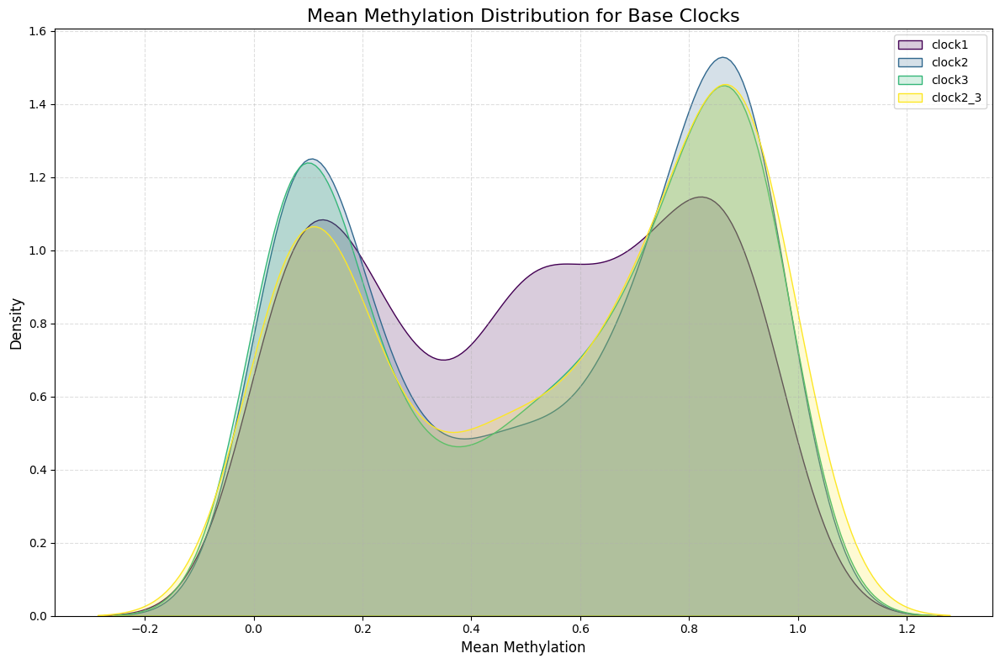

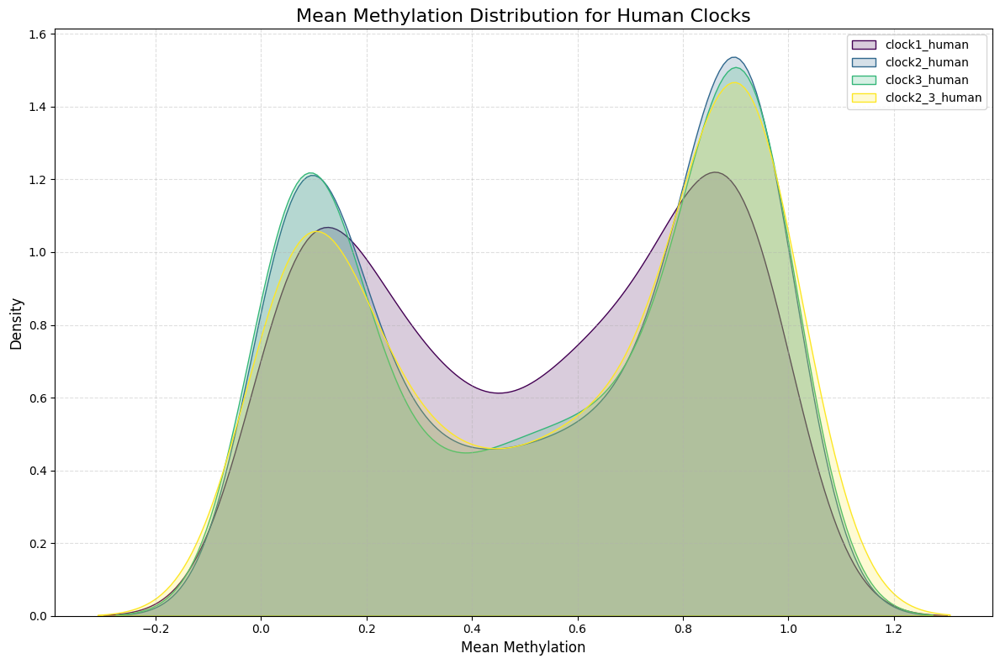

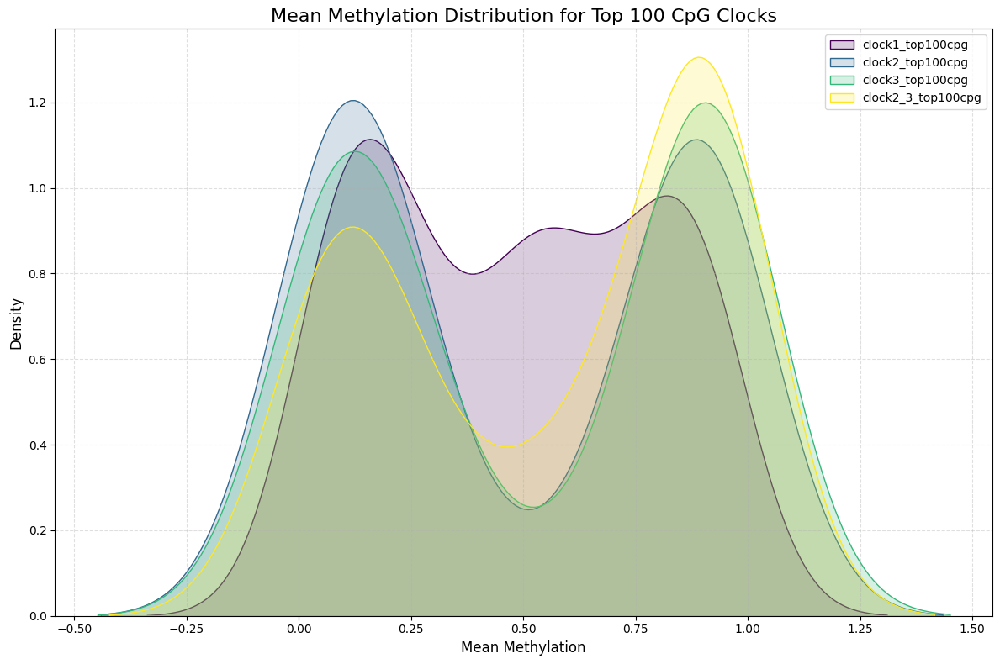

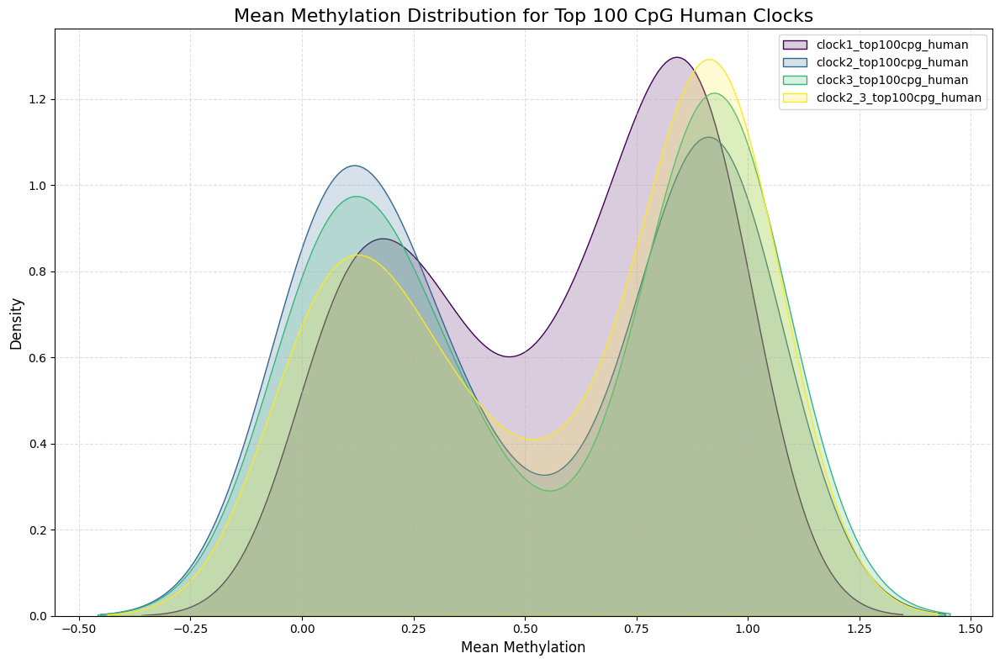

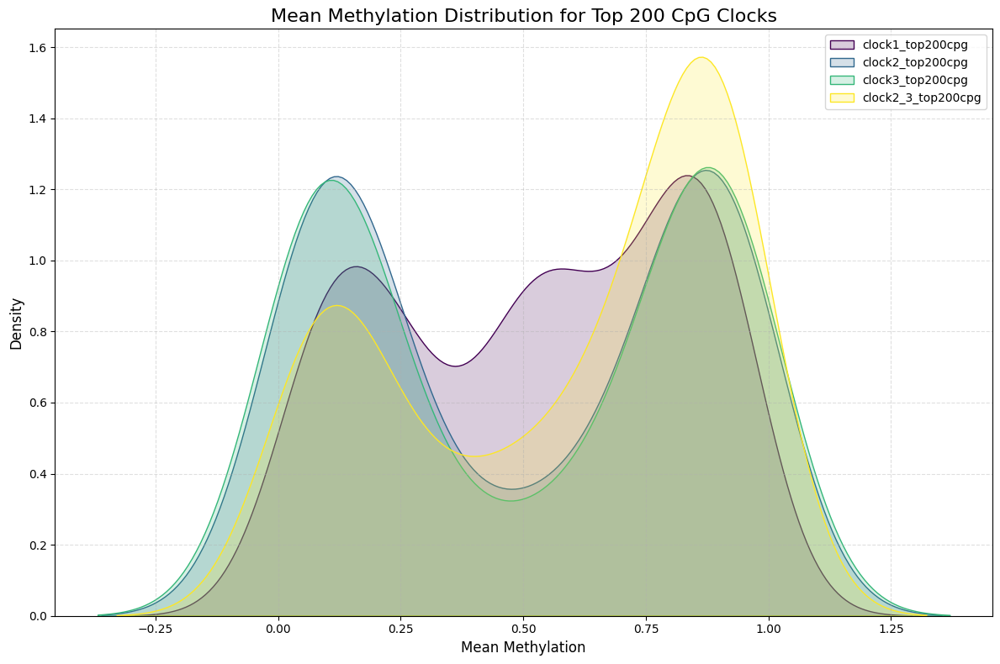

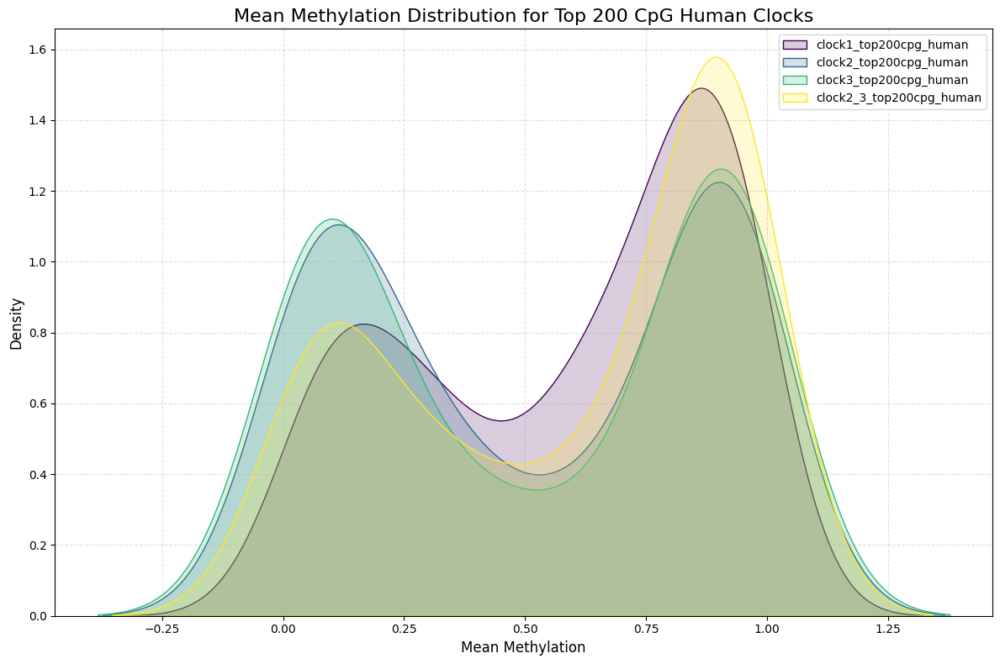

In [77]:
### Density plot of the mean methylation for each clock

def plot_clock_means(clock_group, title):
    plt.figure(figsize=(12, 8))
    
    # Get the viridis color map
    cmap = plt.get_cmap('viridis')
    colors = cmap(np.linspace(0, 1, len(clock_group)))
    
    for clock, color in zip(clock_group, colors):
        sns.kdeplot(data=globals()[clock]['Mean'], 
                    label=clock.replace('_mean_var', ''),
                    color=color,
                    fill=True,  # This fills the area under the curve
                    alpha=0.2)  # Adjust alpha for better visibility when overlapping
    
    plt.title(title, fontsize=16)
    plt.xlabel('Mean Methylation', fontsize=12)
    plt.ylabel('Density', fontsize=12)
    plt.legend(fontsize=10)
    plt.grid(True, linestyle='--', alpha=0.4)
    plt.tight_layout()
    plt.show()

# Define the clock groups
clock_groups = [
    ['clock1_mean_var', 'clock2_mean_var', 'clock3_mean_var', 'clock2_3_mean_var'],
    ['clock1_human_mean_var', 'clock2_human_mean_var', 'clock3_human_mean_var', 'clock2_3_human_mean_var'],
    ['clock1_top100cpg_mean_var', 'clock2_top100cpg_mean_var', 'clock3_top100cpg_mean_var', 'clock2_3_top100cpg_mean_var'],
    ['clock1_top100cpg_human_mean_var', 'clock2_top100cpg_human_mean_var', 'clock3_top100cpg_human_mean_var', 'clock2_3_top100cpg_human_mean_var'],
    ['clock1_top200cpg_mean_var', 'clock2_top200cpg_mean_var', 'clock3_top200cpg_mean_var', 'clock2_3_top200cpg_mean_var'],
    ['clock1_top200cpg_human_mean_var', 'clock2_top200cpg_human_mean_var', 'clock3_top200cpg_human_mean_var', 'clock2_3_top200cpg_human_mean_var']
]

# Plot titles
titles = [
    "Mean Methylation Distribution for Base Clocks",
    "Mean Methylation Distribution for Human Clocks",
    "Mean Methylation Distribution for Top 100 CpG Clocks",
    "Mean Methylation Distribution for Top 100 CpG Human Clocks",
    "Mean Methylation Distribution for Top 200 CpG Clocks",
    "Mean Methylation Distribution for Top 200 CpG Human Clocks"
]

# Plot for each group
for group, title in zip(clock_groups, titles):
    plot_clock_means(group, title)


#### 2.2. Tissue Density Plots

c:\Users\Catia Antunes\AppData\Local\Programs\Python\Python312\Lib\site-packages\distributed\node.py:182: UserWarning: Port 8787 is already in use.
Perhaps you already have a cluster running?
Hosting the HTTP server on port 61383 instead
  warnings.warn(
C:\Users\Catia Antunes\AppData\Local\Temp\ipykernel_14380\2229337593.py:44: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(data=globals()[tissue]['Mean'],


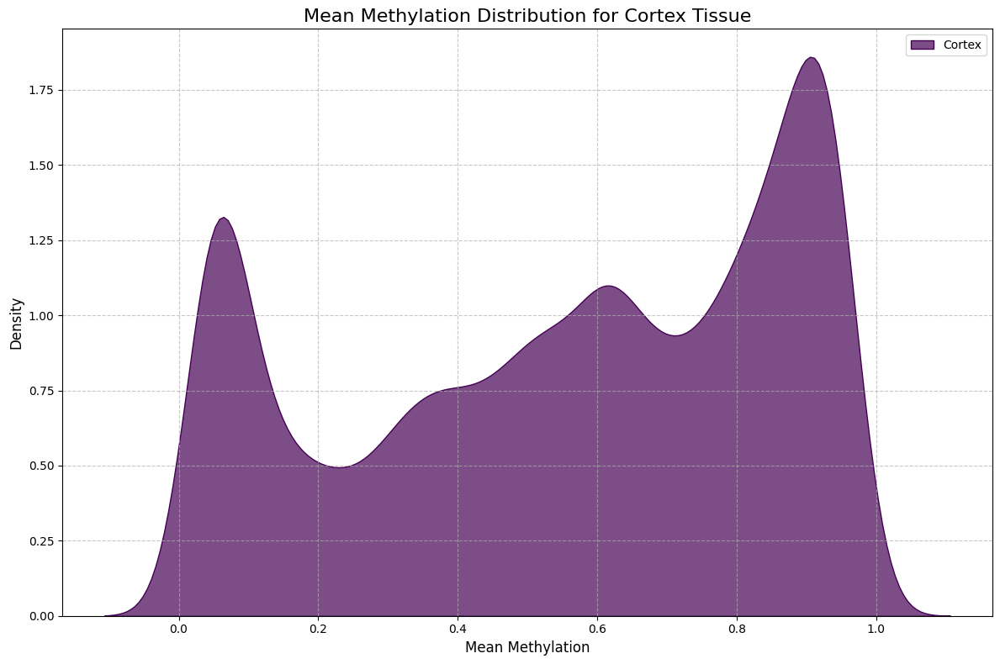

C:\Users\Catia Antunes\AppData\Local\Temp\ipykernel_14380\2229337593.py:44: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(data=globals()[tissue]['Mean'],


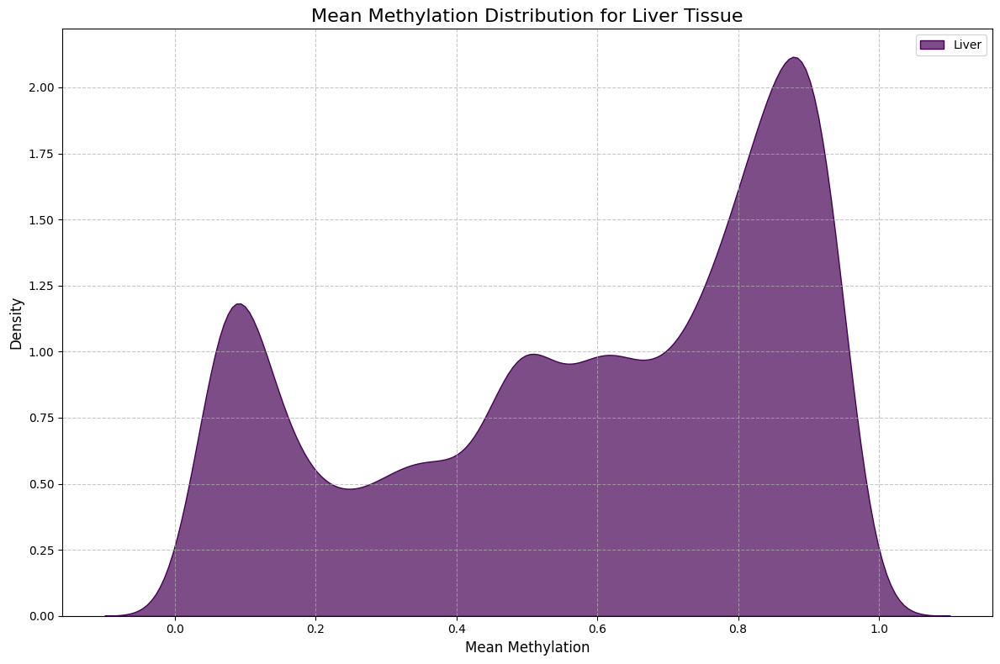

C:\Users\Catia Antunes\AppData\Local\Temp\ipykernel_14380\2229337593.py:44: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(data=globals()[tissue]['Mean'],


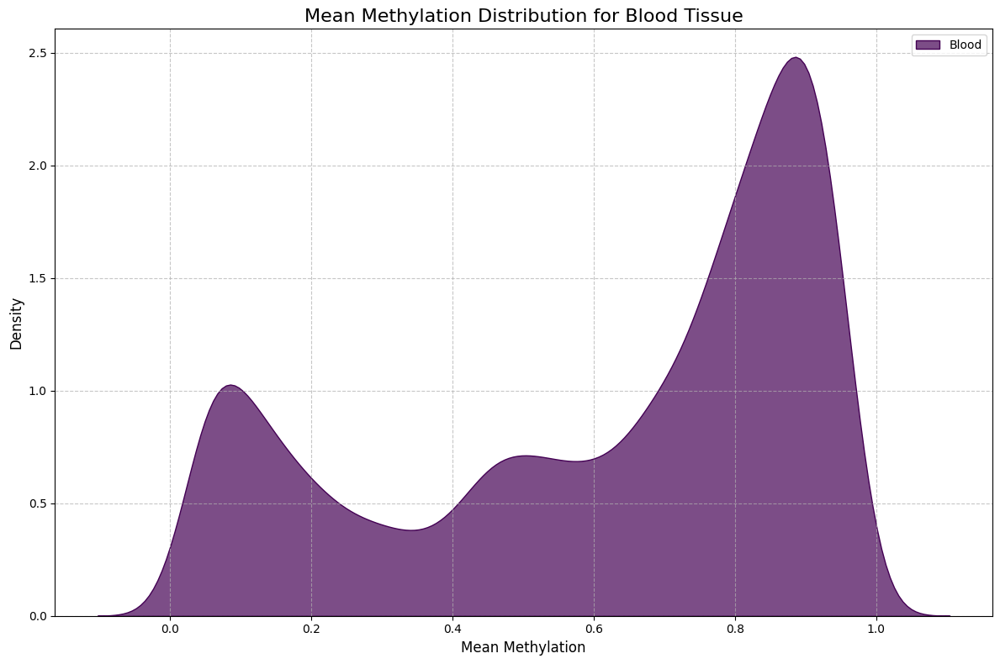

C:\Users\Catia Antunes\AppData\Local\Temp\ipykernel_14380\2229337593.py:44: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(data=globals()[tissue]['Mean'],


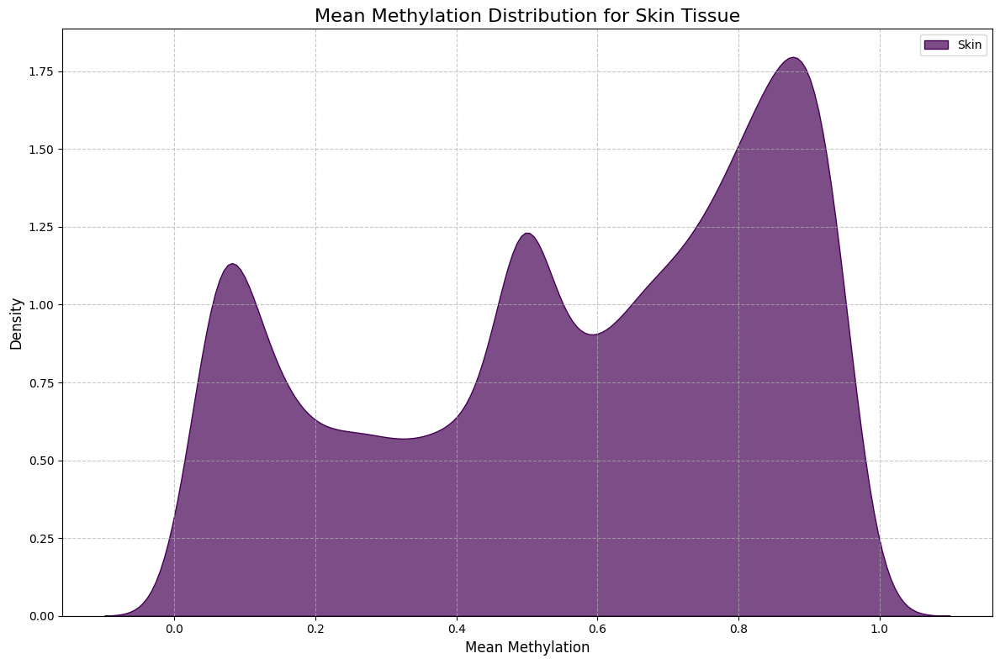

C:\Users\Catia Antunes\AppData\Local\Temp\ipykernel_14380\2229337593.py:44: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(data=globals()[tissue]['Mean'],


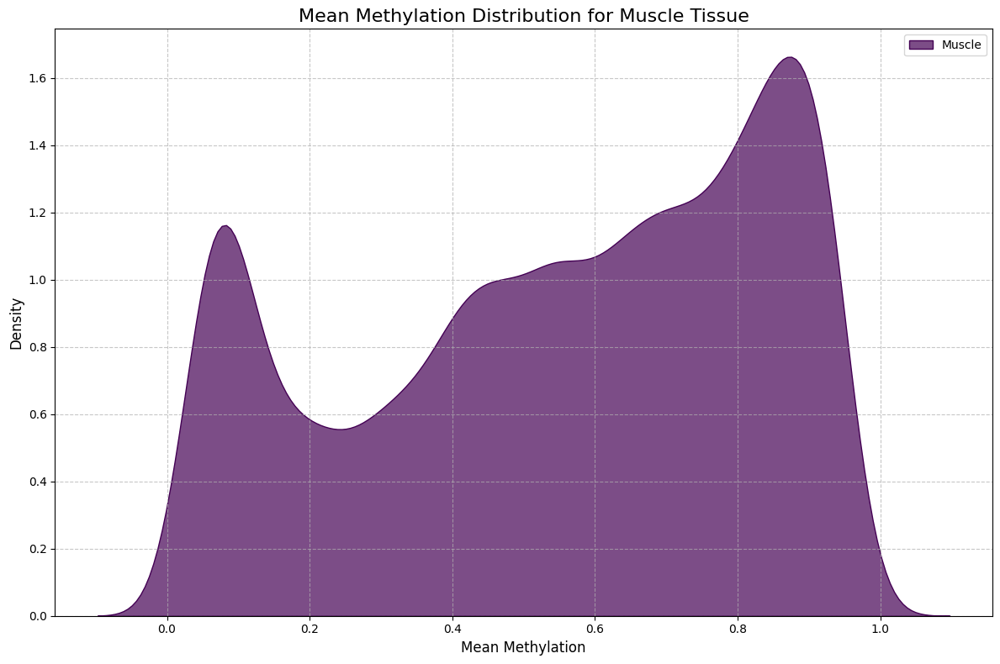

C:\Users\Catia Antunes\AppData\Local\Temp\ipykernel_14380\2229337593.py:44: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(data=globals()[tissue]['Mean'],


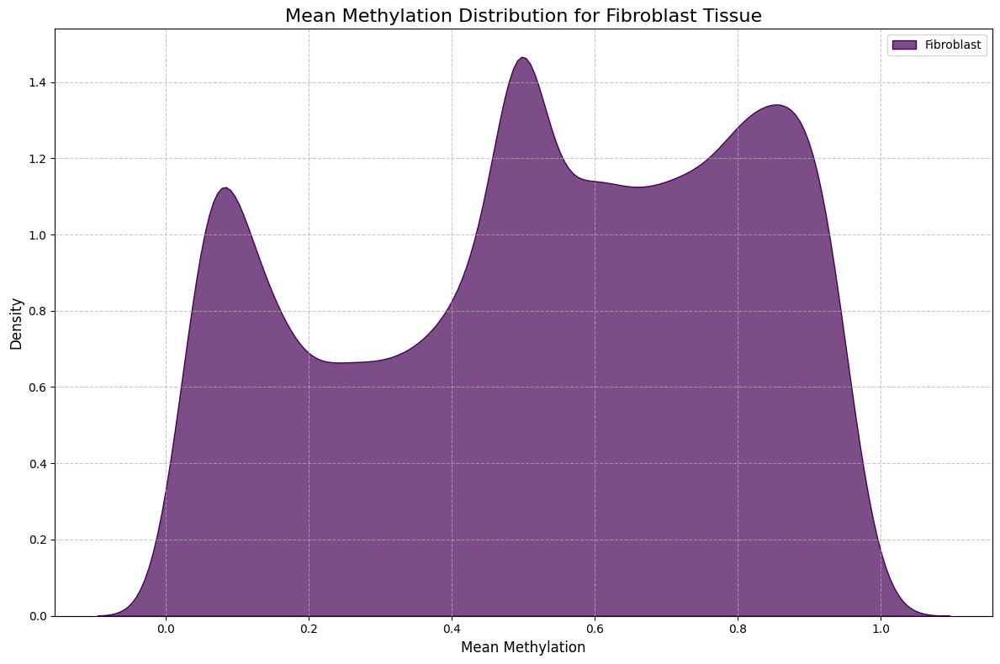

C:\Users\Catia Antunes\AppData\Local\Temp\ipykernel_14380\2229337593.py:44: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(data=globals()[tissue]['Mean'],


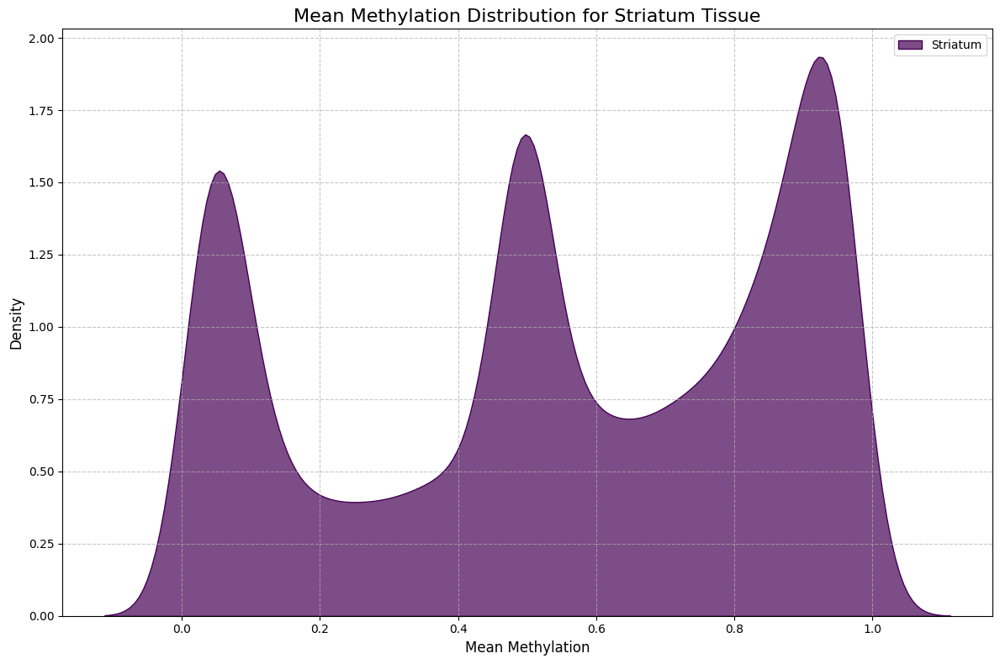

C:\Users\Catia Antunes\AppData\Local\Temp\ipykernel_14380\2229337593.py:44: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(data=globals()[tissue]['Mean'],


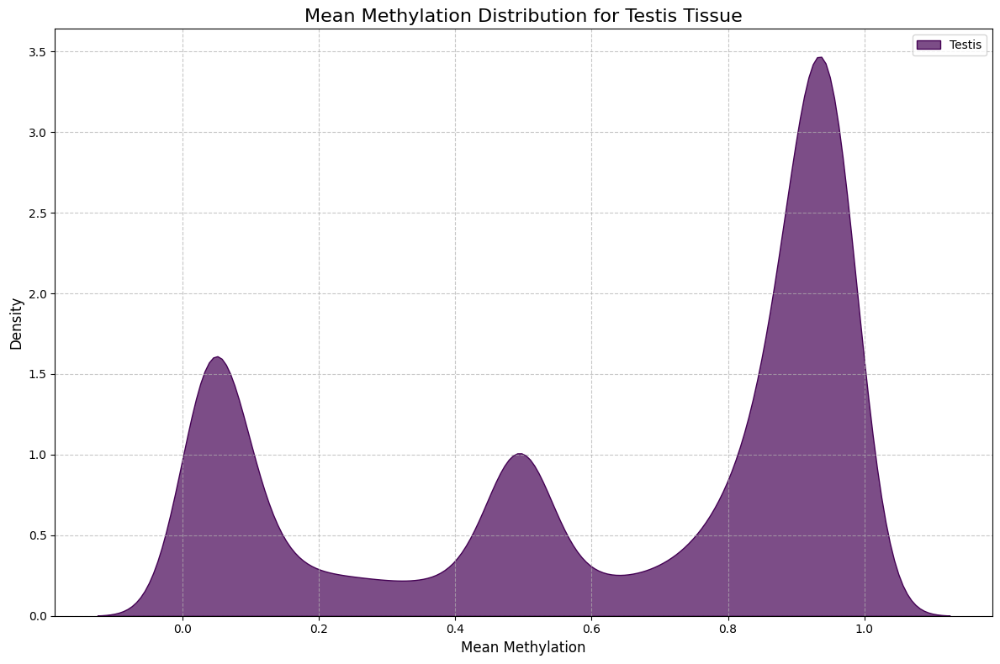

C:\Users\Catia Antunes\AppData\Local\Temp\ipykernel_14380\2229337593.py:44: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(data=globals()[tissue]['Mean'],


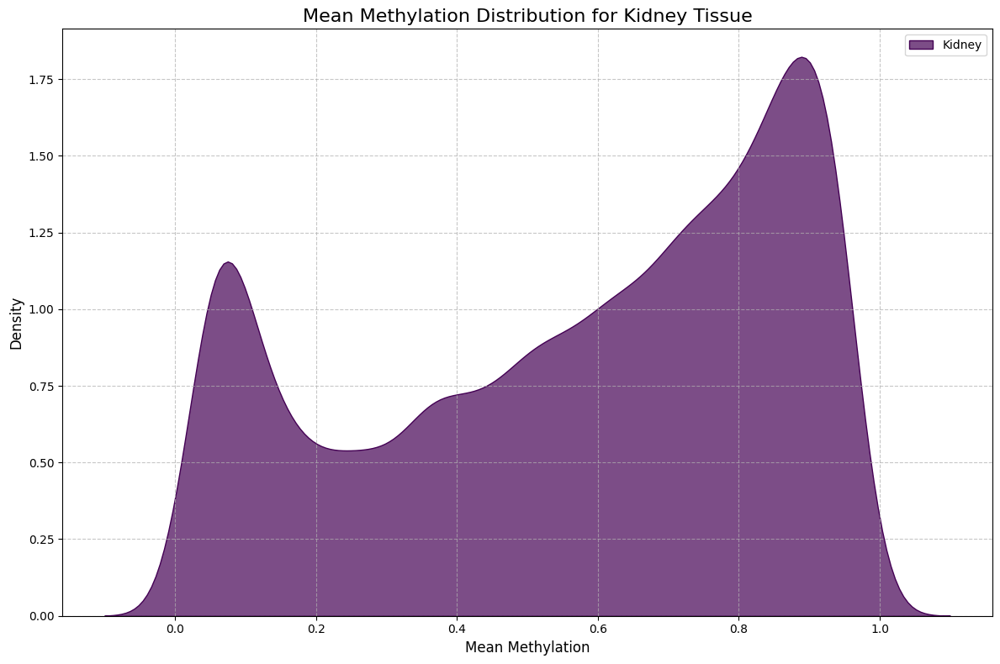

C:\Users\Catia Antunes\AppData\Local\Temp\ipykernel_14380\2229337593.py:44: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(data=globals()[tissue]['Mean'],


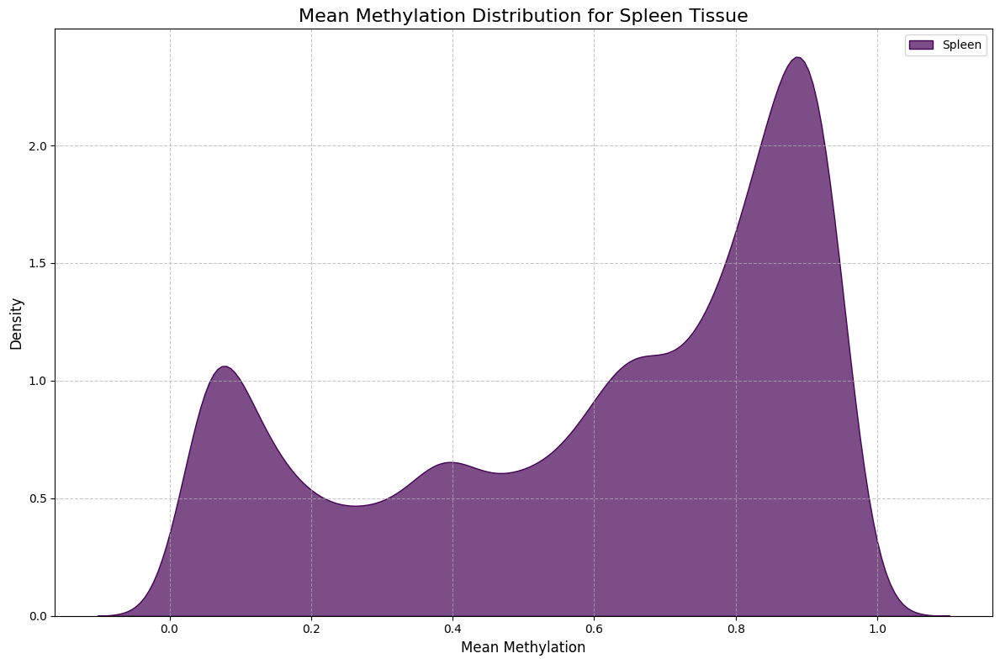

C:\Users\Catia Antunes\AppData\Local\Temp\ipykernel_14380\2229337593.py:44: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(data=globals()[tissue]['Mean'],


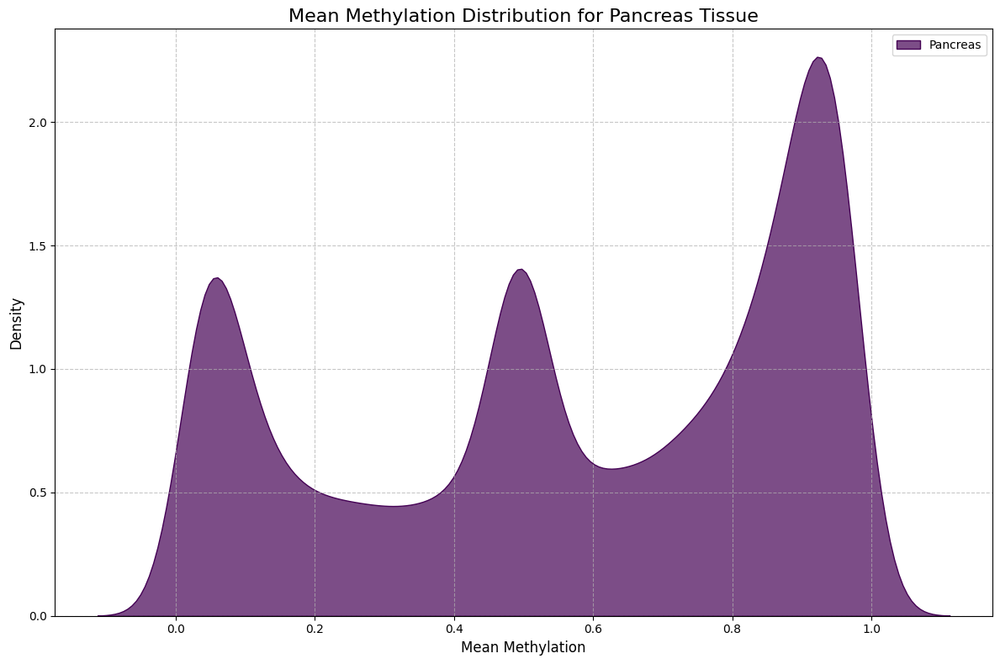

C:\Users\Catia Antunes\AppData\Local\Temp\ipykernel_14380\2229337593.py:44: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(data=globals()[tissue]['Mean'],


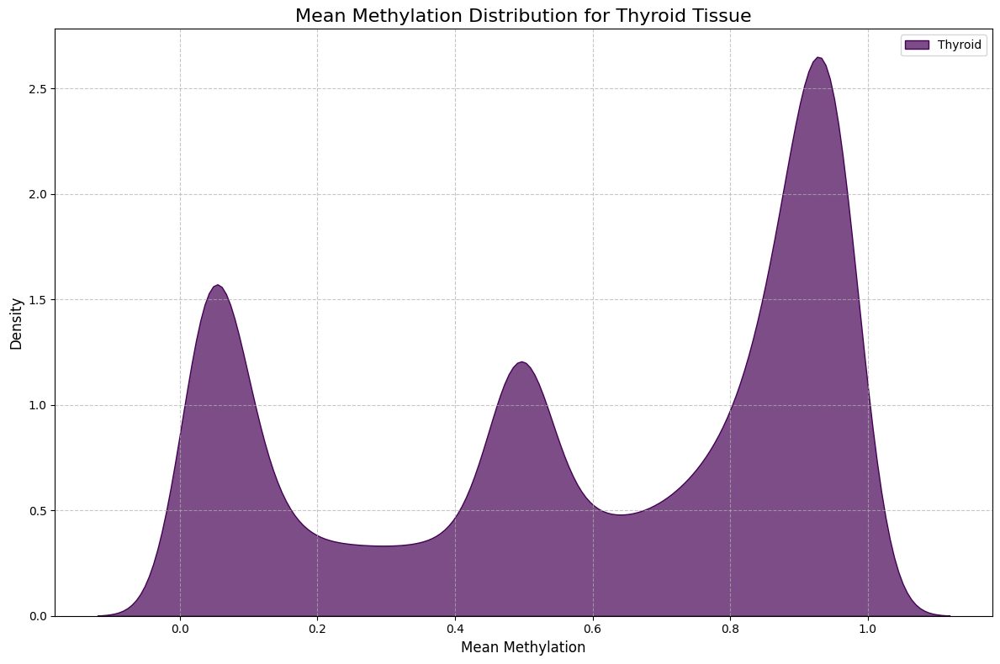

C:\Users\Catia Antunes\AppData\Local\Temp\ipykernel_14380\2229337593.py:44: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(data=globals()[tissue]['Mean'],


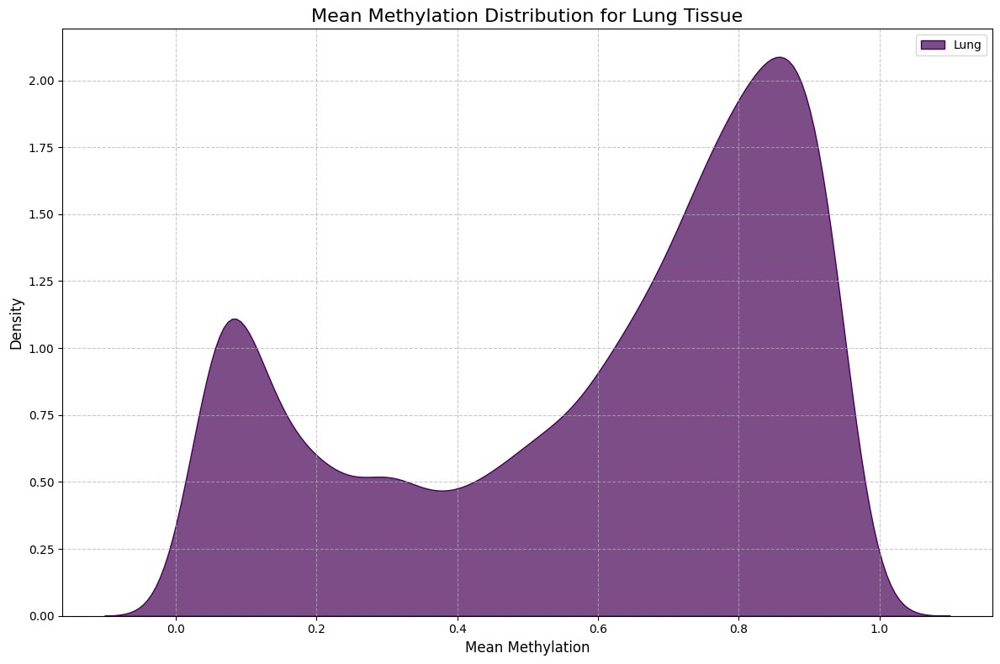

C:\Users\Catia Antunes\AppData\Local\Temp\ipykernel_14380\2229337593.py:44: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(data=globals()[tissue]['Mean'],


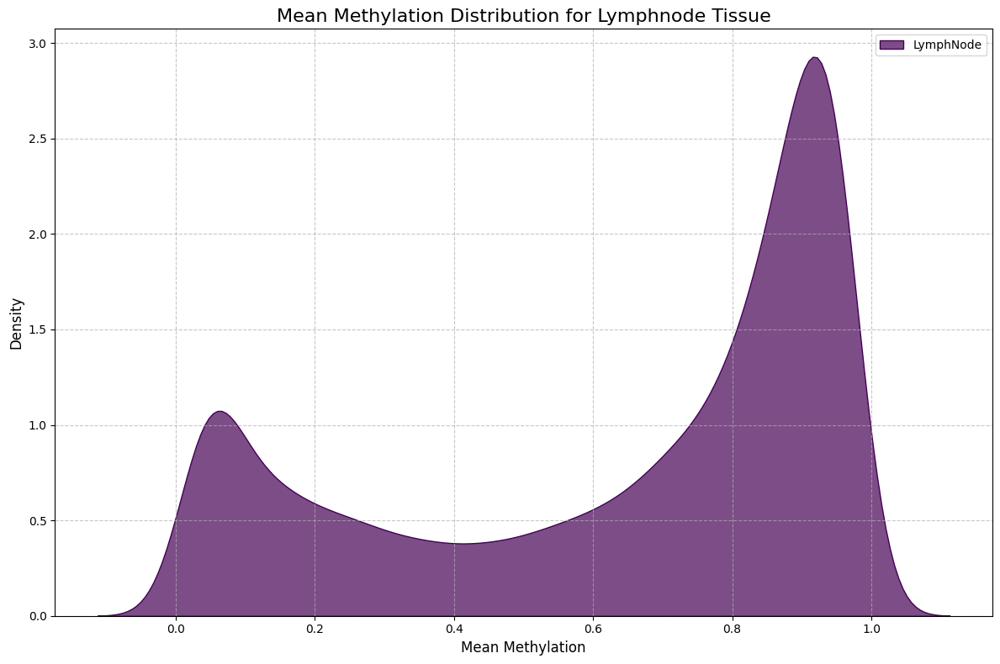

C:\Users\Catia Antunes\AppData\Local\Temp\ipykernel_14380\2229337593.py:44: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(data=globals()[tissue]['Mean'],


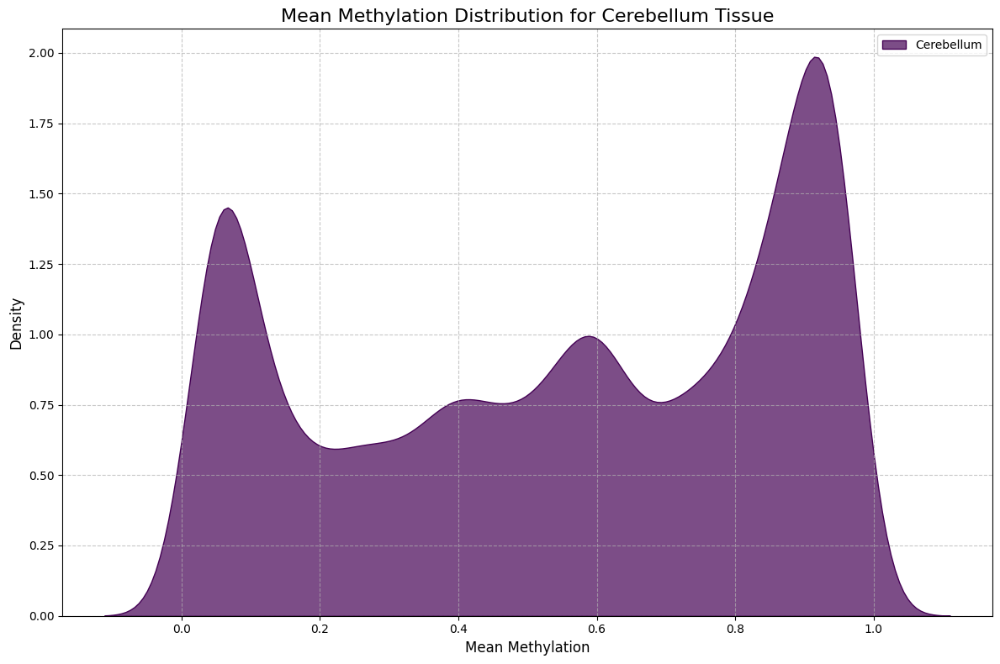

C:\Users\Catia Antunes\AppData\Local\Temp\ipykernel_14380\2229337593.py:44: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(data=globals()[tissue]['Mean'],


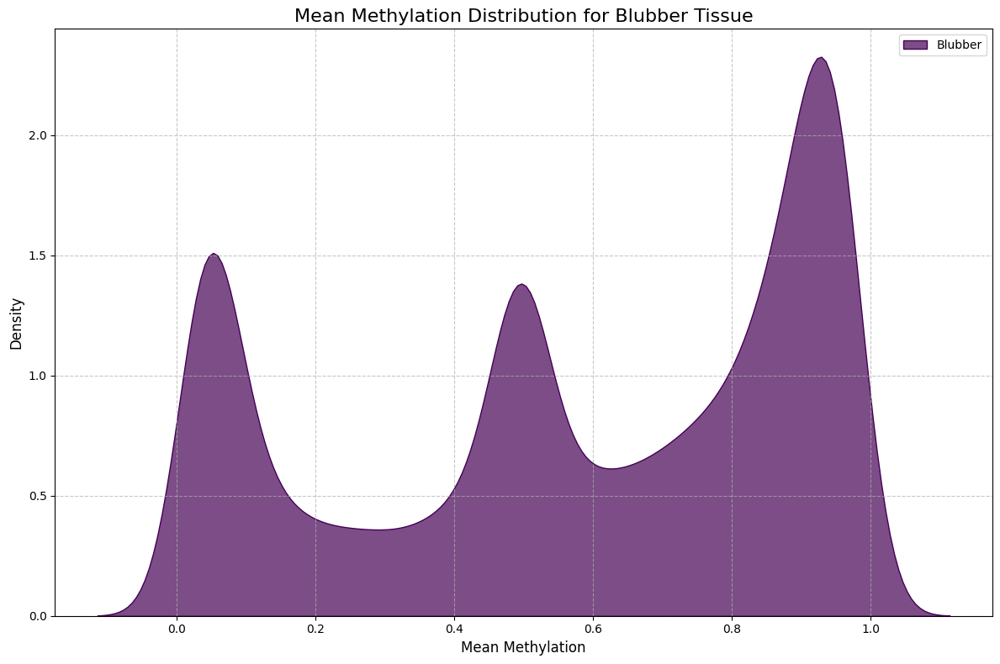

C:\Users\Catia Antunes\AppData\Local\Temp\ipykernel_14380\2229337593.py:44: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(data=globals()[tissue]['Mean'],


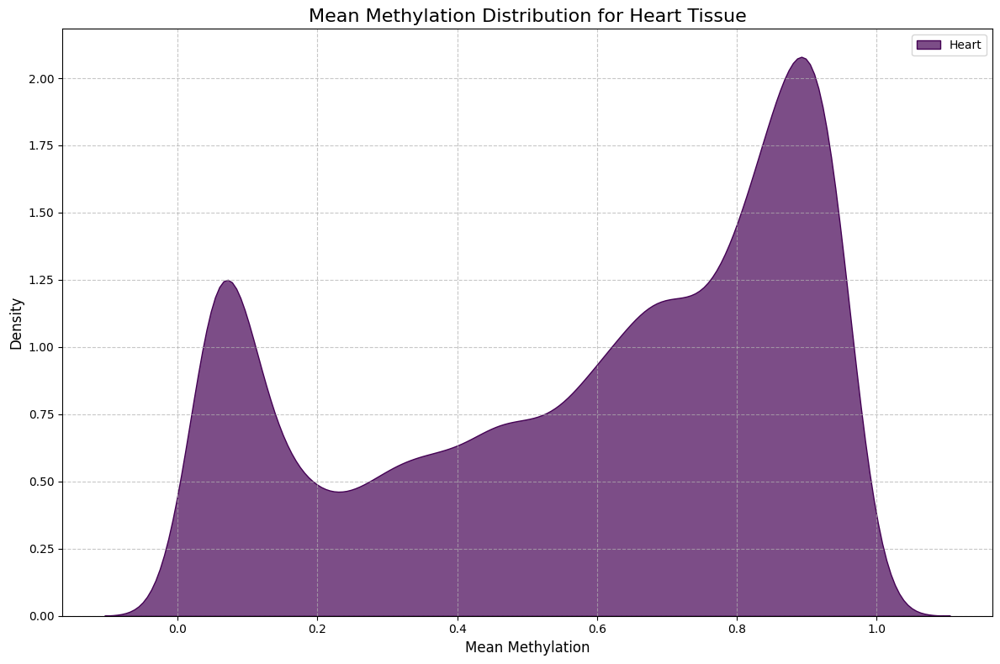

C:\Users\Catia Antunes\AppData\Local\Temp\ipykernel_14380\2229337593.py:44: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(data=globals()[tissue]['Mean'],


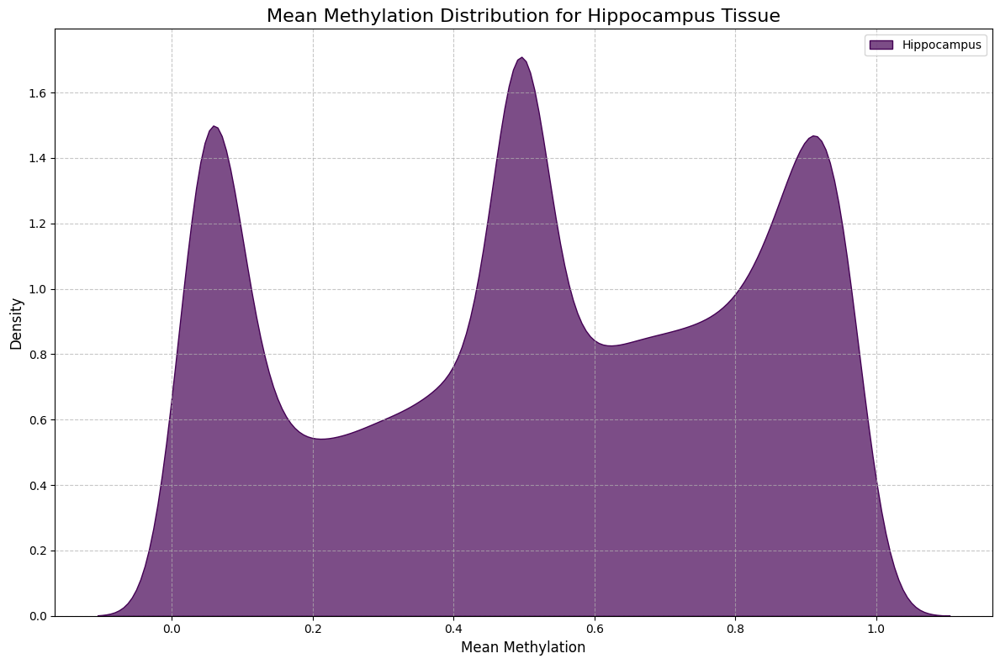

C:\Users\Catia Antunes\AppData\Local\Temp\ipykernel_14380\2229337593.py:44: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(data=globals()[tissue]['Mean'],


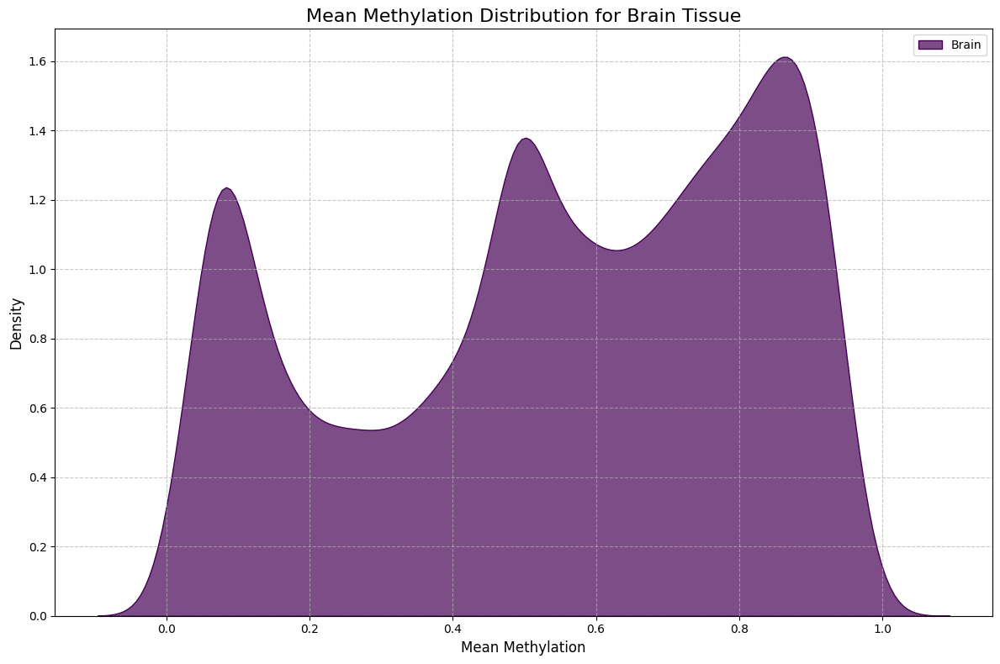

C:\Users\Catia Antunes\AppData\Local\Temp\ipykernel_14380\2229337593.py:44: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(data=globals()[tissue]['Mean'],


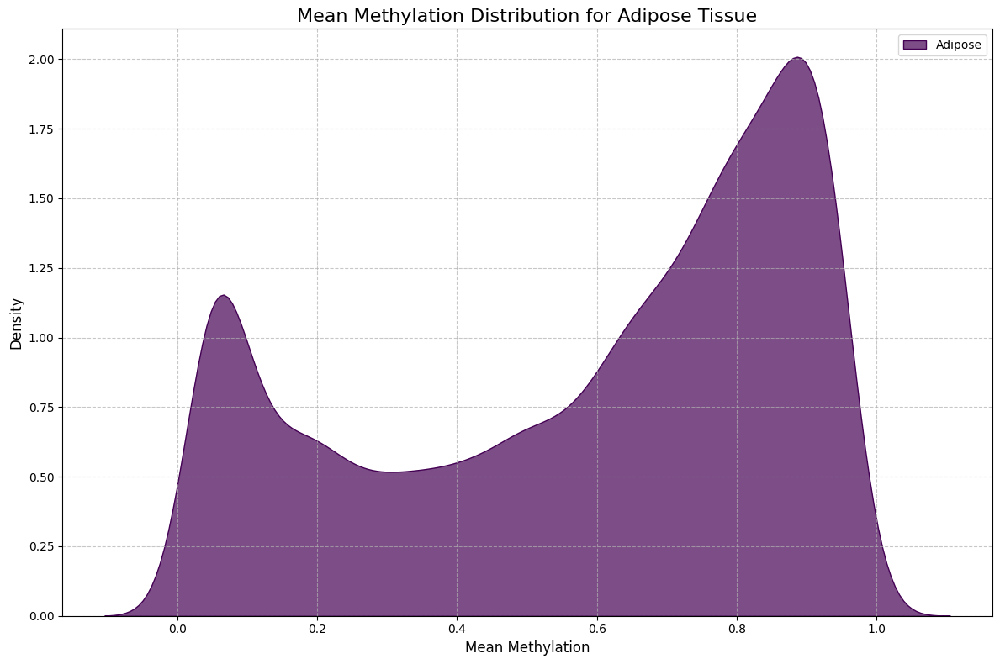

C:\Users\Catia Antunes\AppData\Local\Temp\ipykernel_14380\2229337593.py:44: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(data=globals()[tissue]['Mean'],


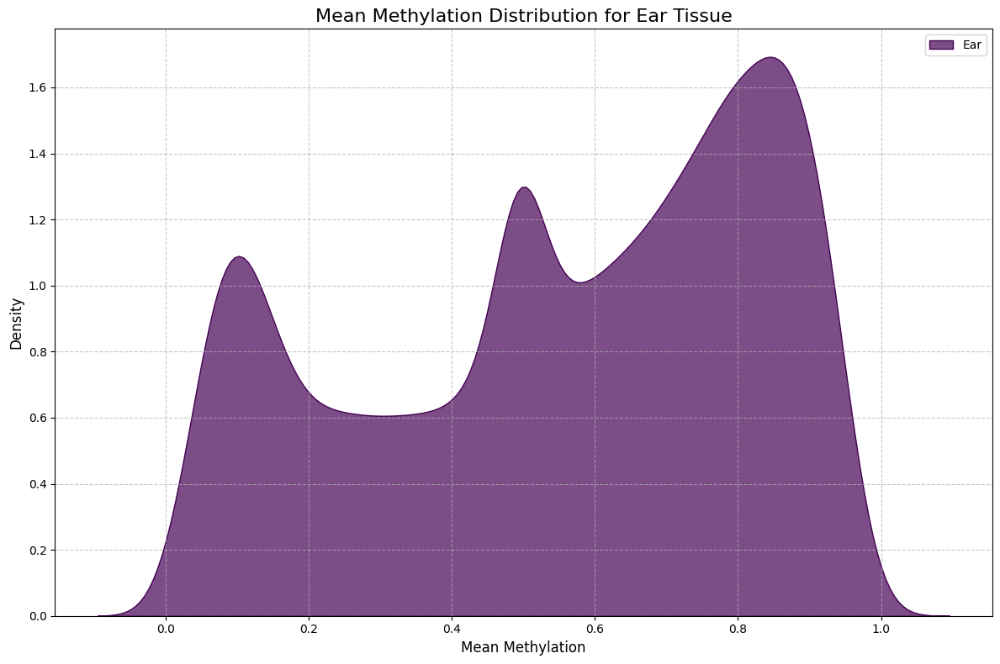

C:\Users\Catia Antunes\AppData\Local\Temp\ipykernel_14380\2229337593.py:44: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(data=globals()[tissue]['Mean'],


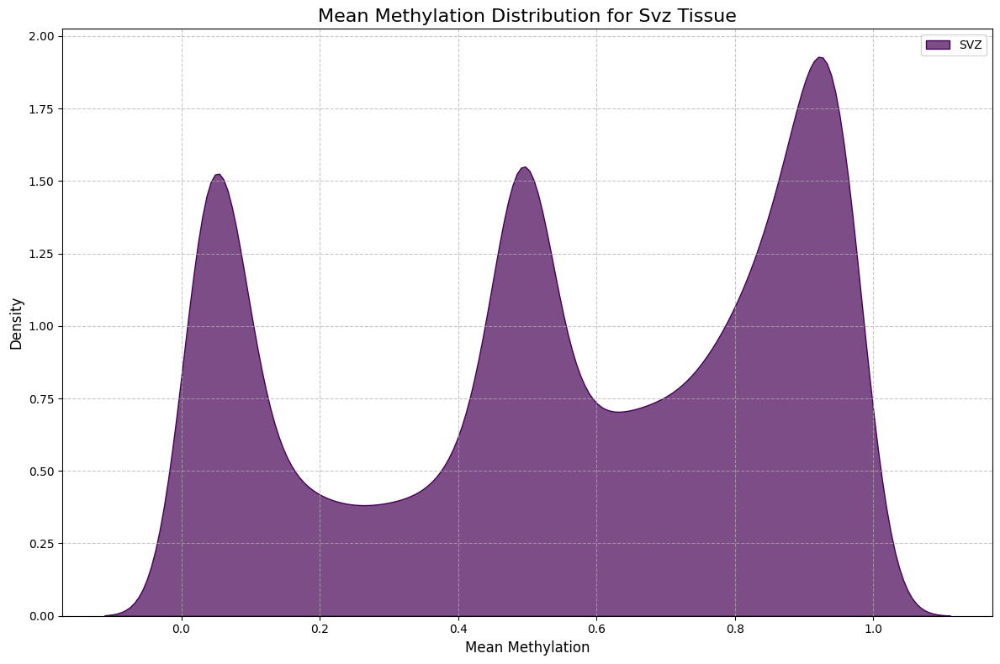

C:\Users\Catia Antunes\AppData\Local\Temp\ipykernel_14380\2229337593.py:44: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(data=globals()[tissue]['Mean'],


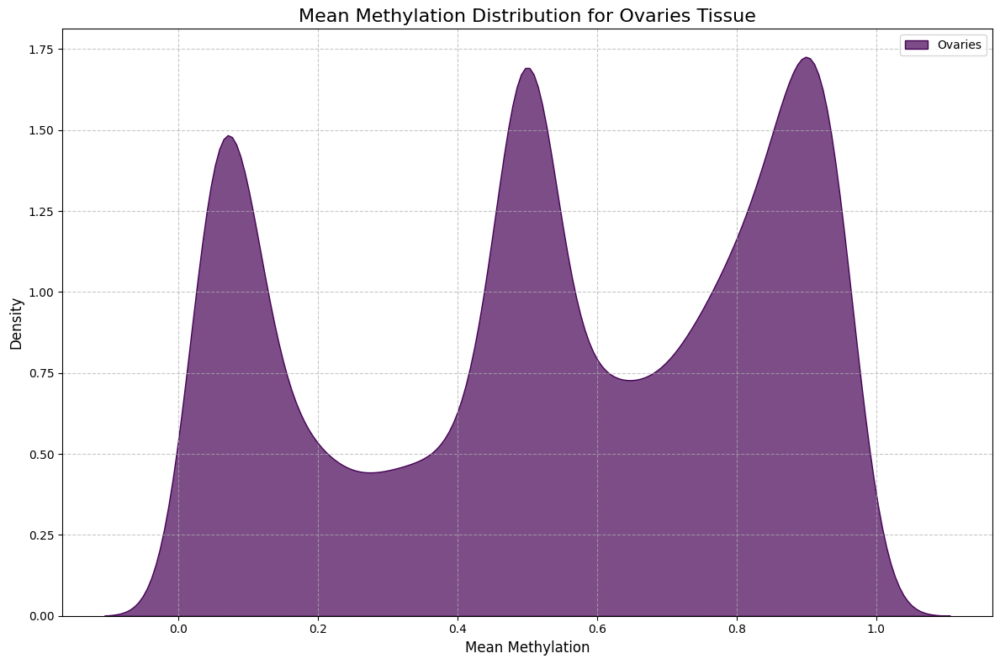

C:\Users\Catia Antunes\AppData\Local\Temp\ipykernel_14380\2229337593.py:44: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(data=globals()[tissue]['Mean'],


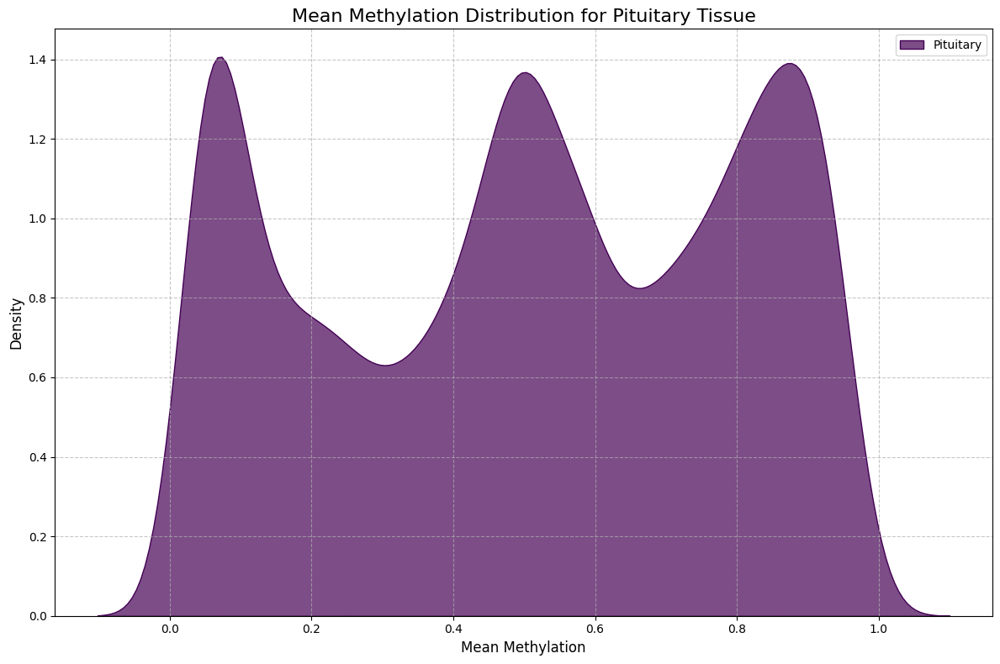

C:\Users\Catia Antunes\AppData\Local\Temp\ipykernel_14380\2229337593.py:44: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(data=globals()[tissue]['Mean'],


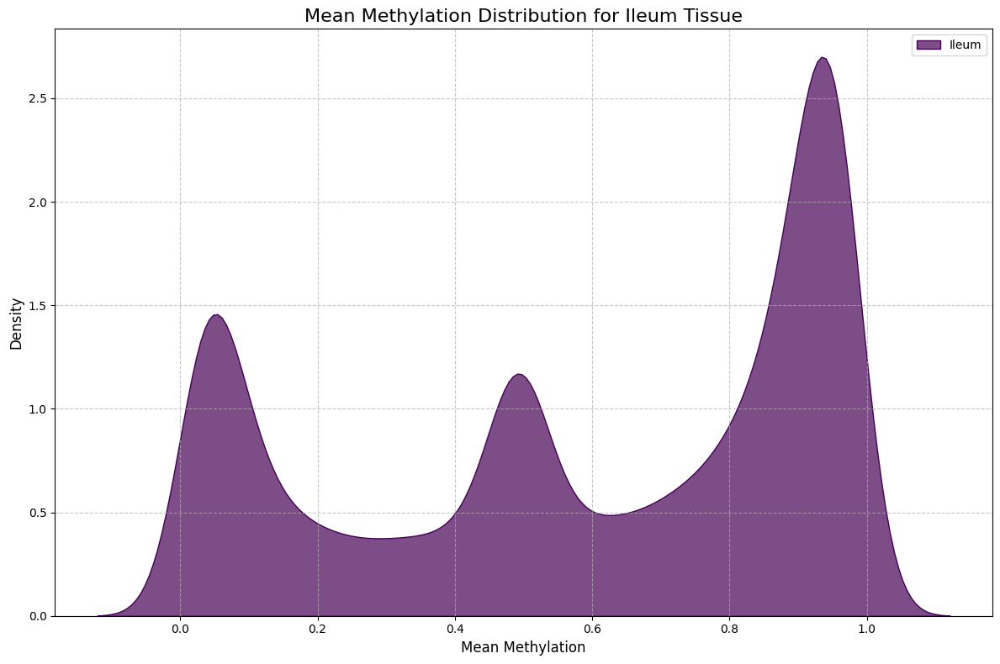

C:\Users\Catia Antunes\AppData\Local\Temp\ipykernel_14380\2229337593.py:44: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(data=globals()[tissue]['Mean'],


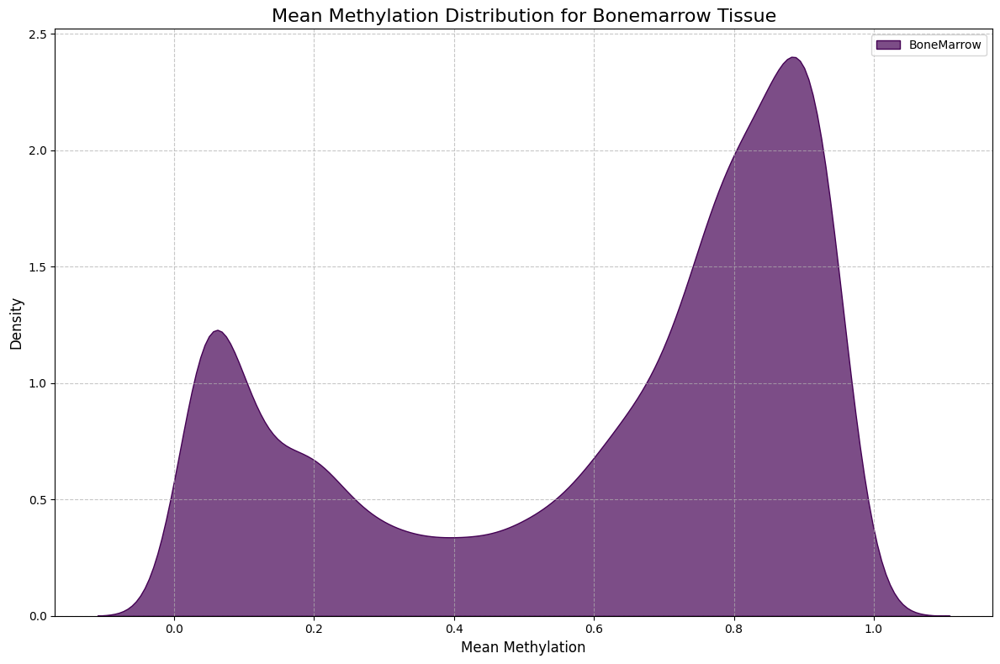

C:\Users\Catia Antunes\AppData\Local\Temp\ipykernel_14380\2229337593.py:44: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(data=globals()[tissue]['Mean'],


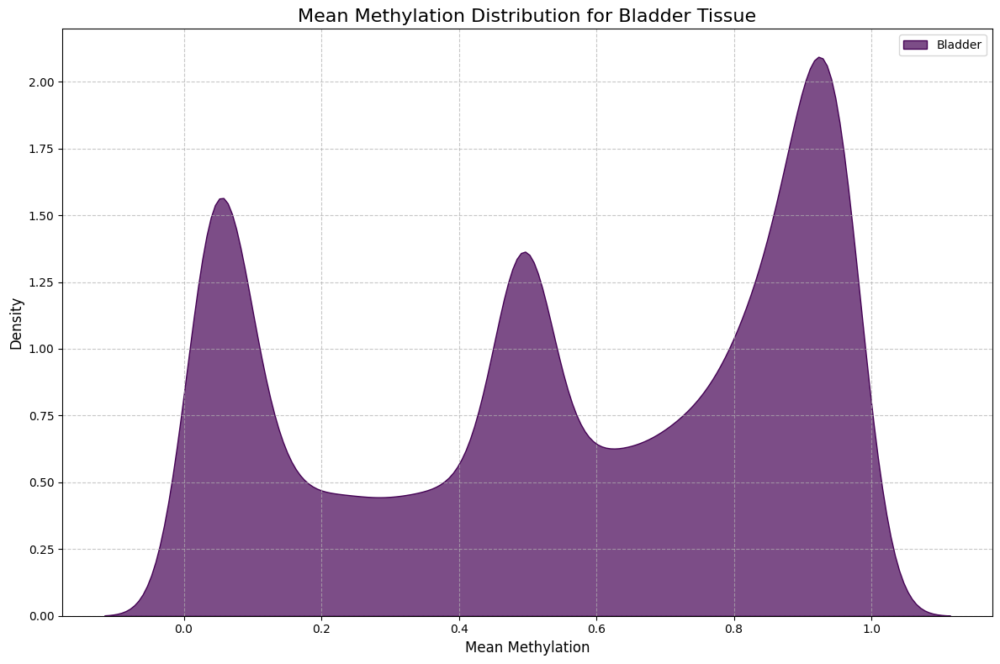

C:\Users\Catia Antunes\AppData\Local\Temp\ipykernel_14380\2229337593.py:44: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(data=globals()[tissue]['Mean'],


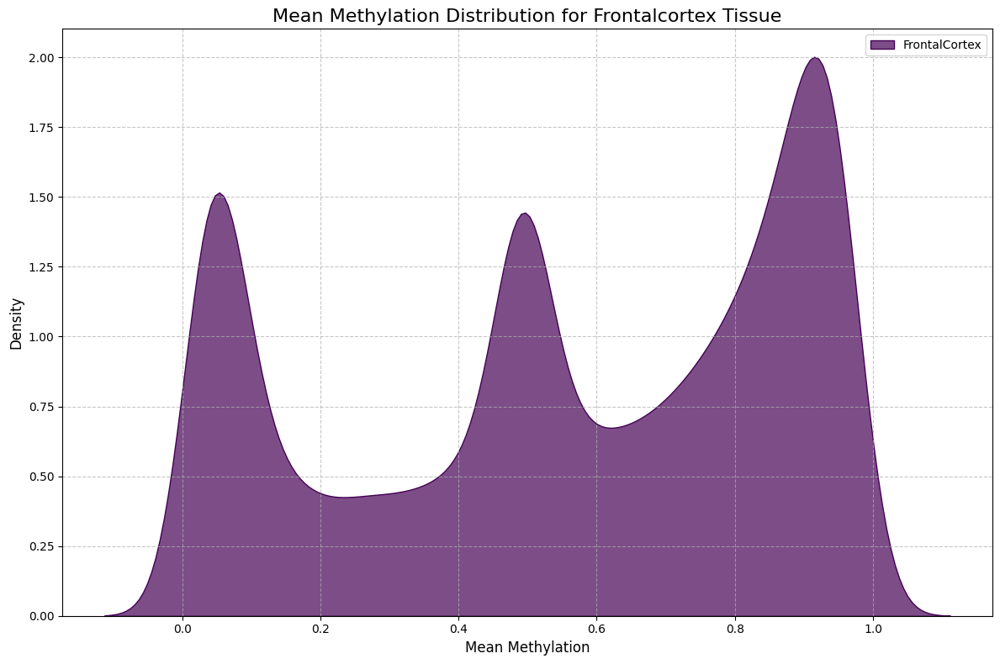

C:\Users\Catia Antunes\AppData\Local\Temp\ipykernel_14380\2229337593.py:44: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(data=globals()[tissue]['Mean'],


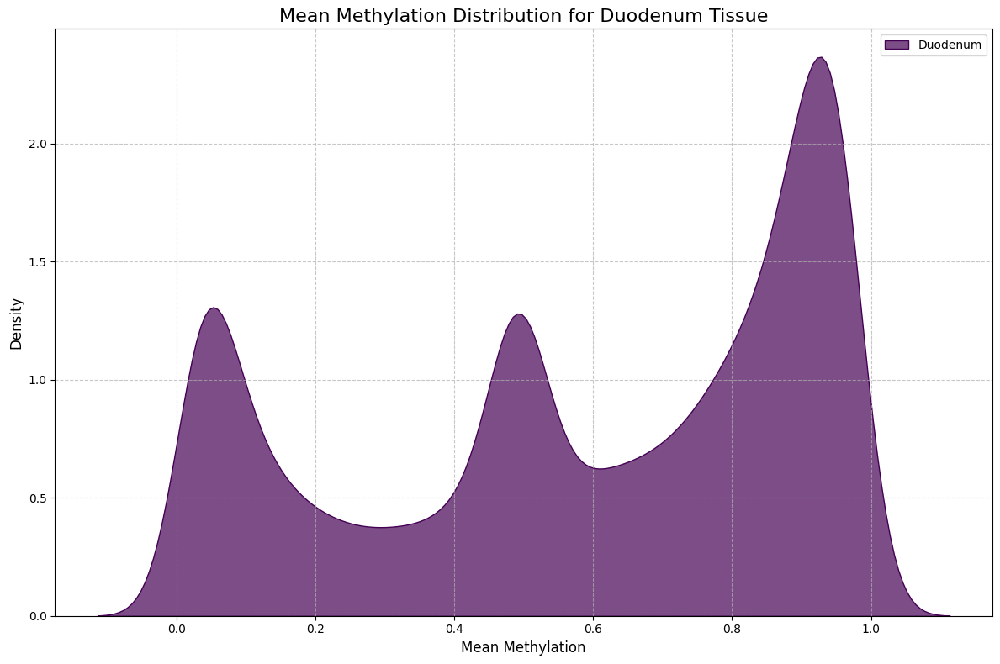

C:\Users\Catia Antunes\AppData\Local\Temp\ipykernel_14380\2229337593.py:44: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(data=globals()[tissue]['Mean'],


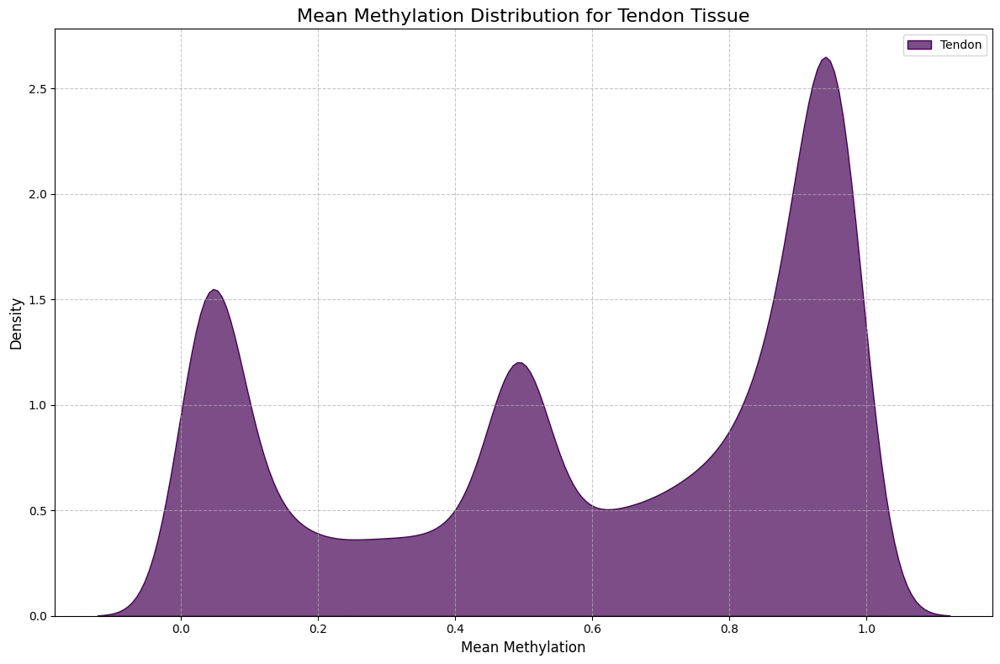

C:\Users\Catia Antunes\AppData\Local\Temp\ipykernel_14380\2229337593.py:44: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(data=globals()[tissue]['Mean'],


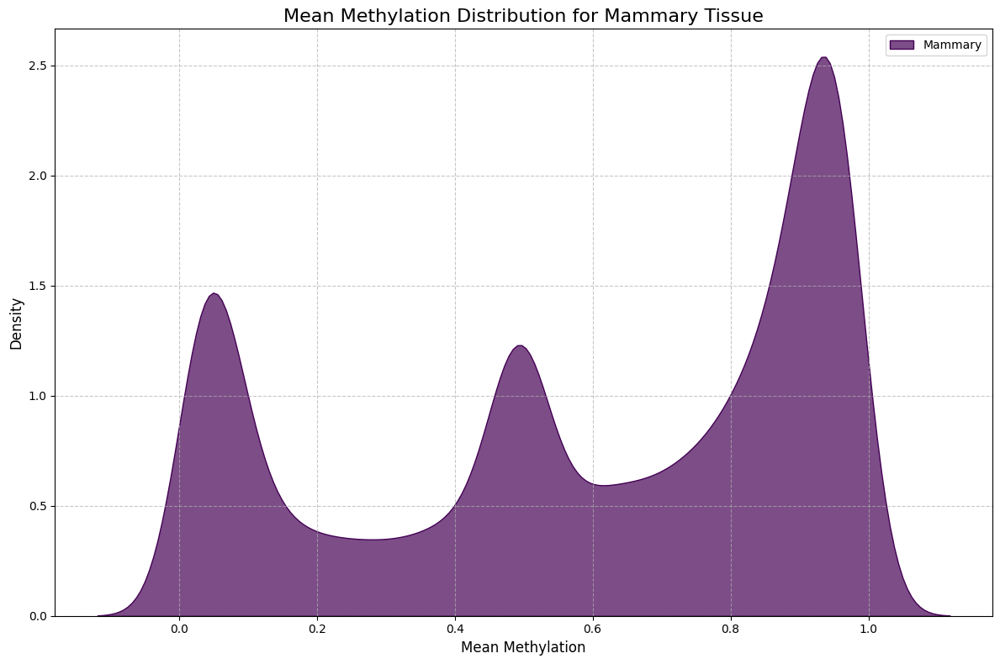

C:\Users\Catia Antunes\AppData\Local\Temp\ipykernel_14380\2229337593.py:44: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(data=globals()[tissue]['Mean'],


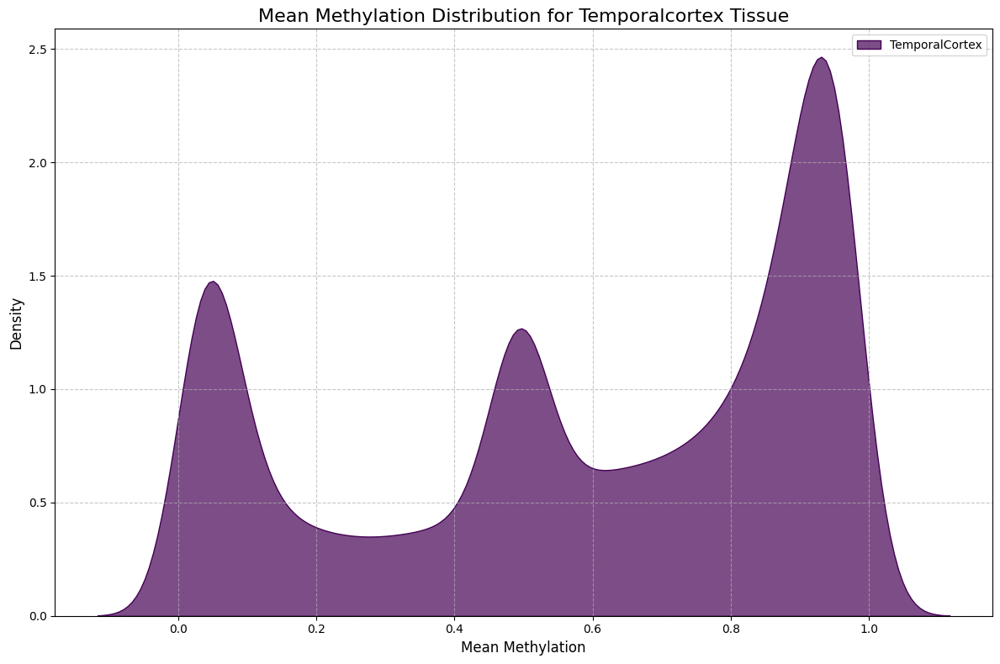

C:\Users\Catia Antunes\AppData\Local\Temp\ipykernel_14380\2229337593.py:44: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(data=globals()[tissue]['Mean'],


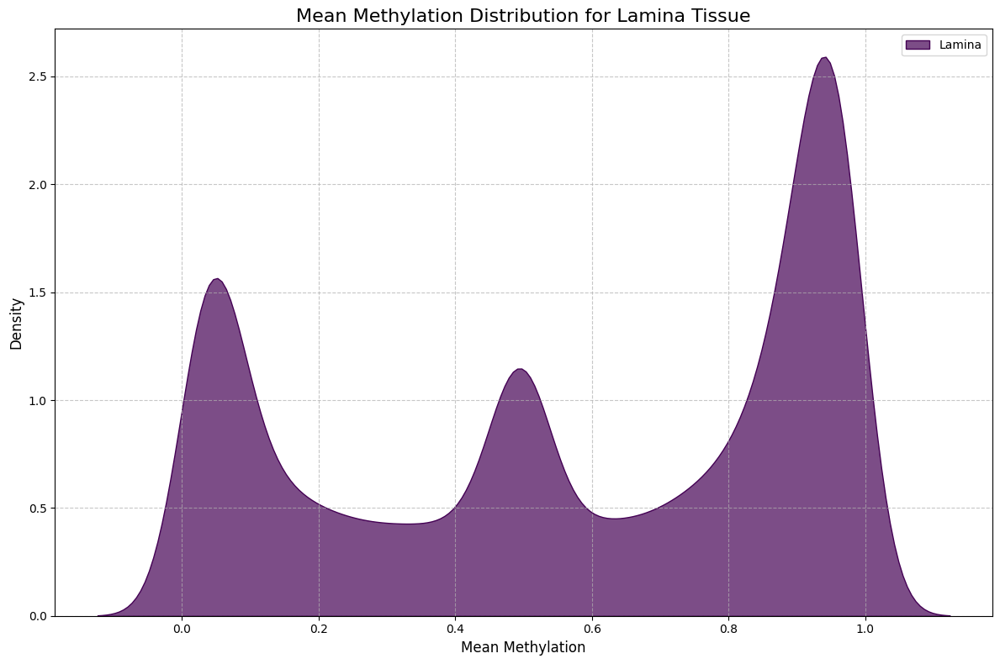

C:\Users\Catia Antunes\AppData\Local\Temp\ipykernel_14380\2229337593.py:44: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(data=globals()[tissue]['Mean'],


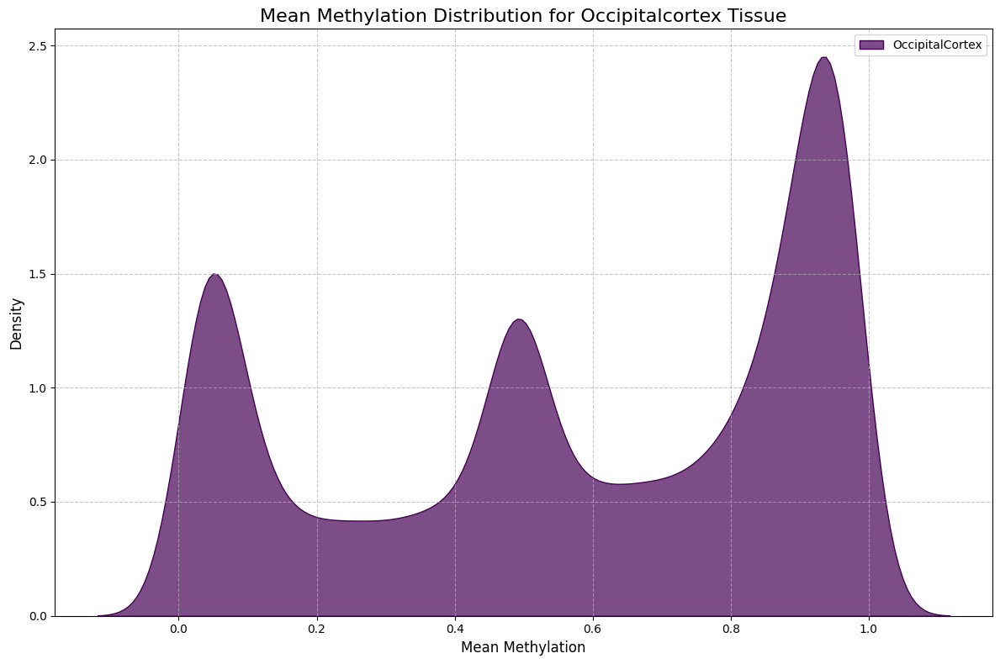

C:\Users\Catia Antunes\AppData\Local\Temp\ipykernel_14380\2229337593.py:44: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(data=globals()[tissue]['Mean'],


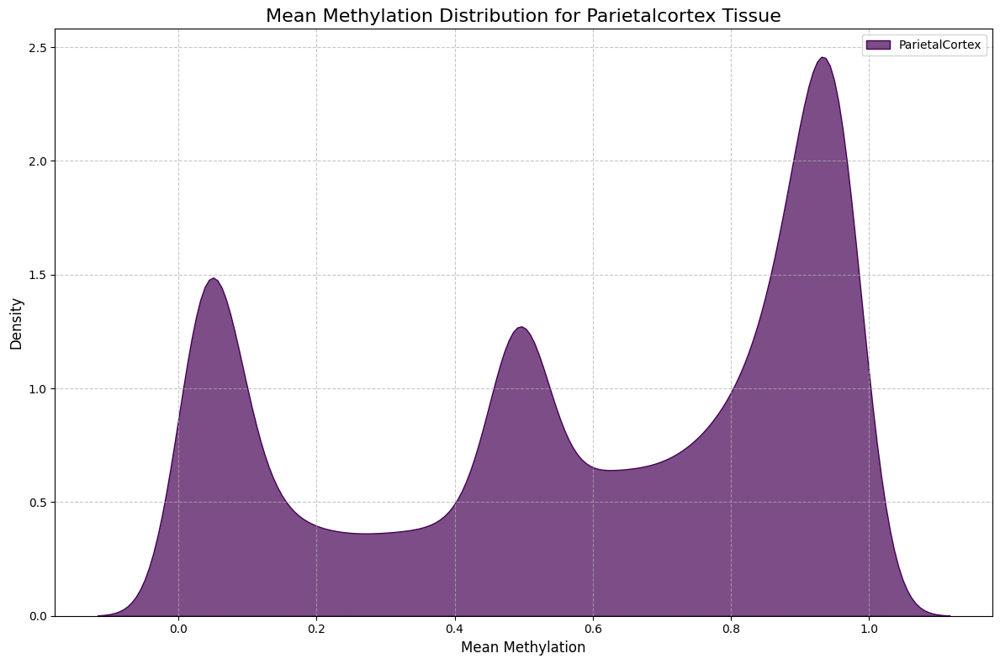

C:\Users\Catia Antunes\AppData\Local\Temp\ipykernel_14380\2229337593.py:44: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(data=globals()[tissue]['Mean'],


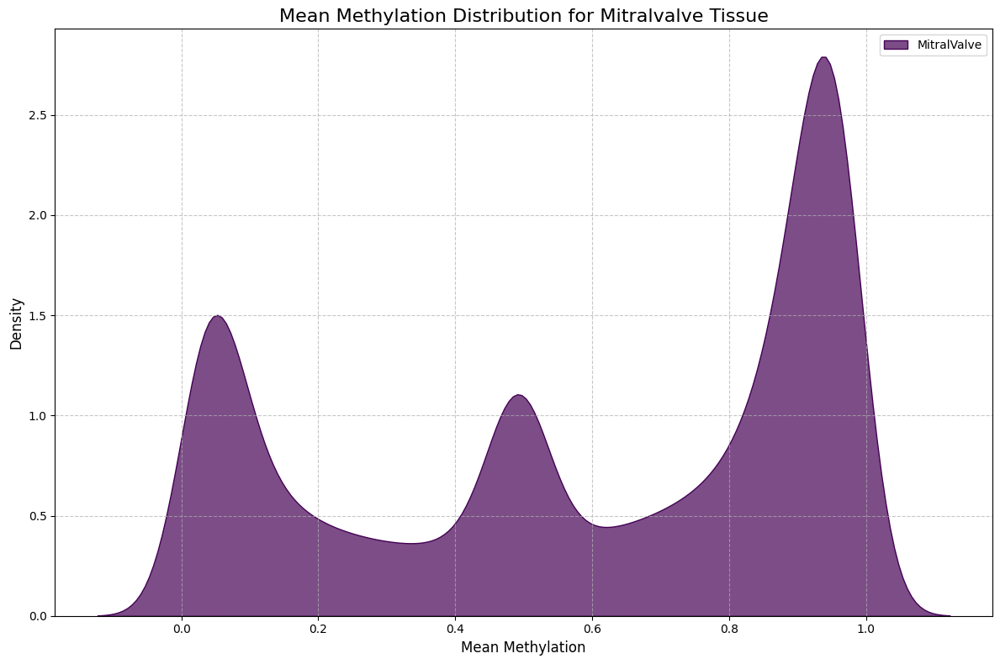

C:\Users\Catia Antunes\AppData\Local\Temp\ipykernel_14380\2229337593.py:44: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(data=globals()[tissue]['Mean'],


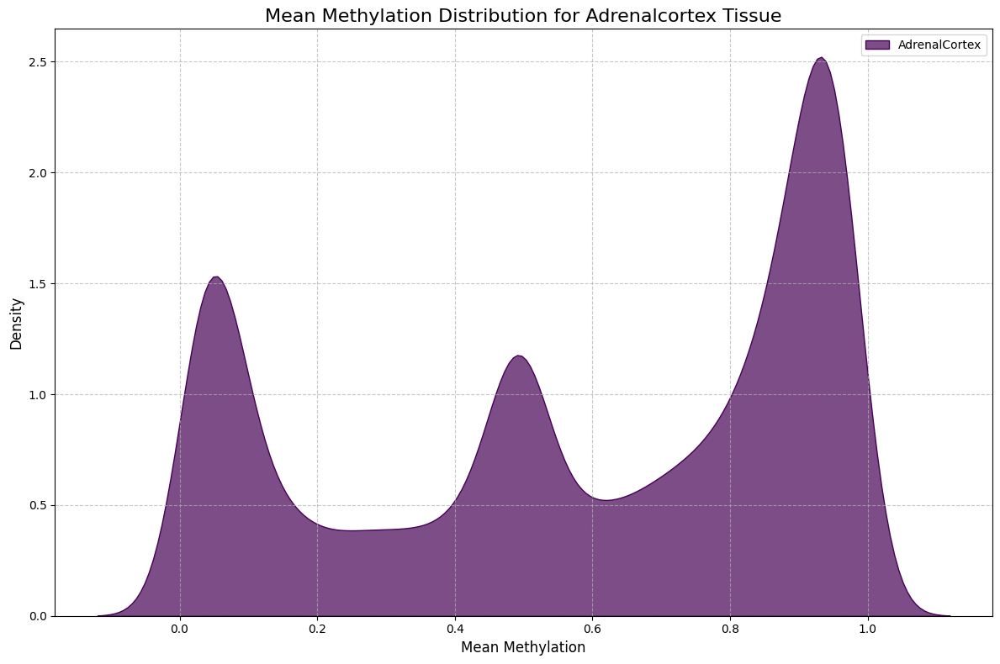

C:\Users\Catia Antunes\AppData\Local\Temp\ipykernel_14380\2229337593.py:44: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(data=globals()[tissue]['Mean'],


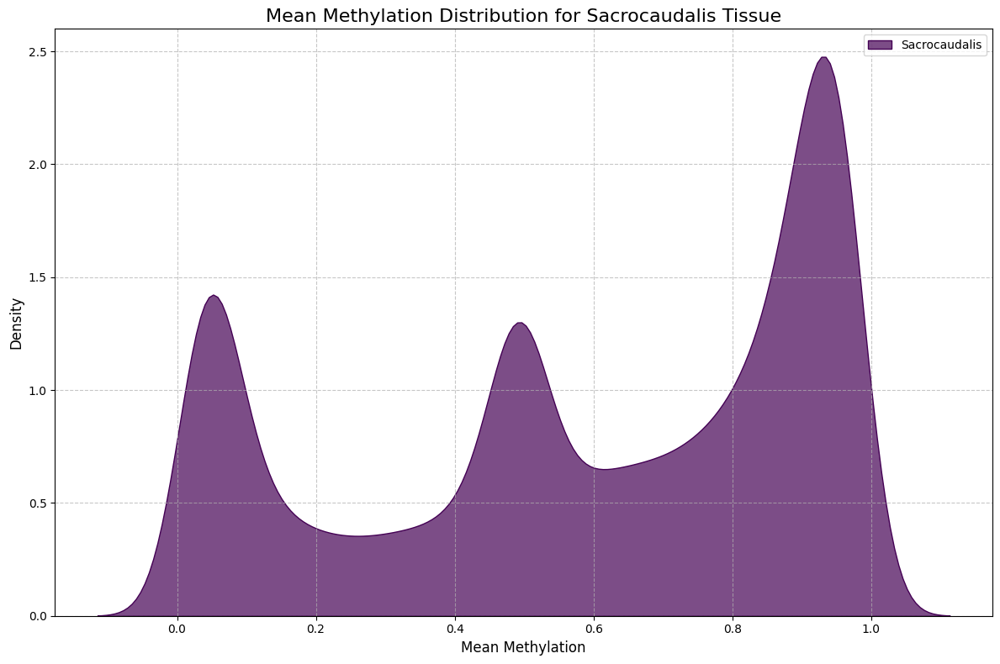

C:\Users\Catia Antunes\AppData\Local\Temp\ipykernel_14380\2229337593.py:44: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(data=globals()[tissue]['Mean'],


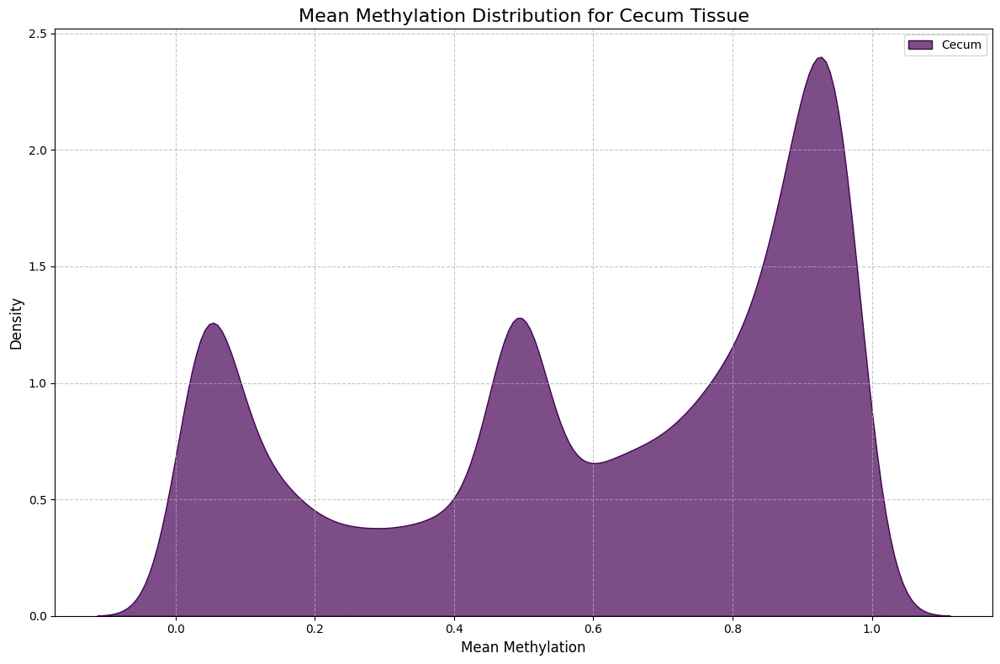

C:\Users\Catia Antunes\AppData\Local\Temp\ipykernel_14380\2229337593.py:44: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(data=globals()[tissue]['Mean'],


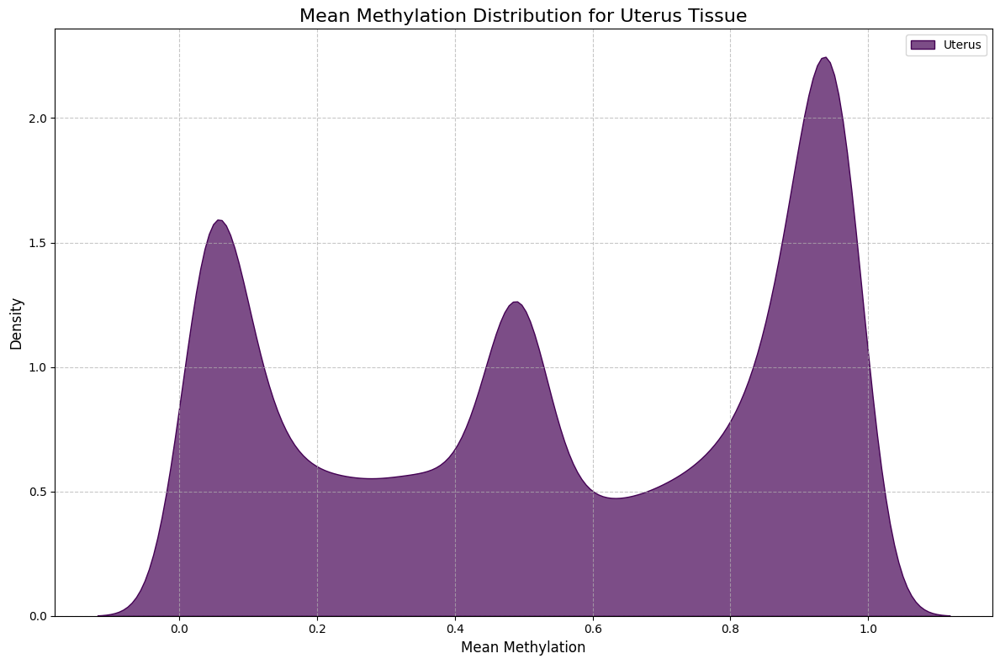

C:\Users\Catia Antunes\AppData\Local\Temp\ipykernel_14380\2229337593.py:44: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(data=globals()[tissue]['Mean'],


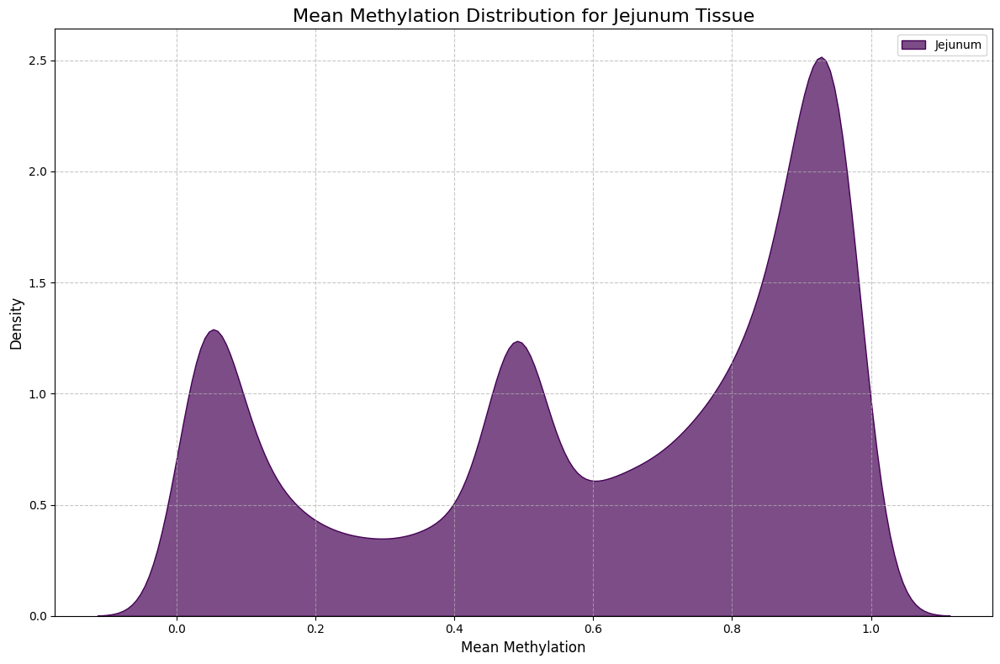

C:\Users\Catia Antunes\AppData\Local\Temp\ipykernel_14380\2229337593.py:44: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(data=globals()[tissue]['Mean'],


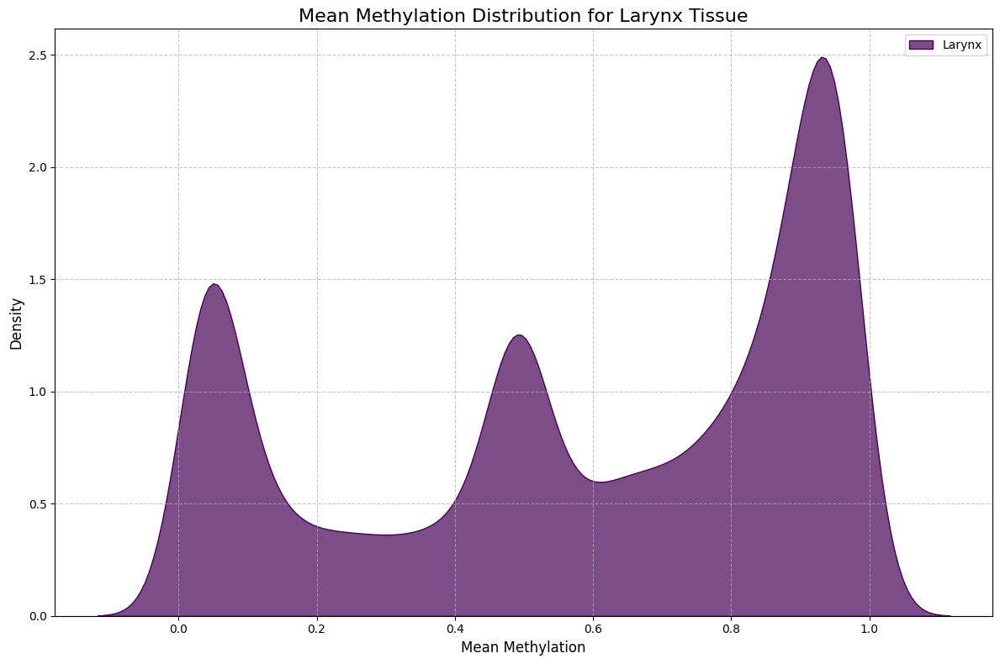

C:\Users\Catia Antunes\AppData\Local\Temp\ipykernel_14380\2229337593.py:44: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(data=globals()[tissue]['Mean'],


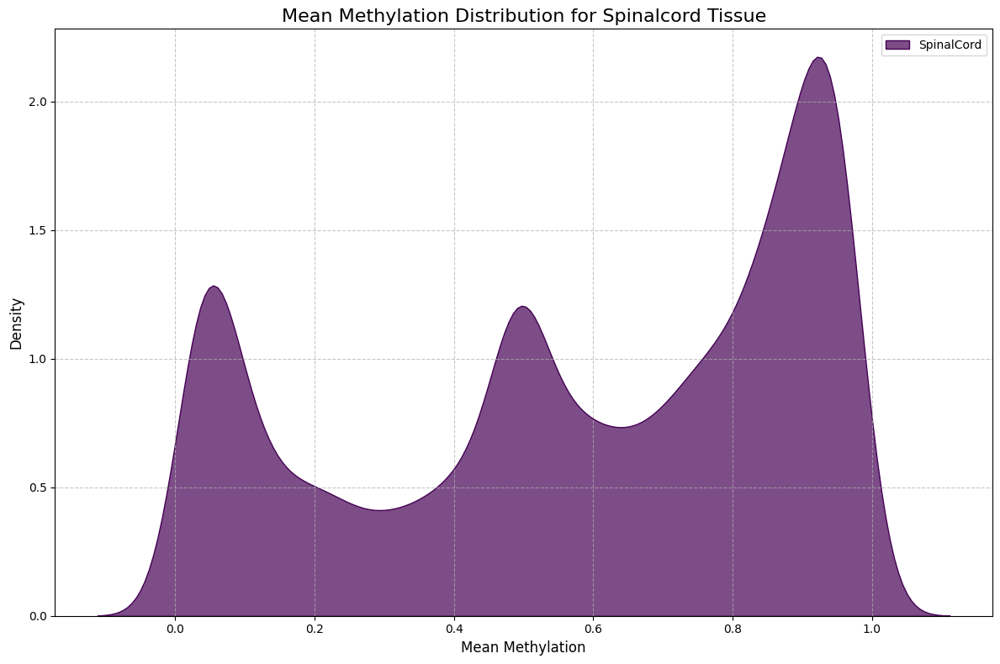

C:\Users\Catia Antunes\AppData\Local\Temp\ipykernel_14380\2229337593.py:44: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(data=globals()[tissue]['Mean'],


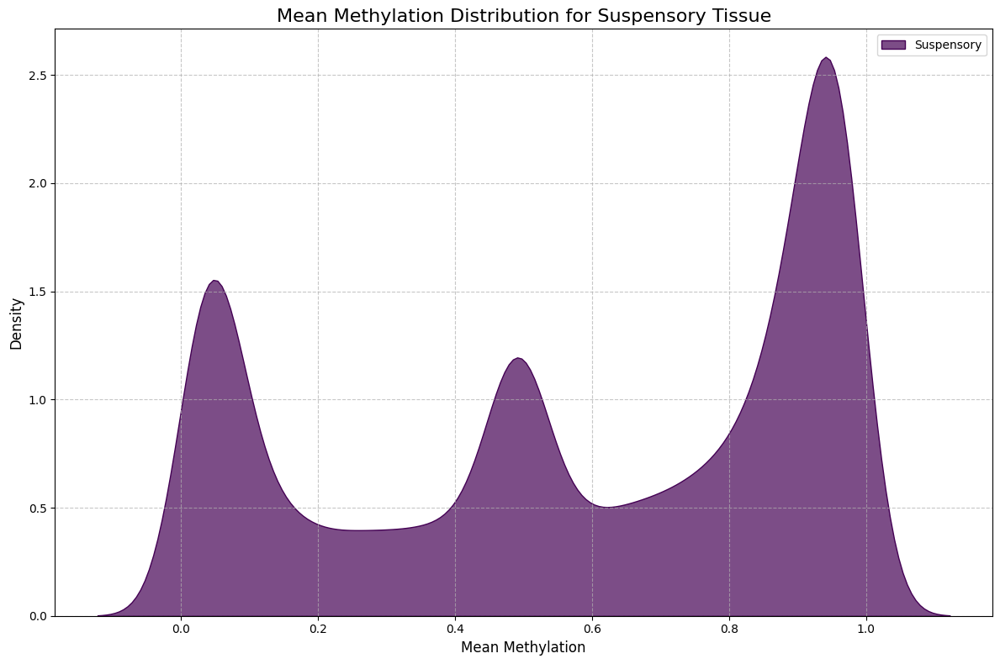

C:\Users\Catia Antunes\AppData\Local\Temp\ipykernel_14380\2229337593.py:44: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(data=globals()[tissue]['Mean'],


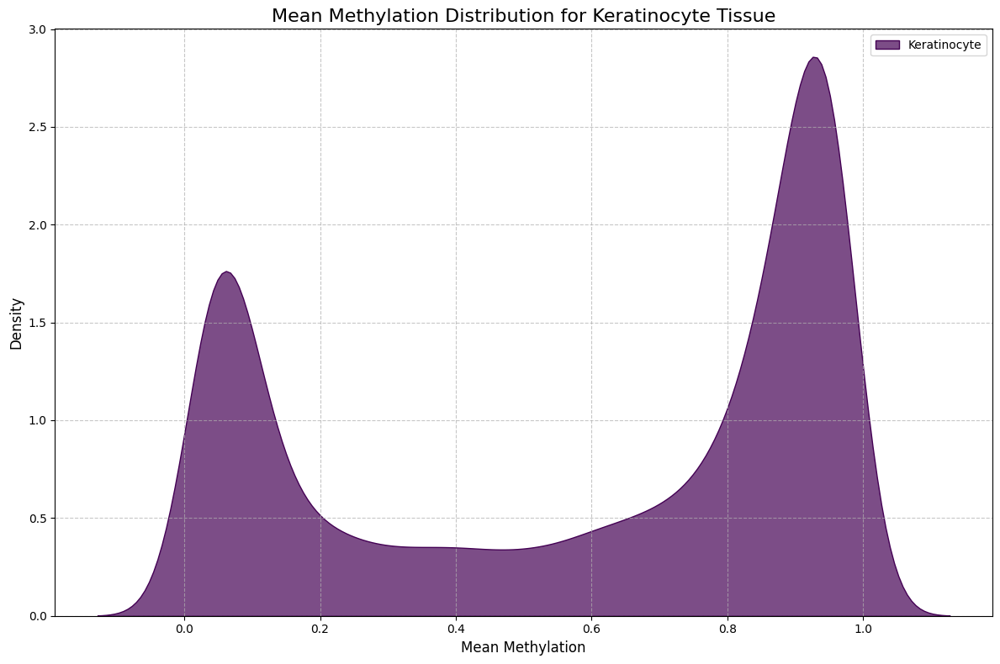

C:\Users\Catia Antunes\AppData\Local\Temp\ipykernel_14380\2229337593.py:44: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(data=globals()[tissue]['Mean'],


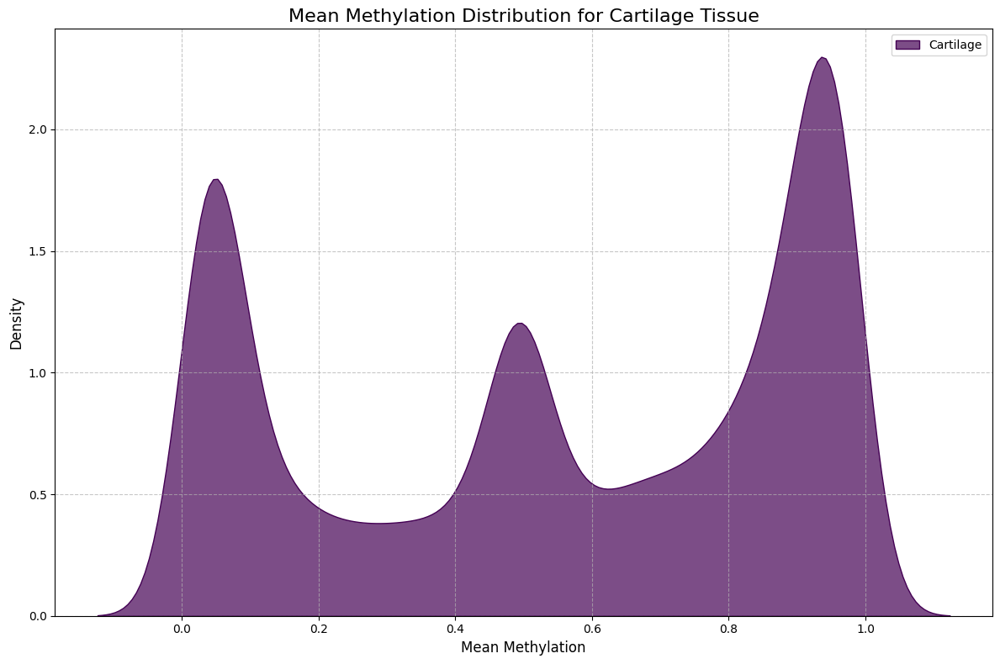

C:\Users\Catia Antunes\AppData\Local\Temp\ipykernel_14380\2229337593.py:44: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(data=globals()[tissue]['Mean'],


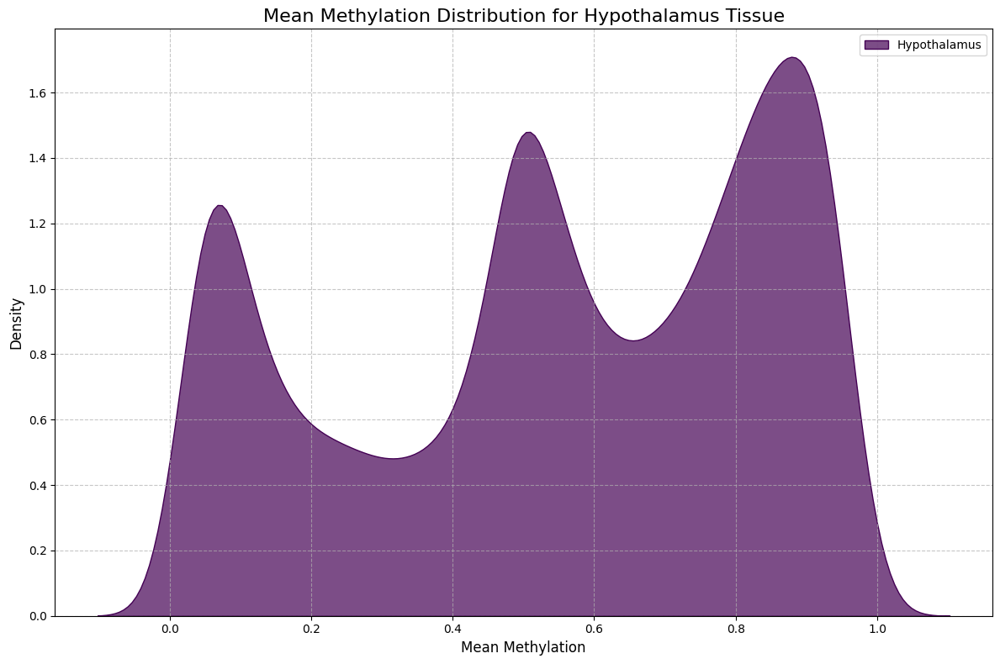

C:\Users\Catia Antunes\AppData\Local\Temp\ipykernel_14380\2229337593.py:44: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(data=globals()[tissue]['Mean'],


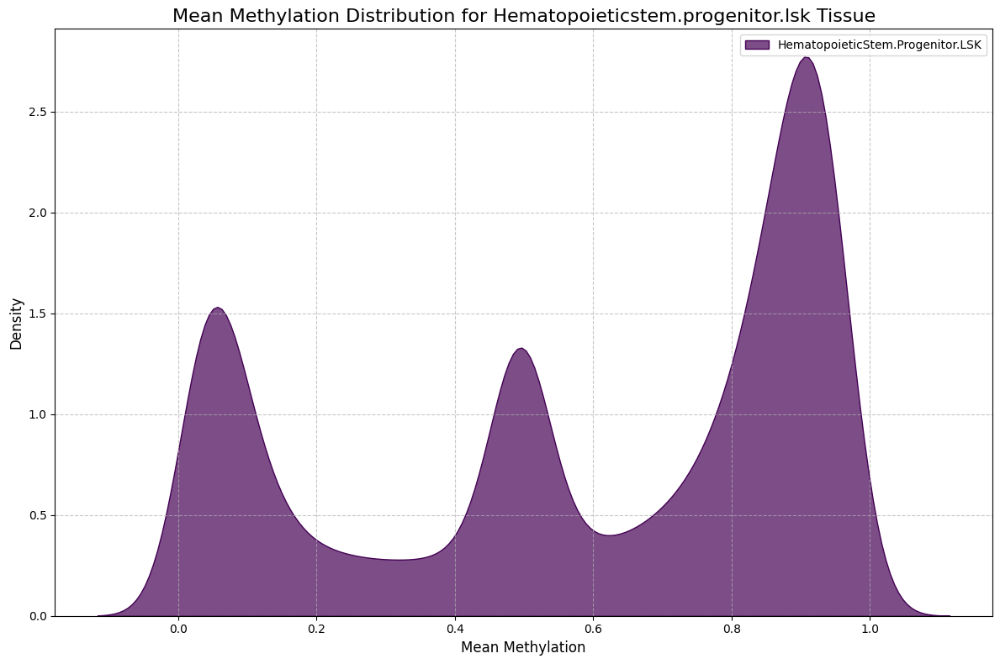

C:\Users\Catia Antunes\AppData\Local\Temp\ipykernel_14380\2229337593.py:44: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(data=globals()[tissue]['Mean'],


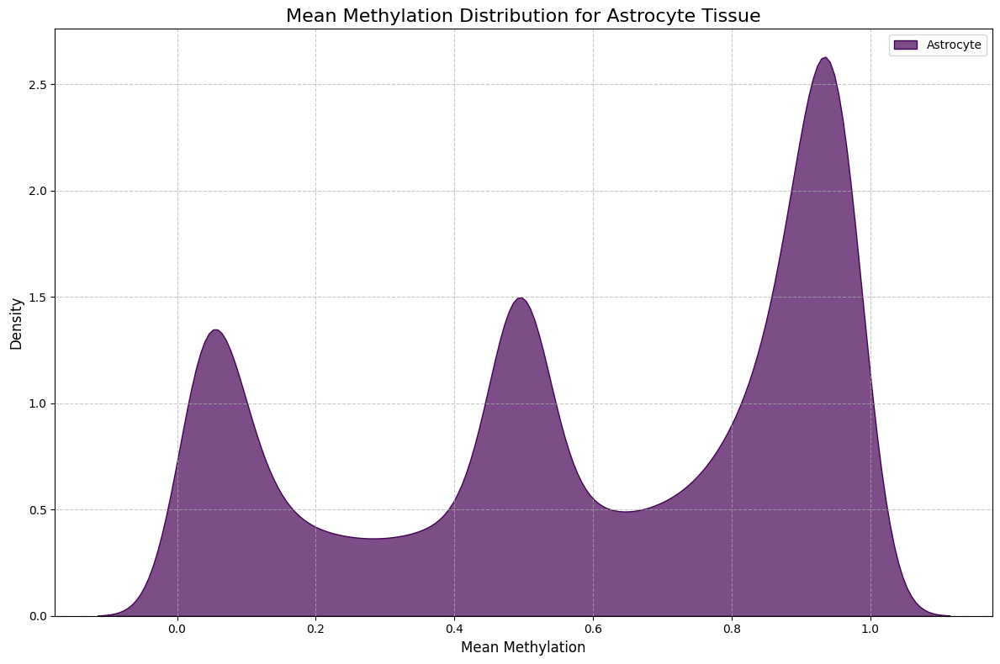

C:\Users\Catia Antunes\AppData\Local\Temp\ipykernel_14380\2229337593.py:44: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(data=globals()[tissue]['Mean'],


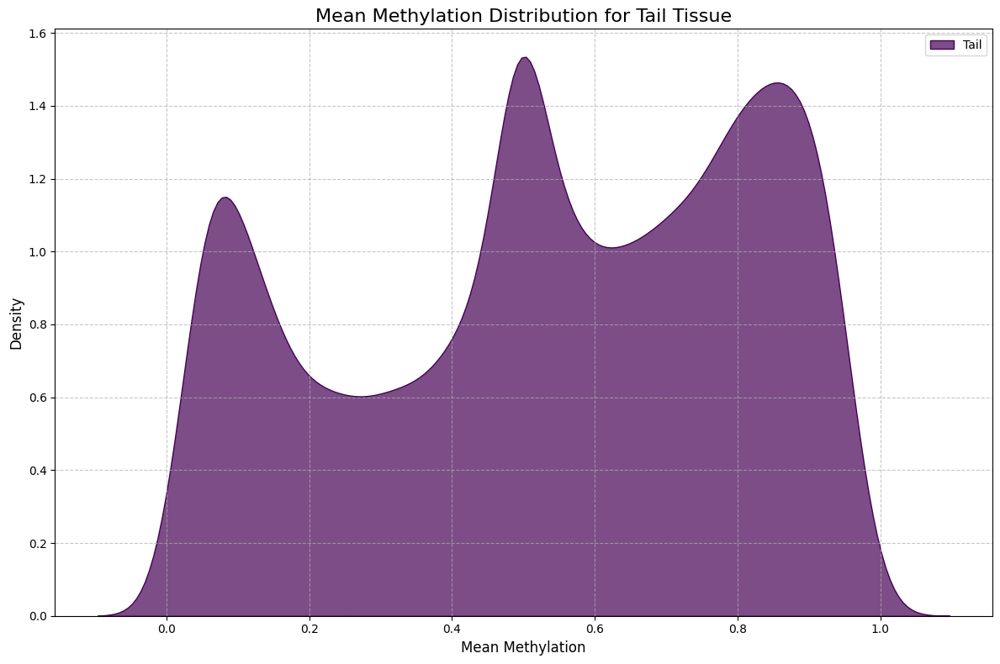

C:\Users\Catia Antunes\AppData\Local\Temp\ipykernel_14380\2229337593.py:44: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(data=globals()[tissue]['Mean'],


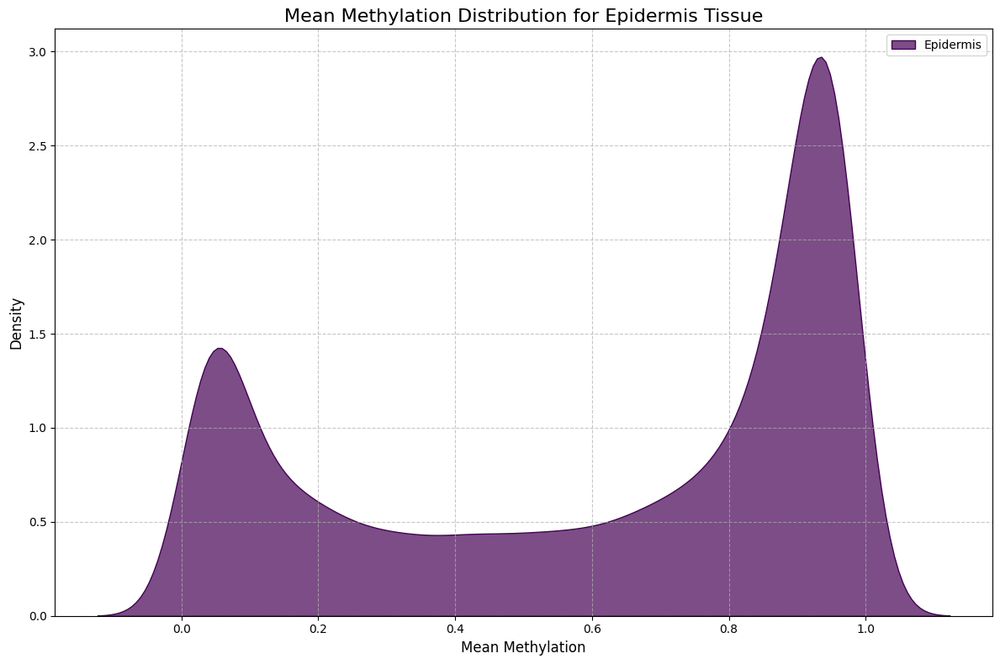

C:\Users\Catia Antunes\AppData\Local\Temp\ipykernel_14380\2229337593.py:44: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(data=globals()[tissue]['Mean'],


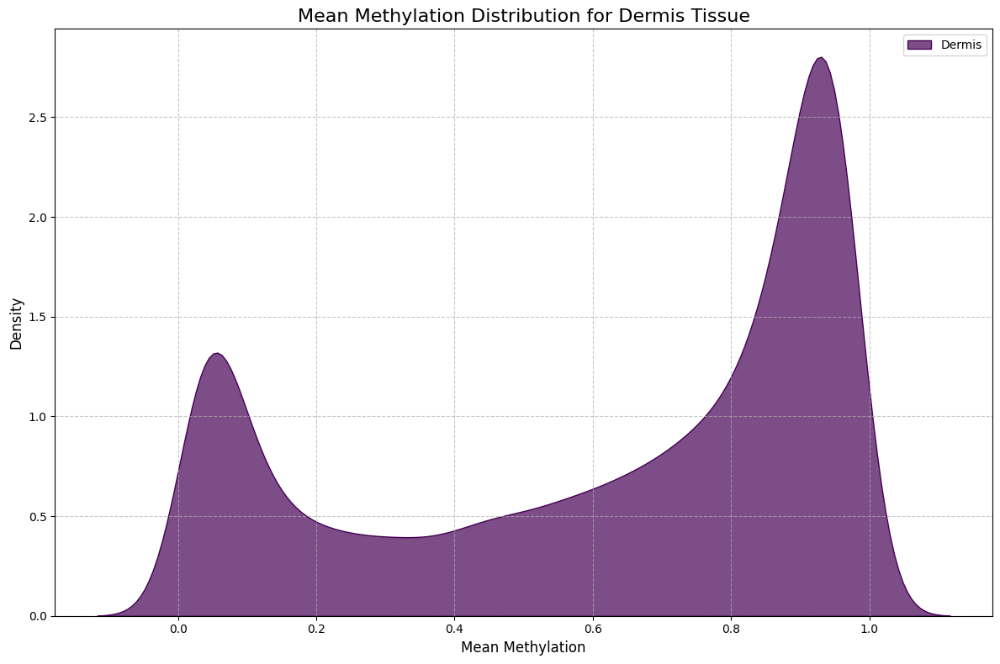

C:\Users\Catia Antunes\AppData\Local\Temp\ipykernel_14380\2229337593.py:44: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(data=globals()[tissue]['Mean'],


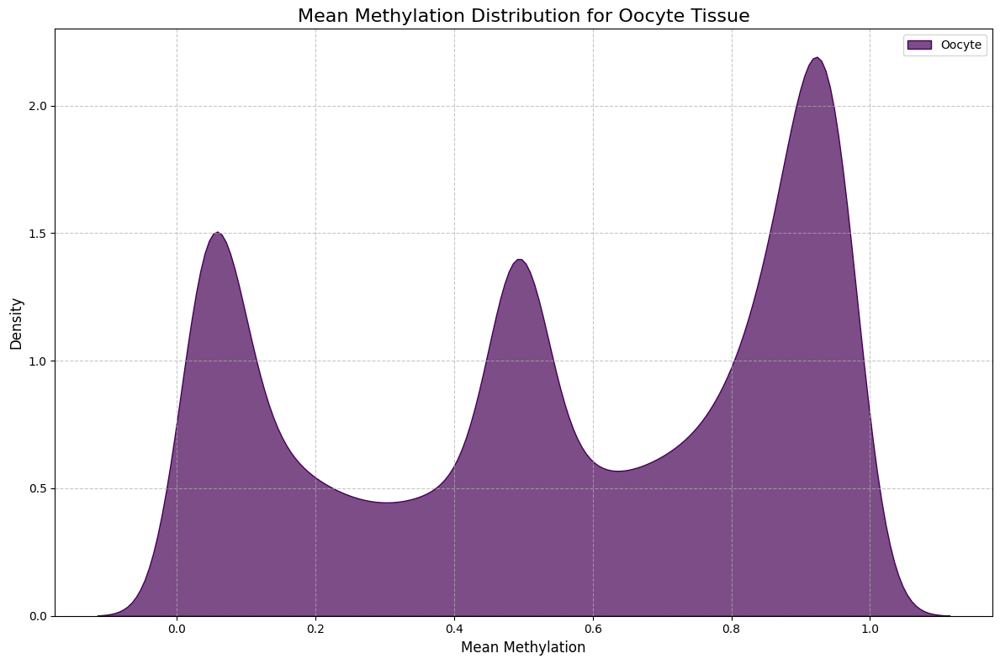

C:\Users\Catia Antunes\AppData\Local\Temp\ipykernel_14380\2229337593.py:44: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(data=globals()[tissue]['Mean'],


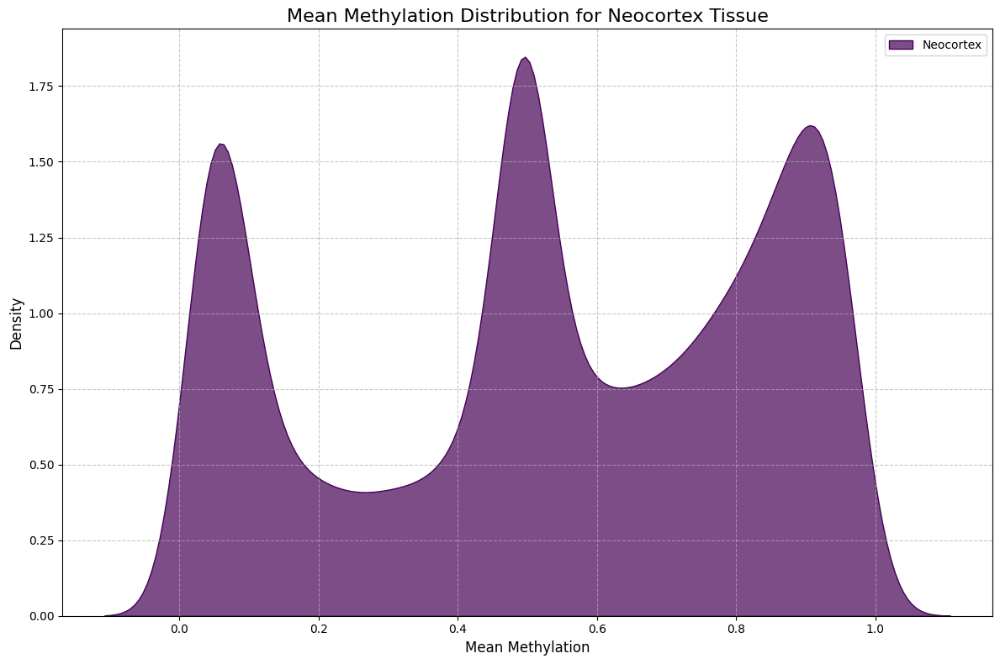

C:\Users\Catia Antunes\AppData\Local\Temp\ipykernel_14380\2229337593.py:44: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(data=globals()[tissue]['Mean'],


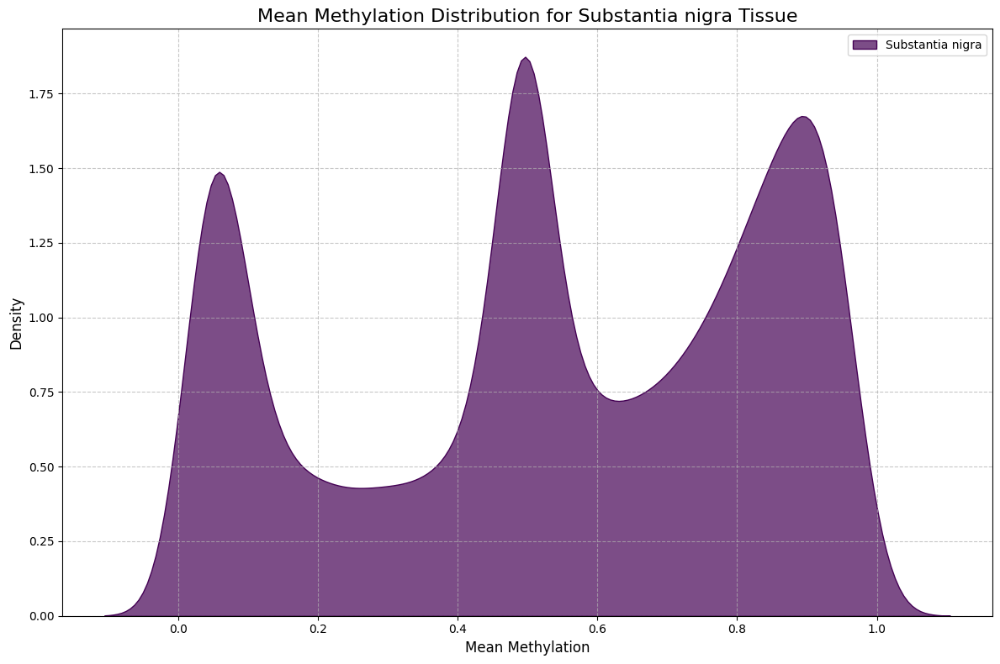

C:\Users\Catia Antunes\AppData\Local\Temp\ipykernel_14380\2229337593.py:44: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(data=globals()[tissue]['Mean'],


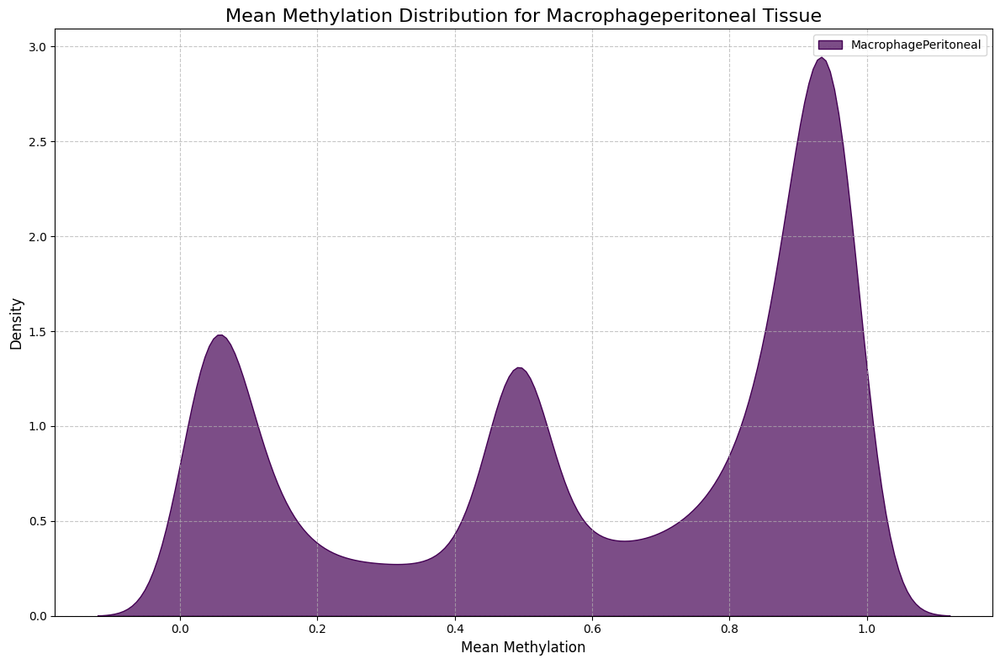

C:\Users\Catia Antunes\AppData\Local\Temp\ipykernel_14380\2229337593.py:44: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(data=globals()[tissue]['Mean'],


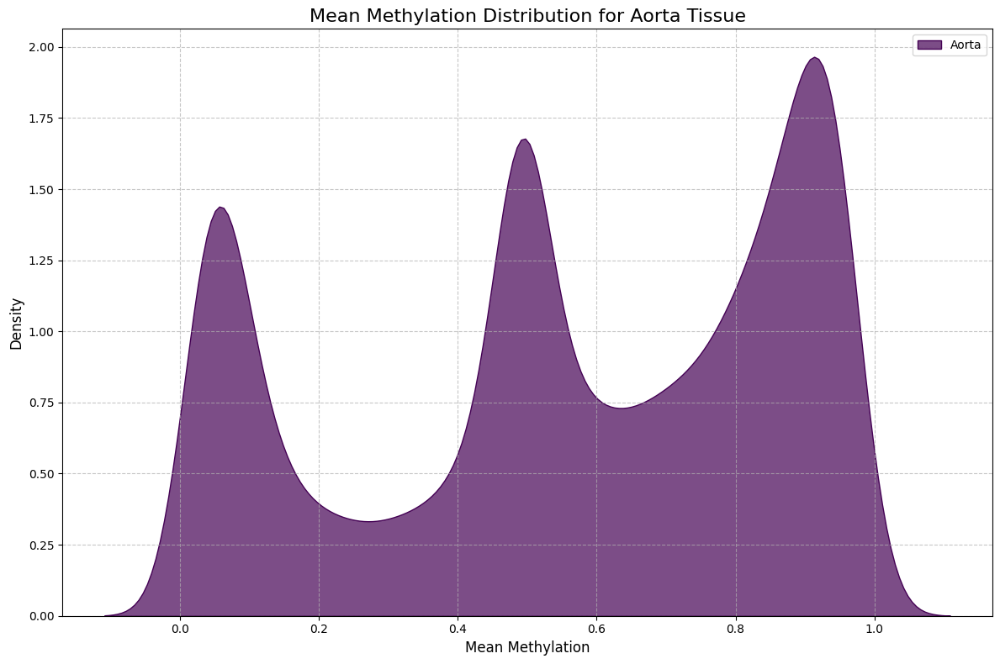

C:\Users\Catia Antunes\AppData\Local\Temp\ipykernel_14380\2229337593.py:44: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(data=globals()[tissue]['Mean'],


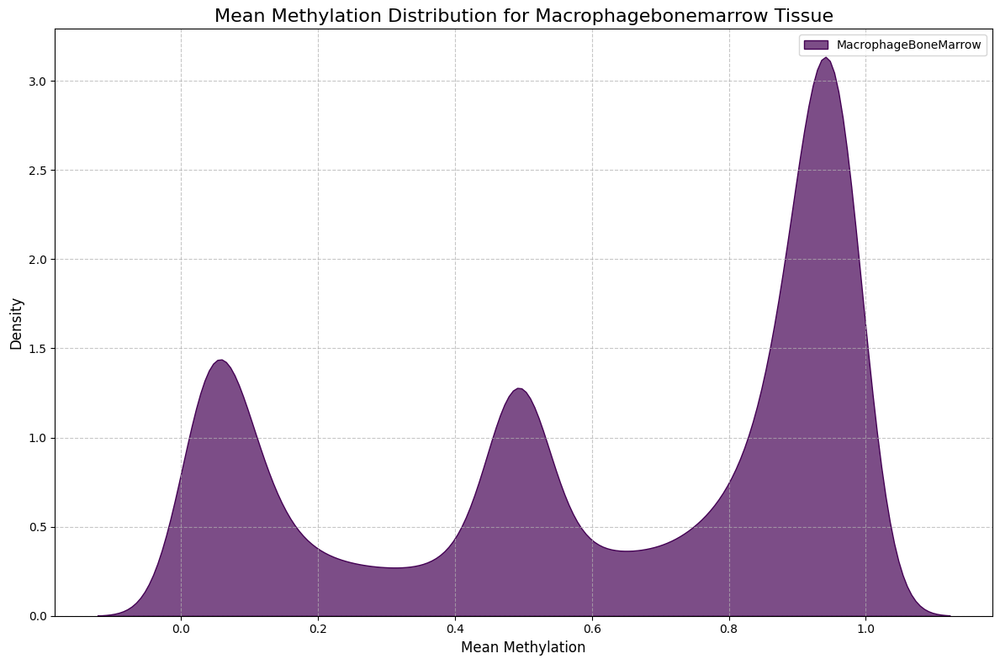

C:\Users\Catia Antunes\AppData\Local\Temp\ipykernel_14380\2229337593.py:44: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(data=globals()[tissue]['Mean'],


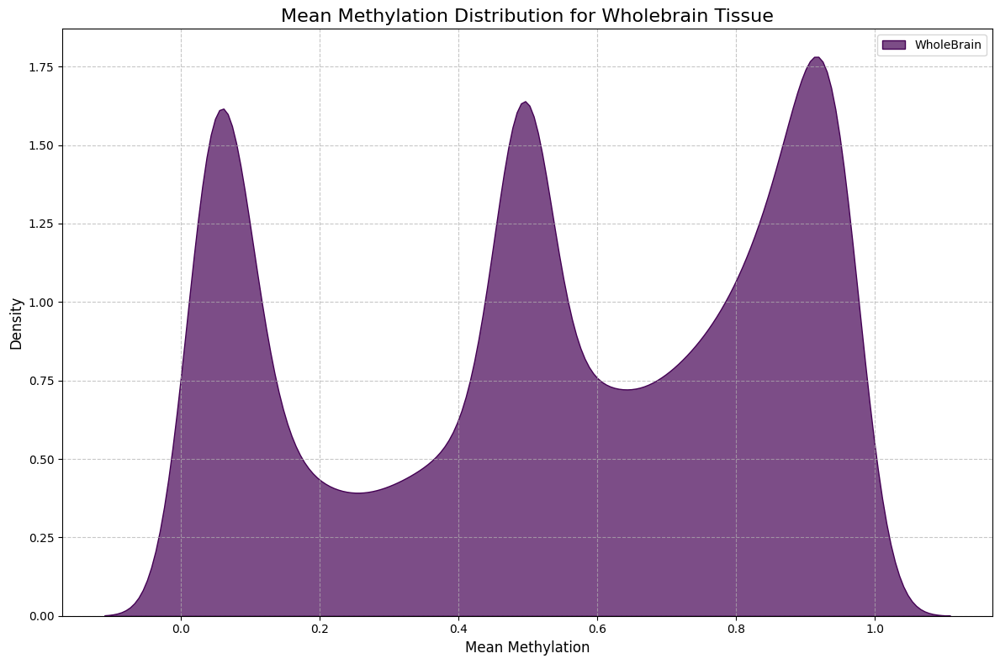

C:\Users\Catia Antunes\AppData\Local\Temp\ipykernel_14380\2229337593.py:44: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(data=globals()[tissue]['Mean'],


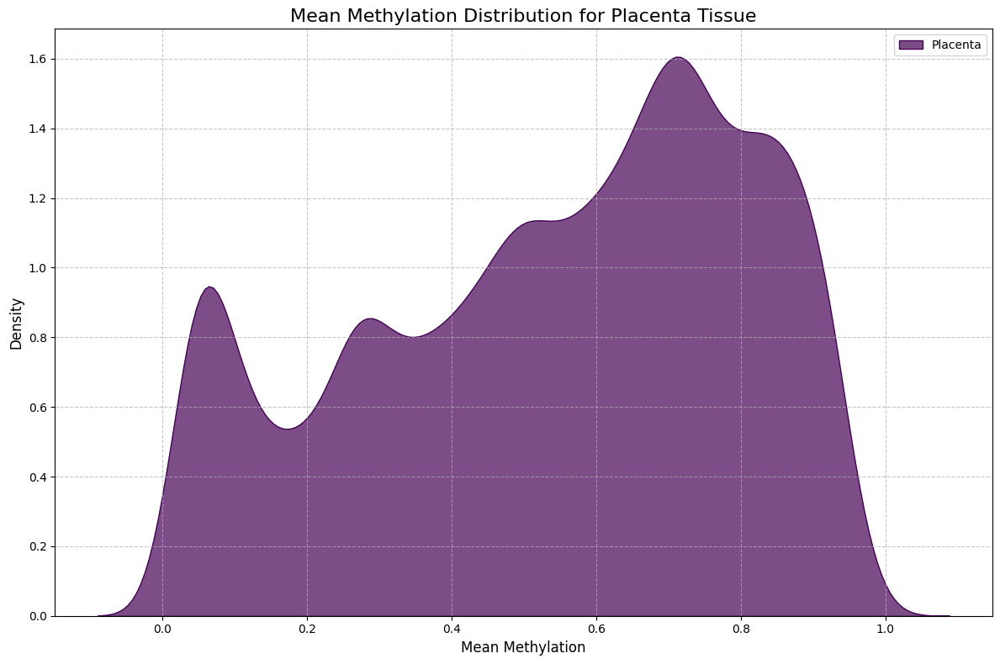

C:\Users\Catia Antunes\AppData\Local\Temp\ipykernel_14380\2229337593.py:44: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(data=globals()[tissue]['Mean'],


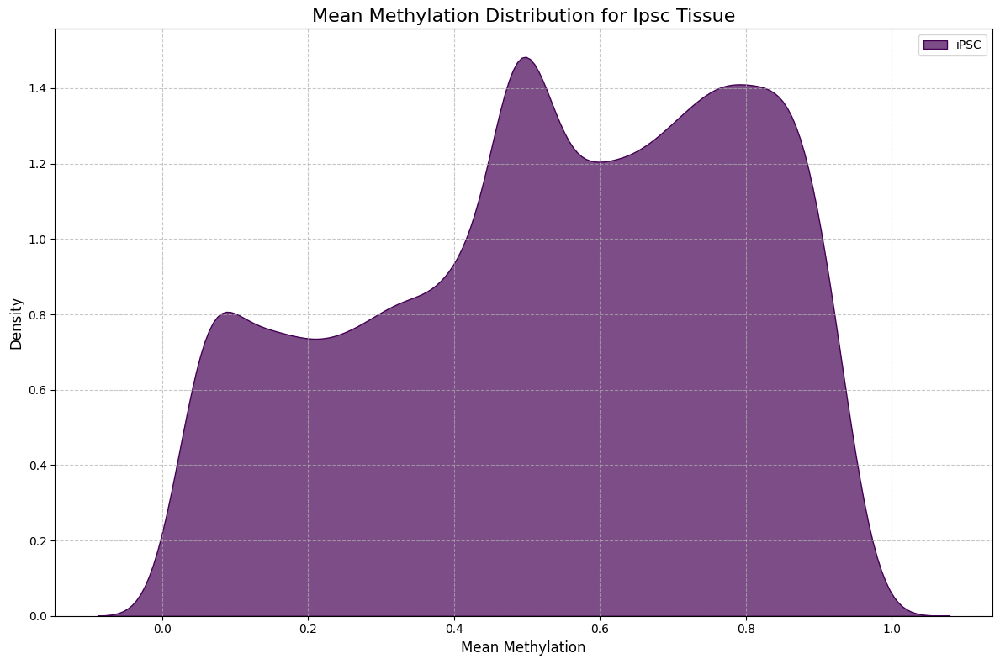

C:\Users\Catia Antunes\AppData\Local\Temp\ipykernel_14380\2229337593.py:44: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(data=globals()[tissue]['Mean'],


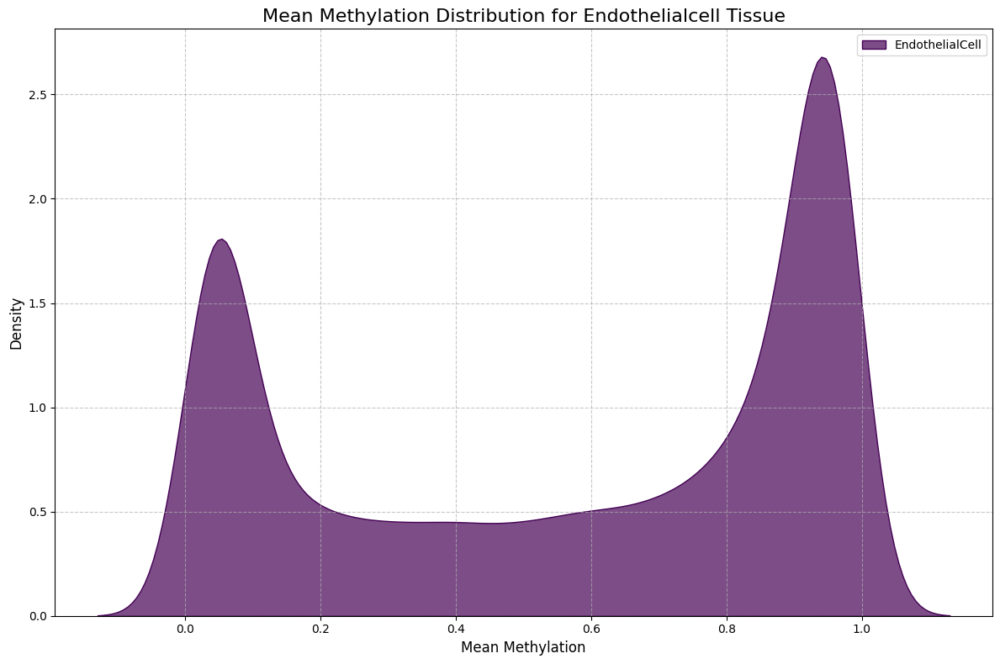

C:\Users\Catia Antunes\AppData\Local\Temp\ipykernel_14380\2229337593.py:44: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(data=globals()[tissue]['Mean'],


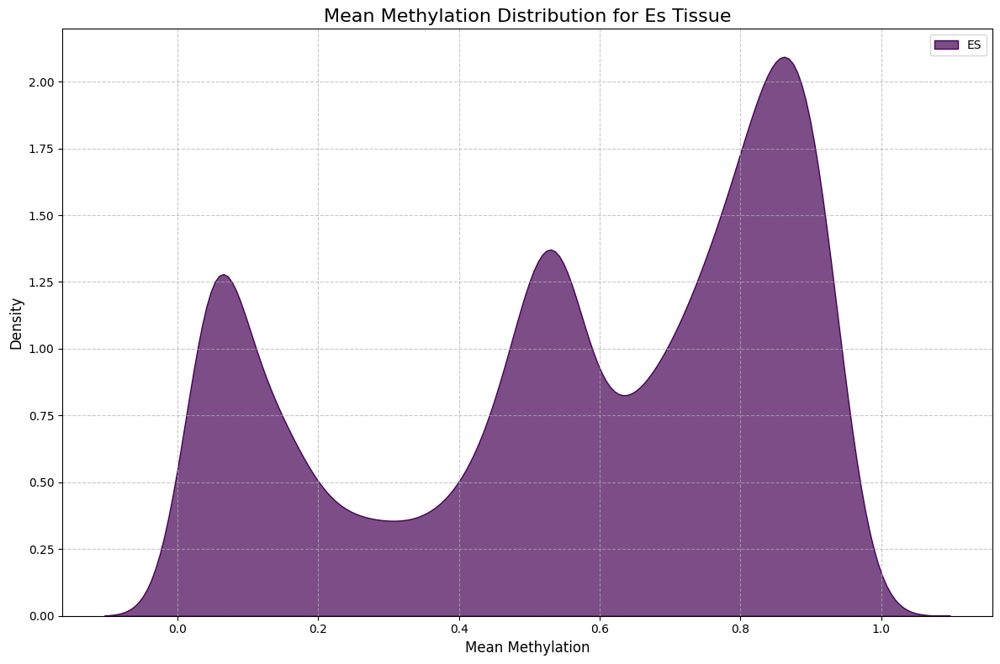

C:\Users\Catia Antunes\AppData\Local\Temp\ipykernel_14380\2229337593.py:44: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(data=globals()[tissue]['Mean'],


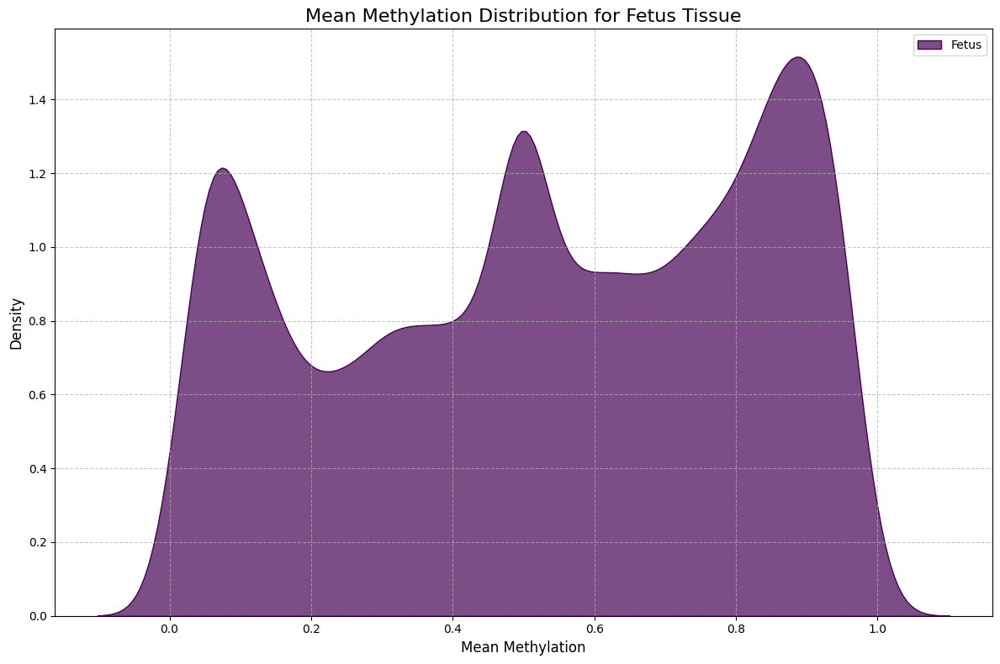

C:\Users\Catia Antunes\AppData\Local\Temp\ipykernel_14380\2229337593.py:44: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(data=globals()[tissue]['Mean'],


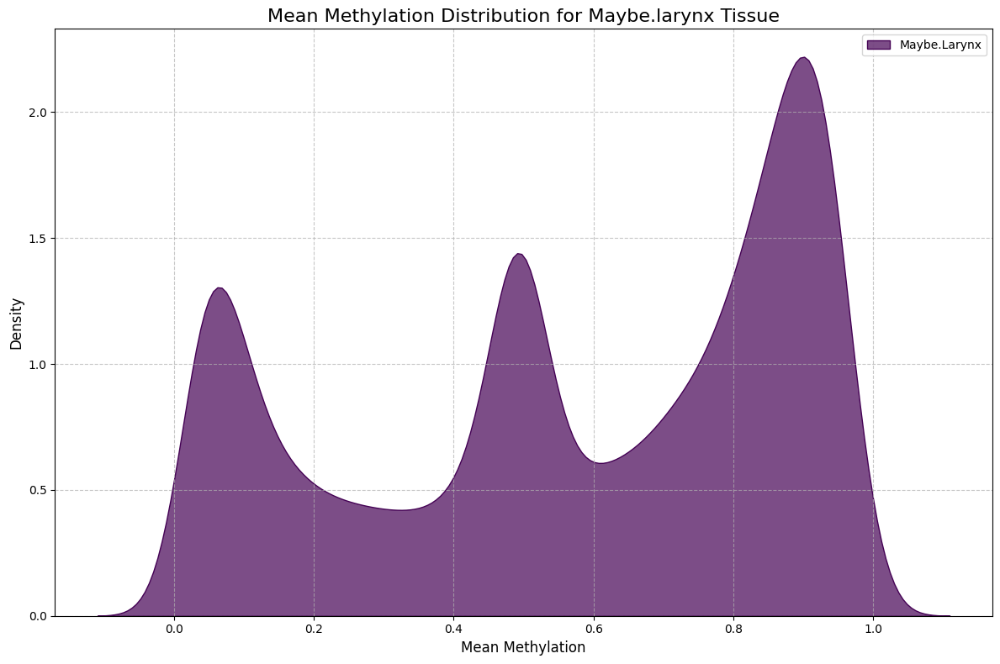

C:\Users\Catia Antunes\AppData\Local\Temp\ipykernel_14380\2229337593.py:44: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(data=globals()[tissue]['Mean'],


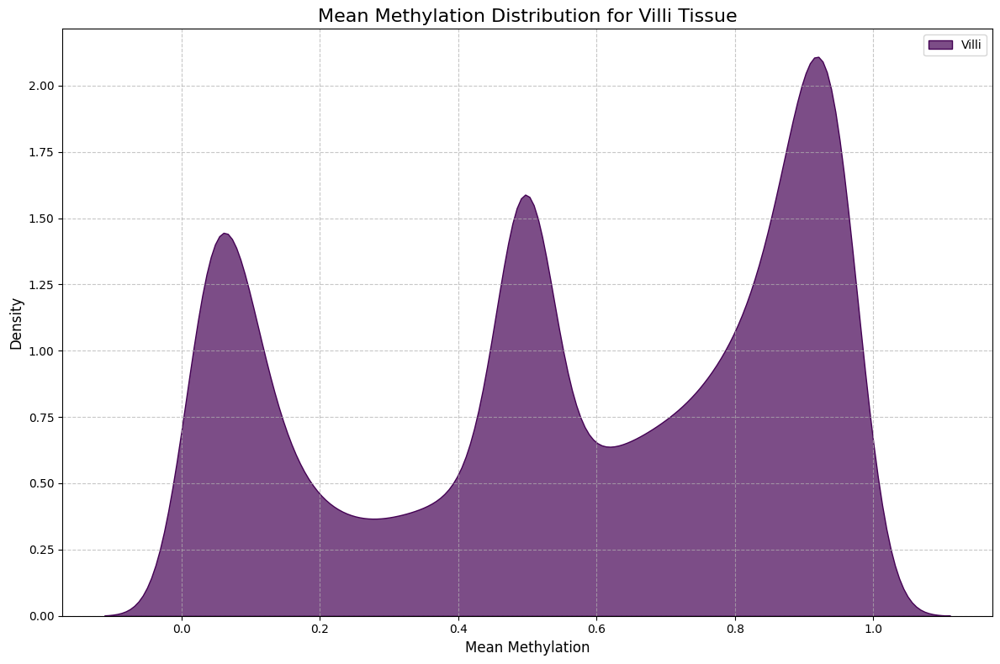

C:\Users\Catia Antunes\AppData\Local\Temp\ipykernel_14380\2229337593.py:44: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(data=globals()[tissue]['Mean'],


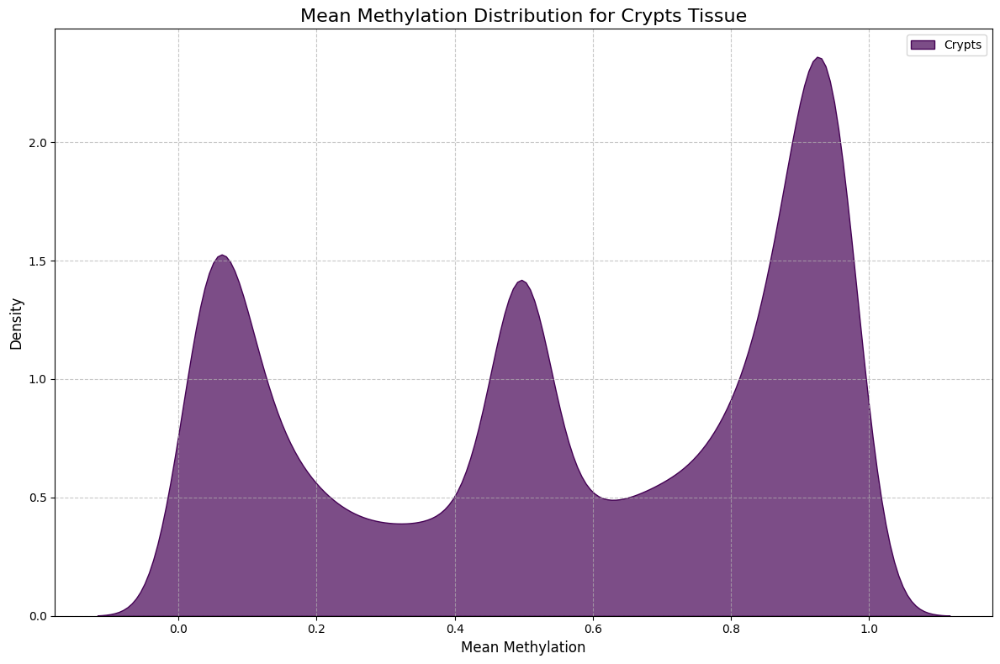

C:\Users\Catia Antunes\AppData\Local\Temp\ipykernel_14380\2229337593.py:44: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(data=globals()[tissue]['Mean'],


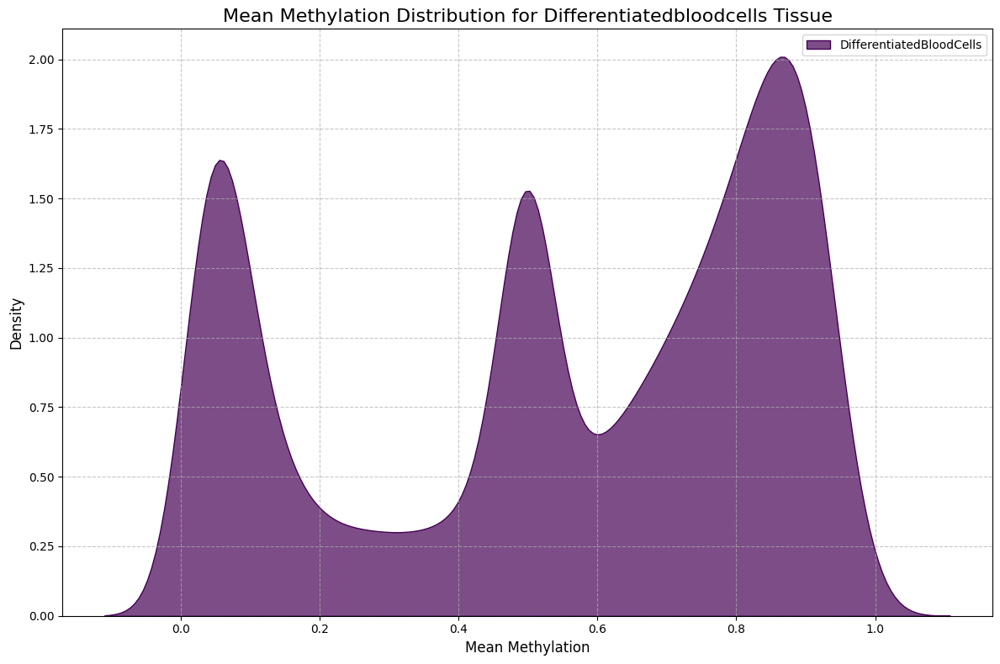

C:\Users\Catia Antunes\AppData\Local\Temp\ipykernel_14380\2229337593.py:44: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(data=globals()[tissue]['Mean'],


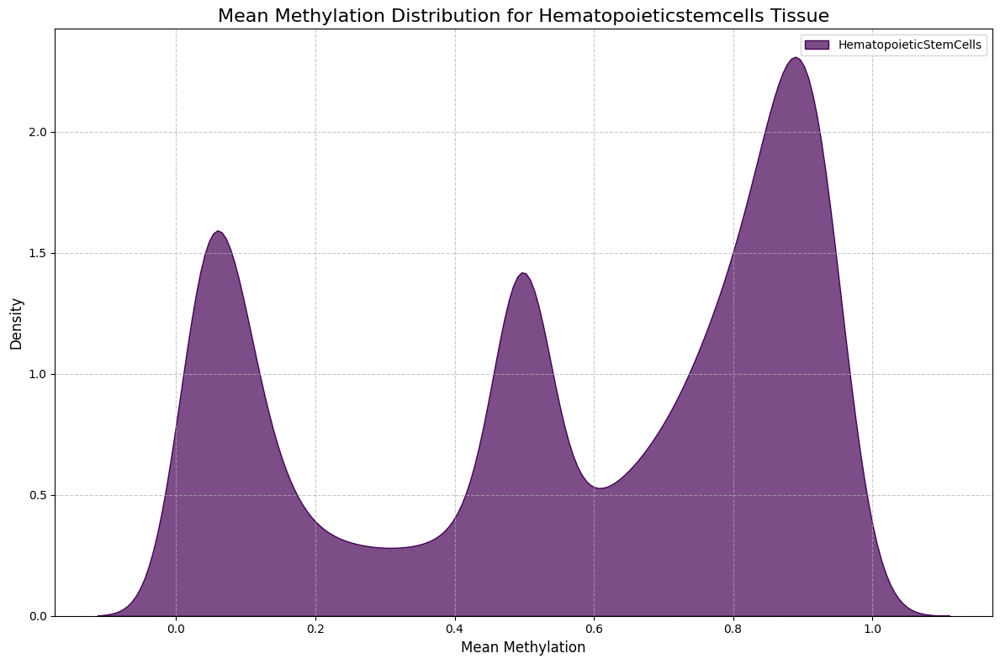

C:\Users\Catia Antunes\AppData\Local\Temp\ipykernel_14380\2229337593.py:44: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(data=globals()[tissue]['Mean'],


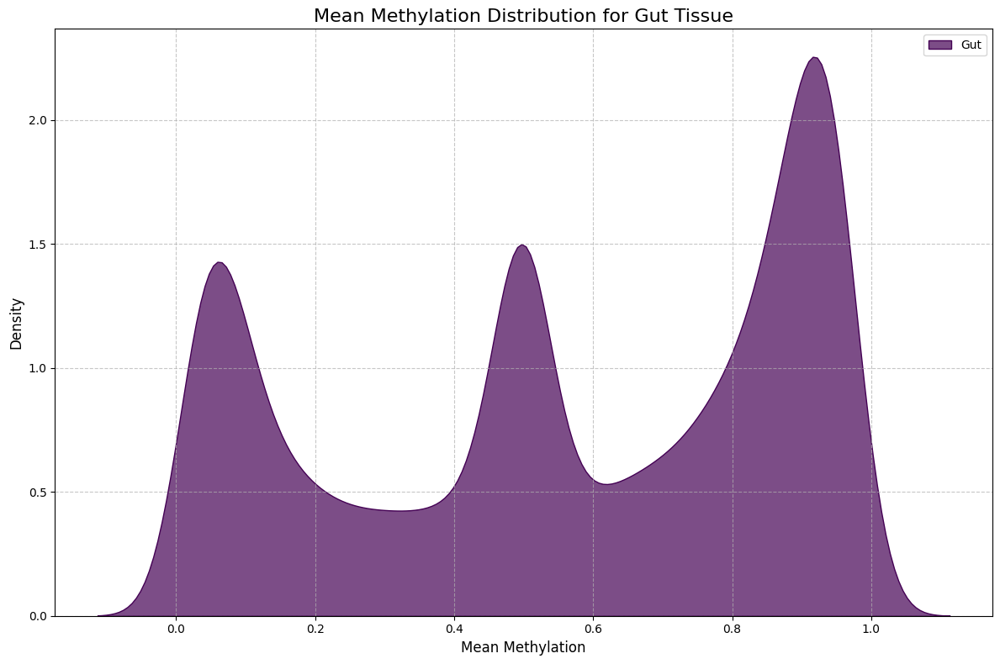

In [79]:
### Density plots of the mean methylation for each tissue dataset

# Start Dask client
client = Client()

# Shutdown the client when done
client.shutdown()

def plot_tissue_means(tissue_group, title):
    plt.figure(figsize=(12, 8))
    
    # Get the viridis color map
    cmap = plt.get_cmap('viridis')
    colors = cmap(np.linspace(0, 1, len(tissue_group)))
    
    for tissue, color in zip(tissue_group, colors):
        sns.kdeplot(data=globals()[tissue]['Mean'], 
                    label=tissue.replace('_mean_var', ''),
                    color=color,
                    fill=True,  # This fills the area under the curve
                    alpha=0.2)  # Adjust alpha for better visibility when overlapping
    
    plt.title(title, fontsize=16)
    plt.xlabel('Mean Methylation', fontsize=12)
    plt.ylabel('Density', fontsize=12)
    plt.legend(fontsize=10)
    plt.grid(True, linestyle='--', alpha=0.7)
    plt.tight_layout()
    plt.show()

# Plot for each tissue
for tissue in tissues:
    tissue_var_name = f"{tissue}_mean_var"
    plot_tissue_means([tissue_var_name], f"Mean Methylation Distribution for {tissue.capitalize()} Tissue")


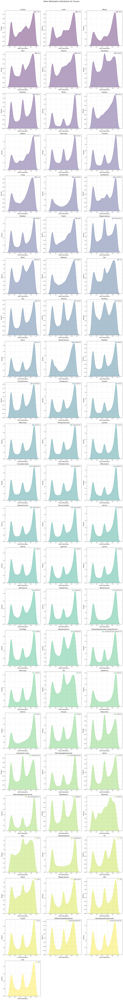

In [101]:
### Density plots of the mean methylation for all tissues in a single figure with subplots

def plot_tissue_means(tissues, title):
    num_tissues = len(tissues)
    cols = 3  # Number of columns for subplots
    rows = (num_tissues // cols) + (num_tissues % cols > 0)  # Calculate rows needed
    
    fig, axes = plt.subplots(rows, cols, figsize=(18, 6 * rows))
    axes = axes.flatten()  # Flatten the axes array for easy iteration
    
    # Get the viridis color map
    cmap = plt.get_cmap('viridis')
    colors = cmap(np.linspace(0, 1, num_tissues))
    
    for i, (tissue, color) in enumerate(zip(tissues, colors)):
        sns.kdeplot(data=globals()[tissue]['Mean'], 
                    label=tissue.replace('_mean_var', ''),
                    color=color,
                    fill=True,  # This fills the area under the curve
                    alpha=0.4,  # Adjust alpha for better visibility when overlapping
                    ax=axes[i])
        
        axes[i].set_title(tissue.replace('_mean_var', '').capitalize(), fontsize=16)
        axes[i].set_xlabel('Mean Methylation', fontsize=12)
        axes[i].set_ylabel('Density', fontsize=12)
        axes[i].legend(fontsize=10)
        axes[i].grid(True, linestyle='--', alpha=0.7)
    
    # Remove any empty subplots
    for j in range(i + 1, len(axes)):
        fig.delaxes(axes[j])
    
    # Add the main title
    plt.suptitle(title, fontsize=18, y=1.01)  # Adjust y to move title closer to plots
    
    # Adjust layout to make room for the suptitle
    plt.tight_layout(rect=[0, 0, 1, 0.99])
    fig.subplots_adjust(top=1.00)  # Adjust this value to move the plots up/down
    
    plt.show()

# Plot for all tissues in a single figure with subplots
plot_tissue_means([f"{tissue}_mean_var" for tissue in tissues], "Mean Methylation Distribution for Tissues")


### 3. Compare the mean CpG beta values

#### 3.1 Compare the mean of each CpG in the full dataset with the mean of each tissue in the tissue specific datasets (Full vs Tissue)

In [135]:
### Testing normality, equal variances, and performing comparisons [with Shapiro-Wilk, Levene's, t-test, Welch's t-test, and Mann-Whitney U test]

# Create an empty list to store comparison results
comparison_results = []

# Function to test assumptions and perform comparisons
@delayed
def test_assumptions_and_compare(complete_data, tissue_data, tissue_name):
    # Perform Shapiro-Wilk test for normality
    _, p_value_normality_complete = shapiro(complete_data['Mean'])
    _, p_value_normality_tissue = shapiro(tissue_data)
    
    # Perform Levene's test for equal variances
    _, p_value_levene = levene(complete_data['Mean'], tissue_data)
    
    # Calculate Pearson correlation coefficient
    correlation, _ = pearsonr(complete_data['Mean'], tissue_data)
    
    # Perform t-test
    t_statistic_ttest, p_value_ttest = ttest_ind(complete_data['Mean'], tissue_data)
    
    # Perform Welch's t-test
    t_statistic_welch, p_value_welch = ttest_ind(complete_data['Mean'], tissue_data, equal_var=False)
    
    # Perform Mann-Whitney U test
    u_statistic, p_value_mannwhitneyu = mannwhitneyu(complete_data['Mean'], tissue_data)
    
    # # Print assumption test results
    # print(f'Tissue: {tissue_name}')
    # print(f'Normality (Shapiro-Wilk test) p-value (Complete dataset): {p_value_normality_complete}')
    # print(f'Normality (Shapiro-Wilk test) p-value (Tissue dataset): {p_value_normality_tissue}')
    # print(f'Equal Variances (Levene\'s test) p-value: {p_value_levene}\n')
    
    # Append comparison results to the list
    return {
        'Tissue': tissue_name,
        'Pearsons Correlation': correlation,
        'P-value (t-test)': p_value_ttest,
        'P-value (Mann-Whitney U test)': p_value_mannwhitneyu,
        'P-value (Welch\'s t-test)': p_value_welch
    }

# Loop through each tissue-specific dataset and perform the tests using Dask
tasks = []
for tissue in tissues:
    tissue_mean = globals()['{}_mean_var'.format(tissue)]['Mean']
    tasks.append(test_assumptions_and_compare(complete_methylation_data, tissue_mean, tissue))

# Compute all tasks in parallel
comparison_results = compute(*tasks)

# Convert the list of dictionaries to a DataFrame
comparison_results_df = pd.DataFrame(comparison_results)

# Sort by P-value (Mann-Whitney U test) in ascending order
comparison_results_df.sort_values(by='P-value (Mann-Whitney U test)', ascending=True, inplace=True)

# Print or further analyze the comparison results
comparison_results_df

C:\Users\Catia Antunes\AppData\Local\Temp\ipykernel_3380\1915469811.py:17: UserWarning: scipy.stats.shapiro: For N > 5000, computed p-value may not be accurate. Current N is 37554.
  _, p_value_normality_complete = shapiro(complete_data['Mean'])
C:\Users\Catia Antunes\AppData\Local\Temp\ipykernel_3380\1915469811.py:18: UserWarning: scipy.stats.shapiro: For N > 5000, computed p-value may not be accurate. Current N is 37554.
  _, p_value_normality_tissue = shapiro(tissue_data)


Tissue: CortexTissue: FrontalCortex
Normality (Shapiro-Wilk test) p-value (Complete dataset): 2.1346812430838566e-87
Normality (Shapiro-Wilk test) p-value (Tissue dataset): 1.0983806366801605e-89
Equal Variances (Levene's test) p-value: 0.0

Tissue: Sacrocaudalis
Normality (Shapiro-Wilk test) p-value (Complete dataset): 2.1346812430838566e-87
Normality (Shapiro-Wilk test) p-value (Tissue dataset): 3.3103803250587363e-94
Equal Variances (Levene's test) p-value: 0.0

Tissue: Kidney
Normality (Shapiro-Wilk test) p-value (Complete dataset): 2.1346812430838566e-87
Normality (Shapiro-Wilk test) p-value (Tissue dataset): 2.9019874970240908e-86
Equal Variances (Levene's test) p-value: 1.7072351015272094e-68


Normality (Shapiro-Wilk test) p-value (Complete dataset): 2.1346812430838566e-87
Normality (Shapiro-Wilk test) p-value (Tissue dataset): 7.113822556867537e-86
Equal Variances (Levene's test) p-value: 8.017848751868345e-165

Tissue: Brain
Normality (Shapiro-Wilk test) p-value (Complete dat

,Tissue,Pearsons Correlation,P-value (t-test),P-value (Mann-Whitney U test),P-value (Welch's t-test)
13,LymphNode,0.900595,1.584529e-141,0.000000e+00,1.637579e-141
7,Testis,0.775442,6.214501e-88,0.000000e+00,6.420681e-88
51,Dermis,0.893712,8.286743e-60,1.285027e-268,8.358367e-60
23,Pituitary,0.821857,3.944371e-274,1.993292e-260,4.010429e-274
57,MacrophageBoneMarrow,0.858099,1.535172e-42,2.511470e-255,1.544276e-42
...,...,...,...,...,...
26,Bladder,0.843158,2.826382e-29,6.664837e-02,2.830816e-29
52,Oocyte,0.832844,1.483971e-30,1.447080e-01,1.486515e-30
65,Villi,0.881673,8.535607e-21,2.959821e-01,8.540348e-21
8,Kidney,0.950814,1.746611e-06,3.346988e-01,1.746624e-06


Because the shapiro test cannot handle large datasets, we will use the Anderson-Darling test to check the normality of the data instead. 

In [87]:
### COMPLETE VS TISSUES: Testing normality and variance equality [with Anderson-Darling test and Levene's test] and performing comparisons [with t-test, Welch's t-test, and Mann-Whitney U test] for each tissue-specific dataset

# Create an empty list to store comparison results
comparison_results = []

# Function to test assumptions and perform comparisons
@delayed
def test_assumptions_and_compare(complete_data, tissue_data, tissue_name):
    
    # Perform Anderson-Darling test for normality
    ad_result_complete = anderson(complete_data['Mean'])
    ad_result_tissue = anderson(tissue_data) # should it be tissue_data['Mean']?
    
    # Check if the test statistic is within the critical values for the Anderson-Darling test
    p_value_normality_complete = ad_result_complete.statistic
    p_value_normality_tissue = ad_result_tissue.statistic
    
    # Check if the test statistic exceeds the critical values
    normality_complete = ad_result_complete.statistic < ad_result_complete.critical_values[2]
    normality_tissue = ad_result_tissue.statistic < ad_result_tissue.critical_values[2]
    
    # Perform Levene's test for equal variances
    _, p_value_levene = levene(complete_data['Mean'], tissue_data)
    
    # Calculate Pearson correlation coefficient
    correlation, _ = pearsonr(complete_data['Mean'], tissue_data)
    
    # Calculate Spearman correlation
    spearman_corr, _ = spearmanr(complete_data['Mean'], tissue_data)
    
    # Perform t-test
    t_statistic_ttest, p_value_ttest = ttest_ind(complete_data['Mean'], tissue_data, equal_var=True)
    
    # Perform Welch's t-test
    t_statistic_welch, p_value_welch = ttest_ind(complete_data['Mean'], tissue_data, equal_var=False)
    
    # Perform Mann-Whitney U test
    u_statistic, p_value_mannwhitneyu = mannwhitneyu(complete_data['Mean'], tissue_data)
    
    # Append comparison results to the list
    return {
        'Tissue': tissue_name,
        'Pearsons Correlation': f'{correlation:.2f}',
        'Spearman Correlation': f'{spearman_corr:.2f}',
        'P-value (t-test)': p_value_ttest,
        'P-value (Mann-Whitney U test)': p_value_mannwhitneyu,
        'P-value (Welch\'s t-test)': p_value_welch,
        'Normality (Complete dataset) Statistic': p_value_normality_complete,
        'Normality (Tissue dataset) Statistic': p_value_normality_tissue,
        'Normality (Complete dataset) Passed': normality_complete,
        'Normality (Tissue dataset) Passed': normality_tissue,
        'Equal Variances': p_value_levene,
        'N': tissue_sample_count_df[tissue_sample_count_df['Tissue'] == tissue_name]['Sample Count'].values[0]
    }

# Loop through each tissue-specific dataset and perform the tests using Dask
tasks = []
for tissue in tissues:
    tissue_mean = globals()['{}_mean_var'.format(tissue)]['Mean']
    tasks.append(test_assumptions_and_compare(complete_methylation_data, tissue_mean, tissue))

# Compute all tasks in parallel
comparison_results = compute(*tasks)

# Convert the list of dictionaries to a DataFrame
comparison_results_df = pd.DataFrame(comparison_results)

# Format p-values for display
for col in ['P-value (t-test)', 'P-value (Mann-Whitney U test)', 'P-value (Welch\'s t-test)', 'Normality (Complete dataset) Statistic', 'Normality (Tissue dataset) Statistic','Equal Variances']:
    comparison_results_df[col] = comparison_results_df[col].apply(lambda x: f'{x:.1e}')

# Sort by P-value (Mann-Whitney U test) in ascending order
comparison_results_df.sort_values(by='P-value (Mann-Whitney U test)', ascending=True, inplace=True)

# Apply Bonferroni correction
alpha = 0.05  
num_tests = len(comparison_results_df)  # Number of tests or comparisons performed
alpha_corrected = alpha / num_tests  # Bonferroni corrected significance level

# Add a new column for significance after Bonferroni correction
comparison_results_df['Significant (Bonferroni)'] = comparison_results_df['P-value (Mann-Whitney U test)'].astype(float) < alpha_corrected

# Print the corrected significance level
print(f'Bonferroni Corrected Significance Level: {alpha_corrected:.5f}')

# Save the results to a CSV file, including all tissues
folder = "Comparison Results"
os.makedirs(folder, exist_ok=True)
file_path = os.path.join(folder, "Complete_VS_Tissues_results_bonferroni.csv")
comparison_results_df.to_csv(file_path, index=False)

# Change name of the df
complete_vs_tissues_comparison_results_df = comparison_results_df

# Display the updated DataFrame with significance column
complete_vs_tissues_comparison_results_df

# Shut down the Dask client
client.shutdown()

Bonferroni Corrected Significance Level: 0.00111


,Tissue,Pearsons Correlation,Spearman Correlation,P-value (t-test),P-value (Mann-Whitney U test),P-value (Welch's t-test),Normality (Complete dataset) Statistic,Normality (Tissue dataset) Statistic,Normality (Complete dataset) Passed,Normality (Tissue dataset) Passed,Equal Variances,N,Significant (Bonferroni)
10,LymphNode,0.90,0.87,1.6e-141,0.0e+00,1.6e-141,1.1e+03,2.3e+03,False,False,7.3e-119,32,True
20,BoneMarrow,0.94,0.91,3.9e-21,1.1e-104,3.9e-21,1.1e+03,2.1e+03,False,False,1.5e-87,33,True
5,Fibroblast,0.91,0.92,2.0e-148,1.1e-168,2.0e-148,1.1e+03,5.0e+02,False,False,3.3e-06,216,True
16,Ear,0.94,0.93,1.7e-29,1.1e-30,1.7e-29,1.1e+03,7.8e+02,False,False,1.3e-08,772,True
30,Substantia nigra,0.83,0.81,4.2e-88,1.2e-66,4.2e-88,1.1e+03,8.3e+02,False,False,5.3e-122,25,True
35,Placenta,0.87,0.85,7.4e-81,1.3e-119,7.4e-81,1.1e+03,5.4e+02,False,False,4.0e-06,50,True
9,Lung,0.97,0.96,6.8e-07,1.3e-24,6.8e-07,1.1e+03,1.5e+03,False,False,2.3e-23,275,True
28,Oocyte,0.83,0.82,1.5e-30,1.4e-01,1.5e-30,1.1e+03,1.2e+03,False,False,0.0e+00,83,False
38,ES,0.81,0.78,4.6e-15,1.4e-05,4.6e-15,1.1e+03,1.2e+03,False,False,2.2e-74,41,True
29,Neocortex,0.83,0.82,3.5e-107,1.4e-81,3.5e-107,1.1e+03,8.3e+02,False,False,7.5e-144,37,True


In [70]:
# Count the number of Tissues for which the P-value (Mann-Whitney U Test) is less than 0.00111
significant_tissues = complete_vs_tissues_comparison_results_df[complete_vs_tissues_comparison_results_df['P-value (Mann-Whitney U test)'] <= 0.00111].shape[0]
print(f'Number of Tissues with significant differences (P-value < 0.00111): {significant_tissues}')

# List of tissues with significant differences in mean methylation values compared to the complete dataset
significant_tissues_list = complete_vs_tissues_comparison_results_df[complete_vs_tissues_comparison_results_df['P-value (Mann-Whitney U test)'] <= 0.00111]['Tissue'].tolist()
print(f'Tissues with significant differences (P-value < 0.00111):\n{significant_tissues_list}')

# Count the number of Tissues for which the P-value (Mann-Whitney U han oTest) is greater tr equal to 0.00111
non_significant_tissues = complete_vs_tissues_comparison_results_df[complete_vs_tissues_comparison_results_df['P-value (Mann-Whitney U test)'] >= 0.00111].shape[0]
print(f'\nNumber of Tissues without significant differences (P-value >= 0.00111): {non_significant_tissues}')

## Check which tissues are not in the significant tissues list  
tissues_not_significant = [tissue for tissue in tissues if tissue not in significant_tissues_list]
print(f'Tissues without significant differences (P-value >= 0.00111):\n{tissues_not_significant}')

Number of Tissues with significant differences (P-value < 0.00111): 37
Tissues with significant differences (P-value < 0.00111):
['Cortex', 'Keratinocyte', 'Hypothalamus', 'HematopoieticStem.Progenitor.LSK', 'Astrocyte', 'Tail', 'Neocortex', 'Substantia nigra', 'BoneMarrow', 'MacrophagePeritoneal', 'WholeBrain', 'Placenta', 'iPSC', 'EndothelialCell', 'ES', 'Fetus', 'DifferentiatedBloodCells', 'MacrophageBoneMarrow', 'Pituitary', 'FrontalCortex', 'SVZ', 'Muscle', 'Spleen', 'Ovaries', 'Lung', 'LymphNode', 'Cerebellum', 'Striatum', 'Skin', 'Hippocampus', 'Brain', 'Adipose', 'Ear', 'Blood', 'Liver', 'Heart', 'Fibroblast']

Number of Tissues without significant differences (P-value >= 0.00111): 8
Tissues without significant differences (P-value >= 0.00111):
['Kidney', 'Bladder', 'Oocyte', 'Aorta', 'Villi', 'Crypts', 'HematopoieticStemCells', 'Gut']


The Mann-Whitney test revealed a significant distinction in the mean beta values between 37 (out of 45) tissues and the overall dataset. 
The mean beta values of the CpGs in the full dataset were significantly different from the mean beta values of the CpGs in the tissue-specific datasets.

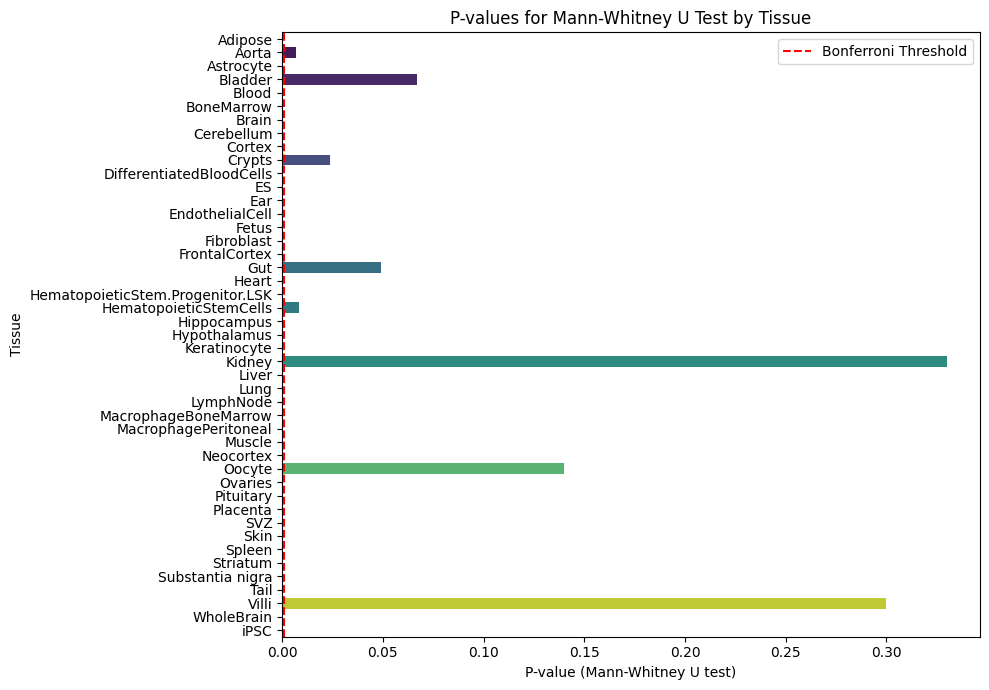

In [160]:
### Plot the P-values for the Mann-Whitney U Test by Tissue

# Sort the dataframe by 'P-value (Mann-Whitney U test)' column
sorted_df = complete_vs_tissues_comparison_results_df.sort_values(by='P-value (Mann-Whitney U test)')

# Convert p-values to float for plotting
sorted_df['P-value (Mann-Whitney U test)'] = sorted_df['P-value (Mann-Whitney U test)'].astype(float)

# Sort by tissue name
sorted_df = sorted_df.sort_values(by='Tissue')

# Bar Plot for P-values
plt.figure(figsize=(10, 7))
sns.barplot(x='P-value (Mann-Whitney U test)', y='Tissue', data=sorted_df, hue='Tissue', legend=False, dodge=False, palette='viridis')
plt.axvline(x=alpha_corrected, color='red', linestyle='--', label='Bonferroni Threshold')
plt.title('P-values for Mann-Whitney U Test by Tissue')
plt.xlabel('P-value (Mann-Whitney U test)')
plt.ylabel('Tissue')
plt.legend()
plt.tight_layout()
plt.show()


c:\Users\Catia Antunes\AppData\Local\Programs\Python\Python312\Lib\site-packages\pandas\core\arraylike.py:399: RuntimeWarning: divide by zero encountered in log10
  result = getattr(ufunc, method)(*inputs, **kwargs)


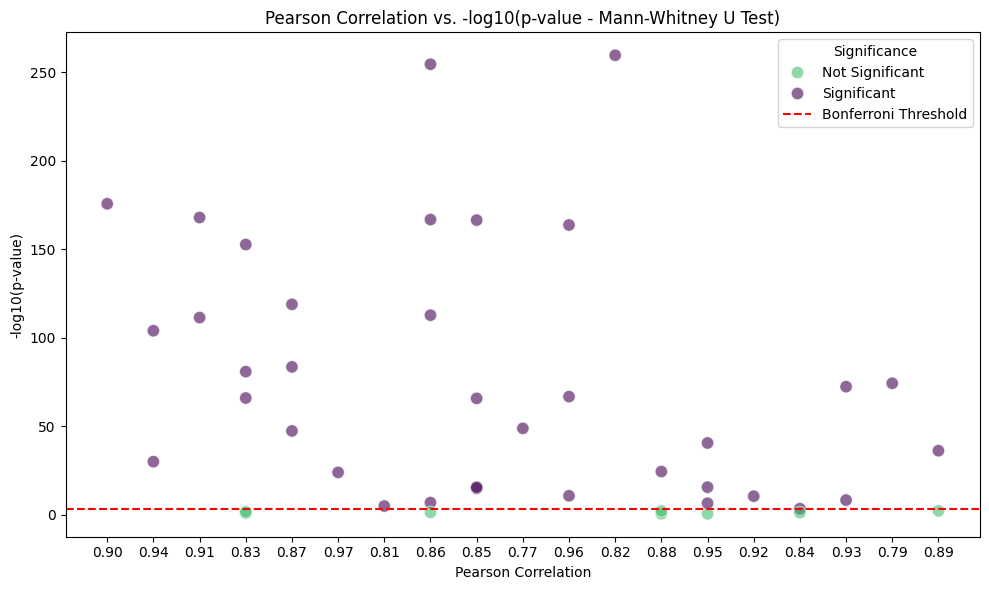

In [120]:
### Volcano plot for Pearson Correlation vs. -log10(p-value) for the Mann-Whitney U Test

# Prepare data for volcano plot
volcano_data = sorted_df.copy()
volcano_data['-log10(p-value)'] = -np.log10(volcano_data['P-value (Mann-Whitney U test)'].astype(float))

# Define a custom palette
palette = {True: sns.color_palette("viridis", as_cmap=True)(0.0), False: sns.color_palette("viridis", as_cmap=True)(0.7)}

# Volcano Plot
plt.figure(figsize=(10, 6))
scatter = sns.scatterplot(x='Pearsons Correlation', 
                          y='-log10(p-value)', 
                          hue='Significant (Bonferroni)', 
                          data=volcano_data, 
                          palette=palette,
                          s=80,
                          alpha=0.6)


threshold_line = plt.axhline(y=-np.log10(alpha_corrected), color='red', linestyle='--', label='Bonferroni Threshold')
plt.title('Pearson Correlation vs. -log10(p-value - Mann-Whitney U Test)')
plt.xlabel('Pearson Correlation')
plt.ylabel('-log10(p-value)')

# Customize the legend
handles, labels = scatter.get_legend_handles_labels()
new_labels = ['Not Significant' if label == 'False' else 'Significant' for label in labels]

# Remove the redundant 'Significant' line handle and label
handles = handles[:2]
new_labels = new_labels[:2]

# Add the threshold line handle and label
handles.append(threshold_line)
new_labels.append('Bonferroni Threshold')

plt.legend(handles=handles, labels=new_labels, title='Significance')

plt.tight_layout()
plt.show()




c:\Users\Catia Antunes\AppData\Local\Programs\Python\Python312\Lib\site-packages\pandas\core\arraylike.py:399: RuntimeWarning: divide by zero encountered in log10
  result = getattr(ufunc, method)(*inputs, **kwargs)


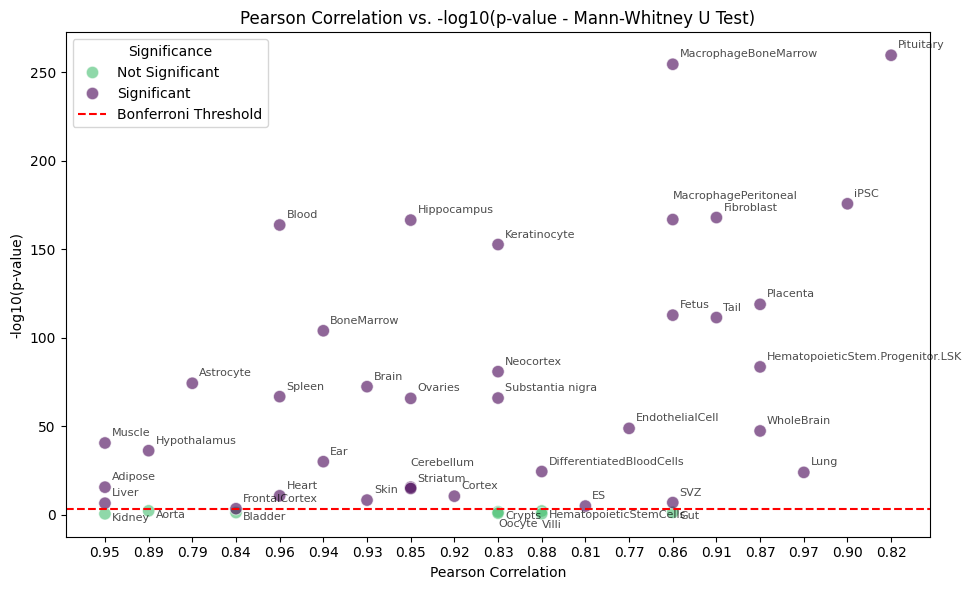

In [157]:
### Volcano plot for Pearson Correlation vs. -log10(p-value) for the Mann-Whitney U Test - WITH NAMES

# Prepare data for volcano plot
volcano_data = sorted_df.copy()
volcano_data['-log10(p-value)'] = -np.log10(volcano_data['P-value (Mann-Whitney U test)'].astype(float))

# Print out significant points to check
significant_points = volcano_data[volcano_data['Significant (Bonferroni)'] == True]
non_significant_points = volcano_data[volcano_data['Significant (Bonferroni)'] == False]

# Define a custom palette
palette = {True: sns.color_palette("viridis", as_cmap=True)(0.0), False: sns.color_palette("viridis", as_cmap=True)(0.7)}

# Volcano Plot
plt.figure(figsize=(10, 6))
scatter = sns.scatterplot(x='Pearsons Correlation', 
                          y='-log10(p-value)', 
                          hue='Significant (Bonferroni)', 
                          data=volcano_data, 
                          palette=palette,
                          s=80,
                          alpha=0.6)

threshold_line = plt.axhline(y=-np.log10(alpha_corrected), color='red', linestyle='--', label='Bonferroni Threshold')
plt.title('Pearson Correlation vs. -log10(p-value - Mann-Whitney U Test)')
plt.xlabel('Pearson Correlation')
plt.ylabel('-log10(p-value)')

# Annotate significant points
for idx, row in non_significant_points.iterrows():
    # if tissue is oocyte, rotate the text
    if row['Tissue'] == 'Oocyte' or row['Tissue'] == 'Villi':
        plt.annotate(row['Tissue'], 
                     (row['Pearsons Correlation'], row['-log10(p-value)']),
                     xytext=(0, -10), 
                     textcoords='offset points',
                     fontsize=8,
                     alpha=0.7,
                     rotation=0)
    else:
        plt.annotate(row['Tissue'], 
                     (row['Pearsons Correlation'], row['-log10(p-value)']),
                     xytext=(5, -5), 
                     textcoords='offset points',
                     fontsize=8,
                     alpha=0.7,
                     rotation=0)

for idx, row in significant_points.iterrows():
    # if tissue is oocyte, rotate the text
    if row['Tissue'] == 'Cerebellum' or row['Tissue'] == 'MacrophagePeritoneal':
        plt.annotate(row['Tissue'], 
                     (row['Pearsons Correlation'], row['-log10(p-value)']),
                     xytext=(0, 15), 
                     textcoords='offset points',
                     fontsize=8,
                     alpha=0.7,
                     rotation=0)
    else:
        plt.annotate(row['Tissue'], 
                     (row['Pearsons Correlation'], row['-log10(p-value)']),
                     xytext=(5, 5), 
                     textcoords='offset points',
                     fontsize=8,
                     alpha=0.7,
                     rotation=0)

# Customize the legend
handles, labels = scatter.get_legend_handles_labels()
new_labels = ['Not Significant' if label == 'False' else 'Significant' for label in labels]

# Remove the redundant 'Significant' line handle and label
handles = handles[:2]
new_labels = new_labels[:2]

# Add the threshold line handle and label
handles.append(threshold_line)
new_labels.append('Bonferroni Threshold')

plt.legend(handles=handles, labels=new_labels, title='Significance')

plt.tight_layout()
plt.show()


**General Observations**

1. Normality Tests:
    Complete Dataset and Tissue Dataset fail the normality tests for all tissues, as indicated by the False values under "Normality (Complete dataset) Passed" and "Normality (Tissue dataset) Passed".
    The Anderson-Darling test statistics are quite high compared to the critical values for all tissues, suggesting non-normal distributions.

2. Equal Variances:
    The p-values for Levene’s test indicate that the variances between the complete dataset and the tissue-specific dataset are significantly different for all tissues, as all p-values are extremely small (less than 0.05).

3. Test P-values:
    T-test P-value: Very small for all tissues, indicating significant differences in means assuming normality and equal variances, so not relevant here.
    Welch's T-test P-value: Also very small for all tissues, indicating significant differences in means assuming normality but allowing for unequal variances, also not relevant here.
    Mann-Whitney U Test P-value: Extremely small for all tissues, suggesting significant differences in distributions without any assumption of normality.Given that both datasets fail the normality test for all tissues and variances are not equal across datasets the Mann-Whitney U test is the most appropriate test for assessing differences between the complete dataset and the tissue-specific datasets. This non-parametric test does not assume normality and is robust to differences in variances.

**Summary for Each Tissue**

High Pearson Correlation: The correlation values are high, indicating strong linear relationships between the complete dataset and tissue-specific datasets. This suggests that while distributions may differ, there is still a strong linear association.

P-values: The extremely low p-values for the Mann-Whitney U test across all tissues suggest that there is a significant difference in distributions between the complete dataset and the tissue-specific datasets.

Mann-Whitney U Test as Best Fit: Since all datasets fail the normality test and have unequal variances, the Mann-Whitney U test, being non-parametric and robust to such conditions, is the recommended test to use for evaluating differences between the datasets.

**Conclusion:**

Most tissues show high Pearson correlation values, indicating that the methylation patterns in the complete dataset are well represented in tissue-specific datasets.
Mann-Whitney U test results show significant differences in mean methylation values for most tissues, suggesting that specific tissues have distinct methylation profiles.
Some tissues, like Adipose and Heart, show high correlation but do not exhibit significant differences in means according to t-tests, which could indicate that while the overall patterns are similar, the actual mean values are not significantly different.

**Further Considerations**

Effect Size: It might be useful to calculate effect sizes for the Mann-Whitney U test (e.g., rank-biserial correlation) to understand the magnitude of differences.

#### 3.2. Compare the Mean Methylation Values Between Clocks and Tissue-Specific Datasets (Clocks vs Tissue)

In [ ]:
### CLOCKS VS TISSUES: Testing normality and variance equality [with Anderson-Darling test and Levene's test] and performing comparisons [with t-test, Welch's t-test, and Mann-Whitney U test] for each tissue-specific dataset

# Define the updated function to test assumptions and perform comparisons
@delayed
def test_assumptions_and_compare(tissue_mean_var, clock_mean_var, clock_name, tissue_name):
    # Compute the common CpGs
    common_cpgs = set(tissue_mean_var['CpG']).intersection(set(clock_mean_var['CpG']))
    
    # Subset the dataframes to only the common CpGs
    tissue_mean = tissue_mean_var[tissue_mean_var['CpG'].isin(common_cpgs)].set_index('CpG')['Mean']
    clock_mean = clock_mean_var[clock_mean_var['CpG'].isin(common_cpgs)].set_index('CpG')['Mean']
    
    # Perform Anderson-Darling test for normality
    ad_result_tissue = anderson(tissue_mean)
    ad_result_clock = anderson(clock_mean)
    
    # Check if the test statistic is within the critical values for the Anderson-Darling test
    p_value_normality_tissue = ad_result_tissue.statistic
    p_value_normality_clock = ad_result_clock.statistic
    
    # Check if the test statistic exceeds the critical values
    normality_tissue = ad_result_tissue.statistic < ad_result_tissue.critical_values[2]
    normality_clock = ad_result_clock.statistic < ad_result_clock.critical_values[2]
    
    # Perform Levene's test for equal variances
    _, p_value_levene = levene(tissue_mean, clock_mean)
    
    # Calculate Pearson correlation coefficient
    correlation, _ = pearsonr(tissue_mean, clock_mean)

    # Calculate Spearman correlation
    spearman_corr, _ = spearmanr(tissue_mean, clock_mean)
    
    # Perform t-test
    t_statistic_ttest, p_value_ttest = ttest_ind(tissue_mean, clock_mean, equal_var=True)
    
    # Perform Welch's t-test
    t_statistic_welch, p_value_welch = ttest_ind(tissue_mean, clock_mean, equal_var=False)
    
    # Perform Mann-Whitney U test
    u_statistic, p_value_mannwhitneyu = mannwhitneyu(tissue_mean, clock_mean)
    
    # Append comparison results to the list
    return {
        'Clock': clock_name,
        'Tissue': tissue_name,
        'Pearson\'s Correlation': f'{correlation:.2f}',
        'Spearman\'s Correlation': f'{spearman_corr:.2f}',
        'P-value (t-test)': p_value_ttest,
        'P-value (Mann-Whitney U test)': p_value_mannwhitneyu,
        'P-value (Welch\'s t-test)': p_value_welch,
        'Normality (Tissue dataset) Statistic': p_value_normality_tissue,
        'Normality (Clock dataset) Statistic': p_value_normality_clock,
        'Normality (Tissue dataset) Passed': normality_tissue,
        'Normality (Clock dataset) Passed': normality_clock,
        'Equal Variances': p_value_levene,
    }

# Start Dask client
client = Client()

# Define the folder name for clock and tissue data
clock_folder_name = "../Clocks Methylation Data"
tissue_folder_name = "../Tissue Methylation"

# List of clock names
clock_names = [
    'Clock1', 'Clock2', 'Clock3', 'Clock2_3',
    'Clock1_human', 'Clock2_human', 'Clock3_human', 'Clock2_3_human',
    'Clock1_top100CpG', 'Clock2_top100CpG', 'Clock3_top100CpG', 'Clock2_3_top100CpG',
    'Clock1_top100CpG_human', 'Clock2_top100CpG_human', 'Clock3_top100CpG_human', 'Clock2_3_top100CpG_human',
    'Clock1_top200CpG', 'Clock2_top200CpG', 'Clock3_top200CpG', 'Clock2_3_top200CpG',
    'Clock1_top200CpG_human', 'Clock2_top200CpG_human', 'Clock3_top200CpG_human', 'Clock2_3_top200CpG_human'
]


# # Dictionary to store the DataFrames
# clocks_data = {}

# # Load each CSV file into a pandas DataFrame and store it in the dictionary
# for clock_name in clock_names:
#     file_name = os.path.join(folder_name, f"{clock_name}_methylation_dataset_complete_mean_var.csv")
#     if os.path.exists(file_name):
#         clocks_data[clock_name] = pd.read_csv(file_name)
#     else:
#         print(f"File {file_name} does not exist.")

# print("Clocks data loaded successfully.")

# Load clocks data
clocks = []
for clock_name in clock_names:
    clock_var_name = f"{clock_name.lower()}_mean_var"
    file_path = os.path.join(clock_folder_name, f"{clock_name}_methylation_dataset_complete_mean_var.csv")
    globals()[clock_var_name] = dd.read_csv(file_path, sample=10 * 1024 * 1024).compute()
    clocks.append(globals()[clock_var_name])

# Load tissue data
# tissues = tissues_df['Tissue'].unique() #overwrites the filtered tissues this 
for tissue in tissues:
    tissue_var_name = f"{tissue}_mean_var"
    file_path = os.path.join(tissue_folder_name, f"{tissue}_methylation_dataset_complete_mean_var.csv")
    globals()[tissue_var_name] = dd.read_csv(file_path, sample=10 * 1024 * 1024).compute()

# Scatter the tissue data
scattered_tissues = {}
for tissue in tissues:
    tissue_var_name = f"{tissue}_mean_var"
    scattered_tissues[tissue] = client.scatter(globals()[tissue_var_name])

# Scatter the clock data
scattered_clocks = {}
for clock_df, clock_name in zip(clocks, clock_names): # clocks? or clocks_data?
    clock_var_name = f"{clock_name.lower()}_mean_var"
    scattered_clocks[clock_name] = client.scatter(globals()[clock_var_name])

# Perform the comparisons for each clock dataset against each tissue dataset
tasks = []
for tissue in tissues:
    for clock_name in clock_names:
        tasks.append(test_assumptions_and_compare(scattered_tissues[tissue], scattered_clocks[clock_name], clock_name, tissue))

# Compute all tasks in parallel
comparison_results = compute(*tasks)

# Convert the list of dictionaries to a DataFrame
comparison_results_clocks_df = pd.DataFrame(comparison_results)

# Sort by P-value (Mann-Whitney U test) in ascending order
comparison_results_clocks_df.sort_values(by='P-value (Mann-Whitney U test)', ascending=True, inplace=True)

# Apply Bonferroni correction
alpha = 0.05
num_tests = len(comparison_results_clocks_df)  # Number of tests or comparisons performed
alpha_corrected = alpha / num_tests  # Bonferroni corrected significance level

# Add a new column for significance after Bonferroni correction
comparison_results_clocks_df['Significant (Bonferroni)'] = comparison_results_clocks_df['P-value (Mann-Whitney U test)'].astype(float) < alpha_corrected

# Save the results to a CSV file
folder = "Comparison Results"
os.makedirs(folder, exist_ok=True)
file_path = os.path.join(folder, "Complete_VS_Clocks_results_bonferroni.csv")
comparison_results_clocks_df.to_csv(file_path, index=False)

# Print or further analyze the comparison results
comparison_results_clocks_df

# Shutdown the client when done
client.shutdown()

In [10]:
comparison_results_clocks_df

,Clock,Tissue,Pearson's Correlation,Spearman's Correlation,P-value (t-test),P-value (Mann-Whitney U test),P-value (Welch's t-test),Normality (Tissue dataset) Statistic,Normality (Clock dataset) Statistic,Normality (Tissue dataset) Passed,Normality (Clock dataset) Passed,Equal Variances,Significant (Bonferroni)
461,Clock2_human,Pituitary,0.02,0.00,0.000009,2.539286e-07,0.000009,32.754198,43.112733,False,False,0.003816,True
462,Clock3_human,Pituitary,0.05,0.05,0.000029,7.736639e-07,0.000029,30.159572,40.670318,False,False,0.002087,True
476,Clock1_top200CpG_human,Pituitary,-0.01,0.01,0.000012,1.942085e-06,0.000012,4.507319,8.388899,False,False,0.299808,True
793,Clock2,MacrophageBoneMarrow,0.03,0.02,0.013751,7.210434e-06,0.013753,56.871510,39.015550,False,False,0.000024,True
318,Clock3_human,Hippocampus,0.04,0.04,0.000251,8.564500e-06,0.000251,29.352691,40.670318,False,False,0.004839,True
...,...,...,...,...,...,...,...,...,...,...,...,...,...
35,Clock2_3_top100CpG,Liver,0.08,0.14,0.917825,9.892778e-01,0.917825,7.496954,7.409005,False,False,0.957134,False
765,Clock2_top200CpG_human,MacrophagePeritoneal,0.01,0.04,0.833481,9.899934e-01,0.833481,15.499821,12.268184,False,False,0.087493,False
376,Clock1_top200CpG,Adipose,-0.01,0.00,0.985765,9.913736e-01,0.985765,5.958736,5.230122,False,False,0.339887,False
499,Clock2_3_top200CpG,BoneMarrow,-0.16,-0.13,0.874927,9.948241e-01,0.874927,12.101446,11.536775,False,False,0.589611,False


In [11]:
### Result Summary

alpha = 0.05
num_tests = len(comparison_results_clocks_df)  # Number of tests or comparisons performed
alpha_corrected = alpha / num_tests  # Bonferroni corrected significance level

# Print the corrected significance level
print(f'Bonferroni Corrected Significance Level: {alpha_corrected:.5f}')

# Count the number of tissues for which the P-value (Mann-Whitney U Test) is less than 0.05
significant_tissues_clocks = comparison_results_clocks_df[comparison_results_clocks_df['P-value (Mann-Whitney U test)'] < alpha_corrected]['Tissue'].nunique()
print(f'Number of Tissues with significant differences (P-value < {alpha_corrected}): {significant_tissues_clocks}')

# List of tissues with significant differences in mean methylation values compared to the complete dataset
significant_tissues_list_clocks = comparison_results_clocks_df[comparison_results_clocks_df['P-value (Mann-Whitney U test)'] < alpha_corrected]['Tissue'].unique()
print(f'Tissues with significant differences (P-value < {alpha_corrected}):\n{significant_tissues_list_clocks}')

# Count the number of Clocks for which the P-value (Mann-Whitney U Test) is less than 0.05
significant_clocks = comparison_results_clocks_df[comparison_results_clocks_df['P-value (Mann-Whitney U test)'] < alpha_corrected]['Clock'].nunique()
print(f'Number of Clocks with significant differences (P-value < {alpha_corrected}): {significant_clocks}')

# List of clocks with significant differences in mean methylation values compared to the complete dataset
significant_clocks_list = comparison_results_clocks_df[comparison_results_clocks_df['P-value (Mann-Whitney U test)'] < alpha_corrected]['Clock'].unique()
print(f'Clocks with significant differences (P-value < {alpha_corrected}):\n{significant_clocks_list}')

Bonferroni Corrected Significance Level: 0.00005
Number of Tissues with significant differences (P-value < 4.62962962962963e-05): 7
Tissues with significant differences (P-value < 4.62962962962963e-05):
['Pituitary' 'MacrophageBoneMarrow' 'Hippocampus' 'Fetus' 'Placenta'
 'Ovaries' 'iPSC']
Number of Clocks with significant differences (P-value < 4.62962962962963e-05): 4
Clocks with significant differences (P-value < 4.62962962962963e-05):
['Clock2_human' 'Clock3_human' 'Clock1_top200CpG_human' 'Clock2']


2024-08-12 10:55:53,576 - distributed.utils_perf - WARNING - full garbage collections took 18% CPU time recently (threshold: 10%)


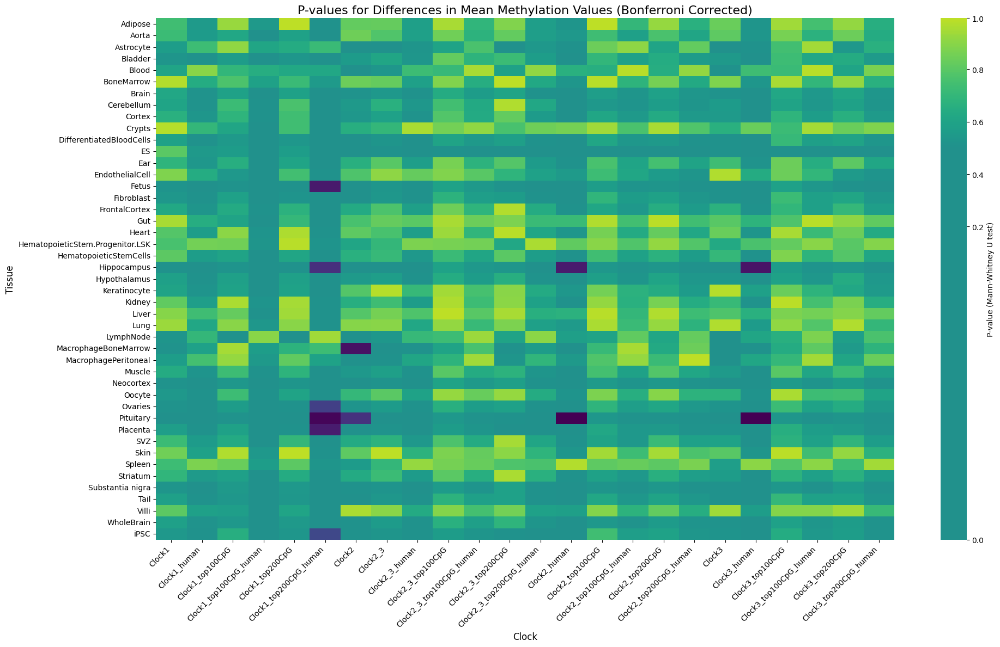

In [14]:
### Heatmap for P-values of Mann-Whitney U Test (PROBLEM WITH THE SCALE BAR)

# Assuming comparison_results_clocks_df is your DataFrame

# Create a pivot table for the heatmap
heatmap_data = comparison_results_clocks_df.pivot(index='Tissue', columns='Clock', values='P-value (Mann-Whitney U test)')

# Create a custom colormap
cmap = plt.colormaps['viridis']
colors = np.concatenate([
    cmap(np.linspace(0, 0.3, 100)),  # Colors for significant values
    cmap(np.linspace(0.5, 0.9, 100))  # Colors for non-significant values
])
custom_cmap = mcolors.ListedColormap(colors)

# Create a normalization that will map the p-values to color indices
class MidpointNormalize(mcolors.Normalize):
    def __init__(self, vmin=None, vmax=None, midpoint=None, clip=False):
        self.midpoint = midpoint
        mcolors.Normalize.__init__(self, vmin, vmax, clip)

    def __call__(self, value, clip=None):
        x, y = [self.vmin, self.midpoint, self.vmax], [0, 0.5, 1]
        return np.ma.masked_array(np.interp(value, x, y))

# Create a figure with a larger size
plt.figure(figsize=(20, 12))

# Create the heatmap
norm = MidpointNormalize(vmin=0, vmax=heatmap_data.max().max(), midpoint=alpha_corrected)
ax = sns.heatmap(heatmap_data, cmap=custom_cmap, norm=norm,
                 annot=False, fmt='.2e', 
                 cbar_kws={'label': 'P-value (Mann-Whitney U test)'})

# Customize the plot
plt.title('P-values for Differences in Mean Methylation Values (Bonferroni Corrected)', fontsize=16)
plt.xlabel('Clock', fontsize=12)
plt.ylabel('Tissue', fontsize=12)

# Rotate x-axis labels for better readability
plt.xticks(rotation=45, ha='right')

# Adjust layout to prevent cutting off labels
plt.tight_layout()

# Show the plot
plt.show()


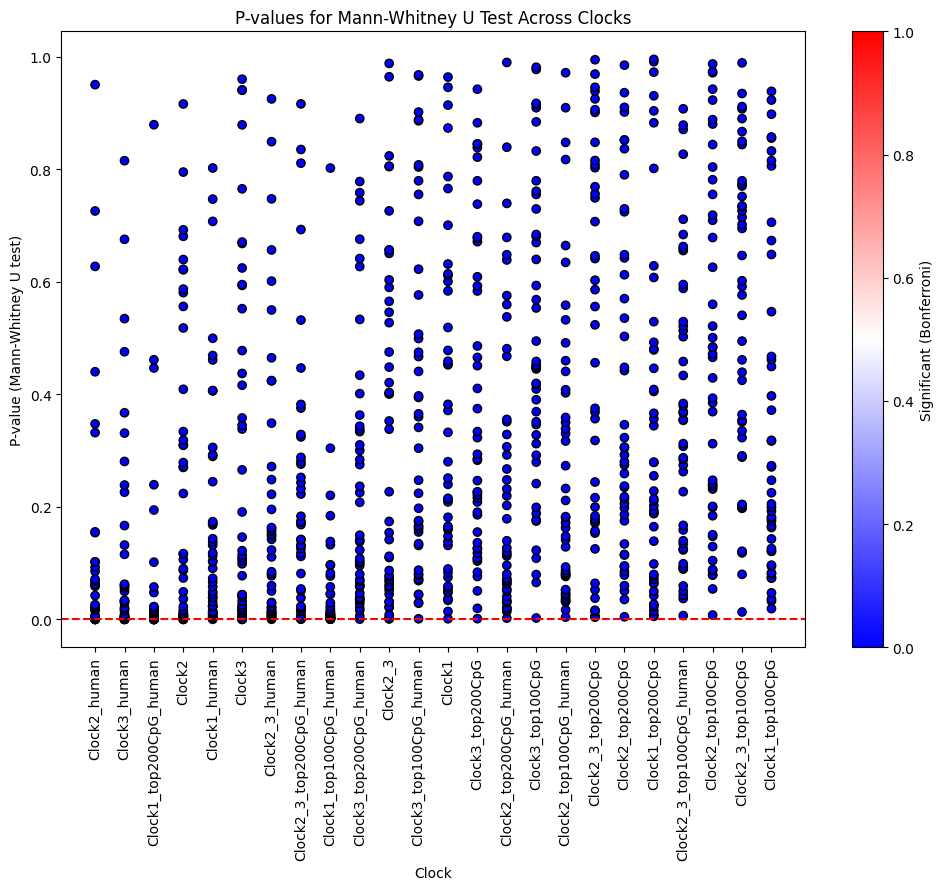

In [15]:
### Scatter plot of P-values for Mann-Whitney U Test Across Clocks

plt.figure(figsize=(12, 8))
plt.scatter(comparison_results_clocks_df['Clock'], comparison_results_clocks_df['P-value (Mann-Whitney U test)'], c=comparison_results_clocks_df['Significant (Bonferroni)'], cmap='bwr', edgecolors='k')
plt.axhline(y=alpha_corrected, color='r', linestyle='--')
plt.xlabel('Clock')
plt.ylabel('P-value (Mann-Whitney U test)')
plt.title('P-values for Mann-Whitney U Test Across Clocks')
plt.xticks(rotation=90)
plt.colorbar(label='Significant (Bonferroni)')
plt.show()

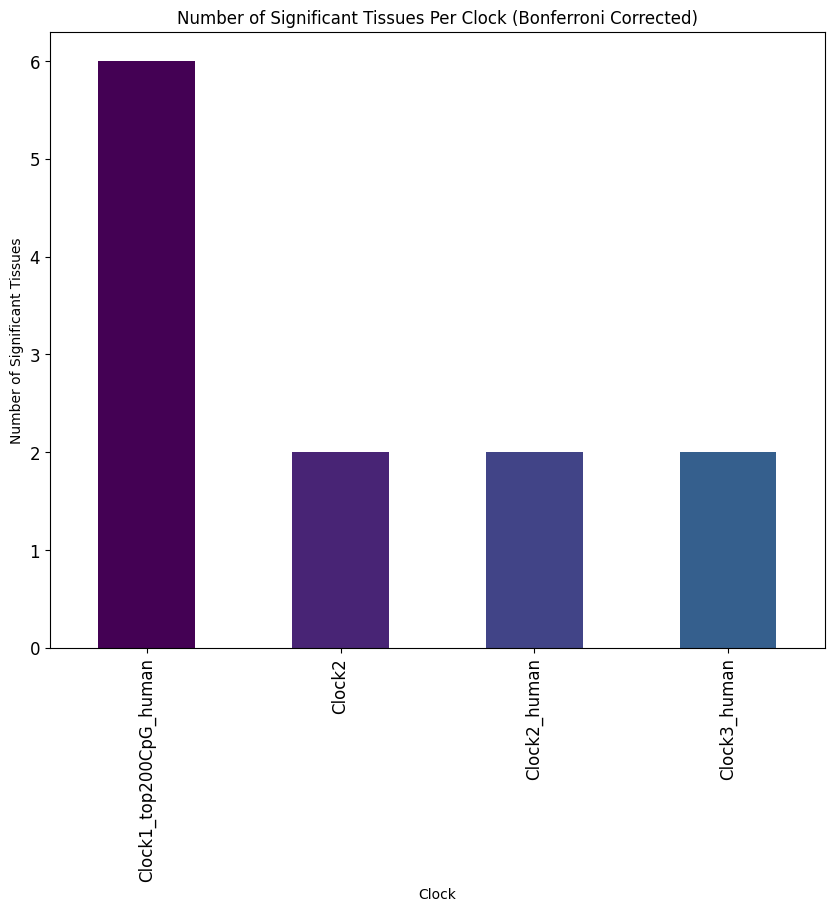

In [17]:
### Number of significant tissues per clock

# Count the number of significant tissues per clock
significant_tissues_per_clock = significant_results.groupby('Clock').size()

# Use the viridis palette
colors = sns.color_palette("viridis", as_cmap=True)

# Bar plot for significant tissues per clock
plt.figure(figsize=(10, 8))
significant_tissues_per_clock.plot(kind='bar', color=colors(np.linspace(0, 0.3, len(significant_tissues_per_clock))), fontsize=12)
plt.xlabel('Clock')
plt.ylabel('Number of Significant Tissues')
plt.title('Number of Significant Tissues Per Clock (Bonferroni Corrected)')
plt.xticks(rotation=90)
plt.show()


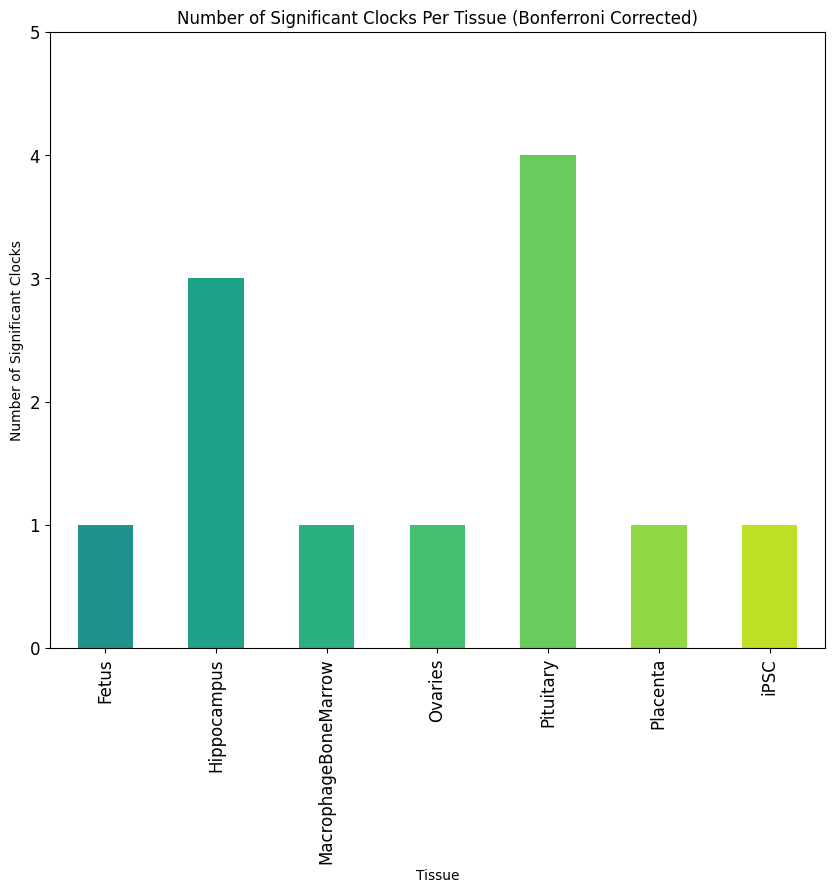

In [18]:
### Number of significant clocks per tissue

# Count the number of significant clocks per tissue
significant_clocks_per_tissue = significant_results.groupby('Tissue').size()

# Use the viridis palette
colors = sns.color_palette("viridis", as_cmap=True)

# Bar plot for significant clocks per tissue
plt.figure(figsize=(10, 8))
significant_clocks_per_tissue.plot(kind='bar', color=colors(np.linspace(0.5, 0.9, len(significant_clocks_per_tissue))), fontsize=12)
plt.xlabel('Tissue')
plt.ylabel('Number of Significant Clocks')
plt.title('Number of Significant Clocks Per Tissue (Bonferroni Corrected)')
plt.xticks(rotation=90)

# Set y-axis ticks to be every 1.0
y_max = significant_clocks_per_tissue.max() + 1  # Calculate the maximum value for the y-axis
plt.yticks(np.arange(0, y_max + 1, 1))

plt.show()

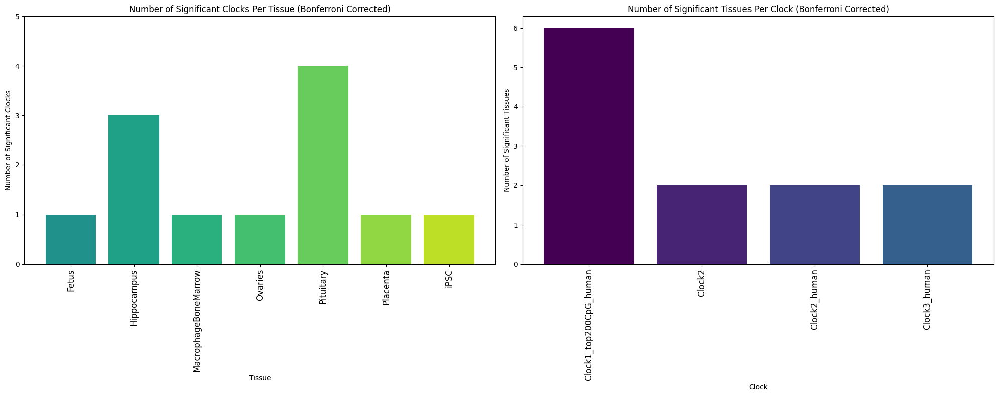

In [21]:
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np

# Assuming 'significant_results' is already defined

# Count the number of significant tissues per clock
significant_tissues_per_clock = significant_results.groupby('Clock').size()

# Count the number of significant clocks per tissue
significant_clocks_per_tissue = significant_results.groupby('Tissue').size()

# Use the viridis palette
colors = sns.color_palette("viridis", as_cmap=True)

# Create a figure with two subplots (side by side)
fig, axs = plt.subplots(1, 2, figsize=(20, 8))

# Bar plot for significant tissues per clock
axs[1].bar(significant_tissues_per_clock.index, significant_tissues_per_clock, 
           color=colors(np.linspace(0, 0.3, len(significant_tissues_per_clock))))
axs[1].set_xlabel('Clock')
axs[1].set_ylabel('Number of Significant Tissues')
axs[1].set_title('Number of Significant Tissues Per Clock (Bonferroni Corrected)')
axs[1].tick_params(axis='x', rotation=90, labelsize=12)

# Bar plot for significant clocks per tissue
axs[0].bar(significant_clocks_per_tissue.index, significant_clocks_per_tissue, 
           color=colors(np.linspace(0.5, 0.9, len(significant_clocks_per_tissue))))
axs[0].set_xlabel('Tissue')
axs[0].set_ylabel('Number of Significant Clocks')
axs[0].set_title('Number of Significant Clocks Per Tissue (Bonferroni Corrected)')
axs[0].tick_params(axis='x', rotation=90, labelsize=12)

# Set y-axis ticks for the second plot to be every 1.0
y_max = significant_clocks_per_tissue.max() + 1
axs[0].set_yticks(np.arange(0, y_max + 1, 1))

# Adjust layout to prevent overlap
plt.tight_layout()

# Show the combined plot
plt.show()
